<h1 style="text-align: center;"> STRATIFICATION OF PARKINSON'S DISEASE USING GENERAL LINEAR MODELS WITH MR IMAGES </h1>

##### This notebook contains all the analyses conducted after the extraction of ROI intensities, including:
- Normalization of the extracted signal intensities from substantia nigra pars compacta (SNpc), locus coeruleus (LC) and putamen, on extracted white matter (WM) intensities  
- Merging of the MRI data into one combined MRI dataset
- Merging MRI data with clinical data into one total dataset
- Statistical analyses: Statistical tests (PD vs HC, PIGD vs TD, HC vs PIGD vs TD vs Indeterminate), laterality assessment and effect size (Cohen's d value)
- Generalized Linear Models (GLMs) analyses: HC, PD, PIGD and TD
- Code for all plots (violin plots, bar plots) presented in the results chapter

In [1]:
import os
import numpy as np
import pandas as pd 
from pandas.api.types import CategoricalDtype
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px 
import plotly.graph_objects as go
from plotly.subplots import make_subplots 

from sklearn.preprocessing import LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler

import statsmodels.api as sm
from statsmodels.stats.diagnostic import het_breuschpagan

import scipy.stats as stats
from scipy.stats import norm, gaussian_kde 
from scipy.stats import ttest_ind, mannwhitneyu, ttest_rel, wilcoxon, f_oneway, kruskal
from scipy.stats import shapiro, kstest

<h1 style="text-align: center;"> MRI DATA ANALYSIS </h1>

General comment on MRI data: The process of extracting mean intensities from the ROIs was sometimes disrupted when the Linux server crashed midway. As a result, the extraction had to be performed in batches or separately for the cases that were missed due to the crashes. 
- The intensities for WM and putamen were successfully extracted for all participants in one go
- The SNpc extraction required two rounds, and the LC intensities for all participants were extracted after eight rounds
- This part consists of merging all the batches together for each ROI, and then combining it all into one total MRI dataset

### SNpc

In [2]:
sn_data_1 = pd.read_csv("mri_data_sn.csv")
sn_data_1.shape

(66, 142)

In [3]:
sn_data_2 = pd.read_csv("mri_data_sn_missing_patients.csv")
sn_data_2.shape

(15, 118)

In [4]:
wm_data = pd.read_csv("mri_data_white.csv")
wm_data.shape

(81, 48)

In [5]:
sn_data_filtered = sn_data_1[sn_data_2.columns]
merged_data = pd.concat([sn_data_filtered, sn_data_2], ignore_index=True)
merged_file = 'mri_data_sn_merged.csv'
merged_data.to_csv(merged_file, index=False)
print(f"The merged dataset has shape {merged_data.shape}. Saved to {merged_file}")

The merged dataset has shape (81, 118). Saved to mri_data_sn_merged.csv


SNpc mean intensities normalized with WM intensities

In [6]:
# loading the SNpc and WM files
sn_data = pd.read_csv("mri_data_sn_merged.csv")
sn_data.rename(columns={"Patient Number": "patient_id"}, inplace=True)
wm_data.rename(columns={"Patient Number": "patient_id"}, inplace=True)

# remove "mask_" from column names
sn_data.columns = [
    col.replace("mask_", "") if col != "patient_id" else col for col in sn_data.columns
]

# align rows based on common patient IDs
common_patient_ids = set(sn_data['patient_id']).intersection(wm_data['patient_id'])
sn_data = sn_data[sn_data['patient_id'].isin(common_patient_ids)].sort_values(by="patient_id").reset_index(drop=True)
wm_data = wm_data[wm_data['patient_id'].isin(common_patient_ids)].sort_values(by="patient_id").reset_index(drop=True)

# add space between prefix and modality name
def add_space(col_name):
    if col_name.startswith("SN_R_"):
        return col_name.replace("SN_R_", "SN_R ")  
    elif col_name.startswith("SN_L_"):
        return col_name.replace("SN_L_", "SN_L ")  
    elif col_name.startswith("SN_"):
        return col_name.replace("SN_", "SN ")  
    elif col_name.startswith("white_"):
        return col_name.replace("white_", "white ") 
    return col_name

sn_data.columns = [add_space(col) for col in sn_data.columns]
wm_data.columns = [add_space(col) for col in wm_data.columns]

# define function to match column names
def match_columns(col_name):
    if col_name.startswith("SN_R "):
        return col_name[5:]  
    elif col_name.startswith("SN_L "):
        return col_name[5:] 
    elif col_name.startswith("SN "):
        return col_name[3:] 
    return col_name

# normalize SNpc intensities and store in a dictionary
normalized_cols = {}

for sn_col in sn_data.columns:
    if sn_col != 'patient_id':  
        core_col_name = match_columns(sn_col)  
        matching_white_col = next((col for col in wm_data.columns if col.strip() == f"white {core_col_name}"), None)
        
        if matching_white_col:
            normalized_cols[sn_col] = sn_data[sn_col] / wm_data[matching_white_col]
        else:
            print(f"No matching column for {sn_col} found in 'wm_data'.")

normalized_df = pd.DataFrame(normalized_cols)
result = pd.concat([sn_data[['patient_id']], normalized_df], axis=1)

# save the resulting dataframe
result.to_csv("normalized_SN.csv", index=False)
print("Normalization completed and file saved as 'normalized_SN.csv'.")


Normalization completed and file saved as 'normalized_SN.csv'.


Patient IDs were cross-referenced with personal IDs using a reference datasheet, in preparation for merging the MRI data with the clinical data

In [7]:

with_personal_id = pd.read_csv("ref_personal_id.csv", delimiter = ";", skip_blank_lines=True)
with_personal_id = with_personal_id.dropna(how='all')
id_mapping = dict(zip(with_personal_id['patient_id'], with_personal_id['personal_id']))
no_personal_id = pd.read_csv("normalized_SN.csv")
no_personal_id['personal_id'] = no_personal_id['patient_id'].map(id_mapping)
no_personal_id = no_personal_id.dropna(subset=['personal_id'])
personal_id_added = no_personal_id.sort_values(by='personal_id')
columns = ['personal_id'] + [col for col in personal_id_added.columns if col != 'personal_id']
personal_id_added = personal_id_added[columns]


personal_id_added.to_csv("updated_normalized_SN.csv", index=False)
print("File is updated with personal_id.")

File is updated with personal_id.


A total of 81 participants were processed (had intensities extracted), but only 75 had available personal IDs. Therefore, only these 75 participants were included in the study.

In [8]:
normalized_sn = pd.read_csv("normalized_SN.csv")
updated_normalized_sn = pd.read_csv("updated_normalized_SN.csv")
common_column = 'patient_id'  
extra_values = normalized_sn[~normalized_sn[common_column].isin(updated_normalized_sn[common_column])]

print("Personal ID for the following patient_id not in reference datasheet:")
print(extra_values[common_column])

Personal ID for the following patient_id not in reference datasheet:
18    000040B3
30    000074E5
36    00008289
42    00008C1B
45    000090BE
57    0000CAAB
Name: patient_id, dtype: object


### LC

In [9]:
lc_data_1 = pd.read_csv("mri_data_LC.csv")
lc_data_1.shape

(10, 118)

In [10]:
# merging all LC files together
missing_files = [
    'mri_data_LC_missing_patients.csv',
    'mri_data_LC_missing_patients_2.csv',
    'mri_data_LC_missing_patients_3.csv',
    'mri_data_LC_missing_patients_4.csv',
    'mri_data_LC_missing_patients_5.csv',
    'mri_data_LC_missing_patients_6.csv',
    'mri_data_LC_missing_patients_7.csv'
]
lc_data_1_columns = lc_data_1.columns
merged_data = lc_data_1.copy()
for file in missing_files:
    missing_data = pd.read_csv(file)
    extra_columns = [col for col in missing_data.columns if col not in lc_data_1_columns]
    if extra_columns:
        missing_data = missing_data.drop(columns=extra_columns)
    missing_data = missing_data[lc_data_1_columns]
    merged_data = pd.concat([merged_data, missing_data], ignore_index=True)
merged_data = merged_data.sort_values(by='Patient Number').drop_duplicates(subset='Patient Number', keep='last')
merged_data = merged_data.fillna(0)
merged_file = 'mri_data_lc_merged.csv'
merged_data.to_csv(merged_file, index=False)
print(f"The merged dataset has shape {merged_data.shape}. Saved to {merged_file}.")

The merged dataset has shape (81, 118). Saved to mri_data_lc_merged.csv.


LC mean intensities normalized with WM intensities

In [11]:
# loading the LC and WM files
lc_data = pd.read_csv("mri_data_lc_merged.csv")
lc_data.rename(columns={"Patient Number": "patient_id"}, inplace=True)
wm_data.rename(columns={"Patient Number": "patient_id"}, inplace=True)

# remove "mask_" from column names
lc_data.columns = [
    col.replace("mask_", "") if col != "patient_id" else col for col in lc_data.columns
]

# align rows based on common patient IDs
common_patient_ids = set(lc_data['patient_id']).intersection(wm_data['patient_id'])
lc_data = lc_data[lc_data['patient_id'].isin(common_patient_ids)].sort_values(by="patient_id").reset_index(drop=True)
wm_data = wm_data[wm_data['patient_id'].isin(common_patient_ids)].sort_values(by="patient_id").reset_index(drop=True)

# add space between prefix and modality name
def add_space(col_name):
    if col_name.startswith("LC_R_"):
        return col_name.replace("LC_R_", "LC_R ")  
    elif col_name.startswith("LC_L_"):
        return col_name.replace("LC_L_", "LC_L ")  
    elif col_name.startswith("LC_"):
        return col_name.replace("LC_", "LC ")  
    elif col_name.startswith("white_"):
        return col_name.replace("white_", "white ") 
    return col_name

lc_data.columns = [add_space(col) for col in lc_data.columns]
wm_data.columns = [add_space(col) for col in wm_data.columns]

# define function to match column names
def match_columns(col_name):
    if col_name.startswith("LC_R "):
        return col_name[5:]  
    elif col_name.startswith("LC_L "):
        return col_name[5:] 
    elif col_name.startswith("LC "):
        return col_name[3:] 
    return col_name

# normalize LC intensities and store in a dictionary
normalized_cols = {}

for lc_col in lc_data.columns:
    if lc_col != 'patient_id':  
        core_col_name = match_columns(lc_col)  
        matching_white_col = next((col for col in wm_data.columns if col.strip() == f"white {core_col_name}"), None)
        
        if matching_white_col:
            normalized_cols[lc_col] = lc_data[lc_col] / wm_data[matching_white_col]
        else:
            print(f"No matching column for {lc_col} found in 'wm_data'.")

normalized_df = pd.DataFrame(normalized_cols)
result = pd.concat([lc_data[['patient_id']], normalized_df], axis=1)

# save the resulting dataframe
result.to_csv("normalized_LC.csv", index=False)
print("Normalization completed and file saved as 'normalized_LC.csv'.")


Normalization completed and file saved as 'normalized_LC.csv'.


Patient IDs were cross-referenced with personal IDs using a reference datasheet, in preparation for merging the MRI data with the clinical data

In [12]:

with_personal_id = pd.read_csv("ref_personal_id.csv", delimiter = ";", skip_blank_lines=True)
with_personal_id = with_personal_id.dropna(how='all')
id_mapping = dict(zip(with_personal_id['patient_id'], with_personal_id['personal_id']))
no_personal_id = pd.read_csv("normalized_LC.csv")
no_personal_id['personal_id'] = no_personal_id['patient_id'].map(id_mapping)
no_personal_id = no_personal_id.dropna(subset=['personal_id'])
personal_id_added = no_personal_id.sort_values(by='personal_id')
columns = ['personal_id'] + [col for col in personal_id_added.columns if col != 'personal_id']
personal_id_added = personal_id_added[columns]

personal_id_added.to_csv("updated_normalized_LC.csv", index=False)
print("File updated with personal_id.")

File updated with personal_id.


### Putamen

In [13]:
putamen_data = pd.read_csv("mri_data_putamen.csv")
putamen_data.shape

(81, 142)

In [14]:
putamen_data = pd.read_csv("mri_data_putamen.csv")
outlier_participant = '00005018' 

# separate data for participant 00005018 and other participants
outlier_info = putamen_data[putamen_data['Patient Number'] == outlier_participant]
rest_data = putamen_data[putamen_data['Patient Number'] != outlier_participant]
count_col = rest_data.shape[0] 
common_columns = rest_data.columns[rest_data.notnull().sum() == count_col]
putamen_filtered = putamen_data[common_columns] 

merged_file = "mri_data_putamen_merged.csv"
putamen_filtered.to_csv(merged_file, index=False)
print(f"The merged dataset has shape {putamen_filtered.shape}. Saved to {merged_file}")

The merged dataset has shape (81, 117). Saved to mri_data_putamen_merged.csv


In [15]:
putamen_data = pd.read_csv("mri_data_putamen.csv")
outlier_participant = '00005018'
outlier_info = putamen_data[putamen_data['Patient Number'] == outlier_participant]
rest_data = putamen_data[putamen_data['Patient Number'] != outlier_participant]
count_col = rest_data.shape[0]
common_columns = rest_data.columns[rest_data.notnull().sum() == count_col]
original_columns = set(putamen_data.columns)
missing_columns = original_columns - set(common_columns)

print(f"Original number of columns: {len(original_columns)}")
print(f"Number of retained columns: {len(common_columns)}")
print(f"Missing columns: {missing_columns}")

Original number of columns: 142
Number of retained columns: 117
Missing columns: {'putamen_mask_STAGE_dSWI_ECHO-3_e3a_reg_mni', 'putamen_L_mask_STAGE_CROWN_PD_MAPa_reg_mni', 'putamen_R_mask_STAGE_CROWN_PD_MAPa_reg_mni', 'putamen_L_mask_STAGE_simFLAIRa_reg_mni', 'putamen_R_mask_STAGE_simFLAIRa_reg_mni', 'putamen_mask_STAGE_CROWN_PD_MAPa_reg_mni', 'putamen_mask_STAGE_mpSWIM_ECHO-3_e3a_reg_mni', 'putamen_R_mask_STAGE_R2S_e3a_reg_mni', 'putamen_mask_STAGE_simFLAIRa_reg_mni', 'putamen_R_mask_STAGE_T2S_e3a_reg_mni', 'putamen_mask_STAGE_T2S_e3a_reg_mni', 'putamen_R_mask_STAGE_mpSWIM_ECHO-3_e3a_reg_mni', 'putamen_R_mask_STAGE_sim_GREa_reg_mni', 'putamen_mask_mprage_reg_mni_betted', 'putamen_L_mask_mprage_reg_mni_betted', 'putamen_R_mask_mprage_reg_mni_limiting', 'putamen_mask_STAGE_R2S_e3a_reg_mni', 'putamen_R_mask_STAGE_dSWI_ECHO-3_e3a_reg_mni', 'putamen_L_mask_STAGE_mpSWIM_ECHO-3_e3a_reg_mni', 'putamen_L_mask_mprage_reg_mni_limiting', 'putamen_L_mask_STAGE_R2S_e3a_reg_mni', 'putamen_L_mask_S

In [16]:
columns = [
    'putamen_L_mask_STAGE_CROWN_PD_MAPa_reg_mni',
    'putamen_R_mask_STAGE_T2S_e3a_reg_mni',
    'putamen_L_mask_STAGE_dSWI_ECHO-3_e3a_reg_mni',
    'putamen_L_mask_STAGE_mpSWIM_ECHO-3_e3a_reg_mni',
    'putamen_mask_STAGE_dSWI_ECHO-3_e3a_reg_mni',
    'putamen_R_mask_STAGE_simFLAIRa_reg_mni',
    'putamen_R_mask_STAGE_dSWI_ECHO-3_e3a_reg_mni',
    'putamen_L_mask_STAGE_simFLAIRa_reg_mni',
    'putamen_mask_mprage_reg_mni_betted',
    'putamen_R_mask_mprage_reg_mni_betted',
    'putamen_R_mask_STAGE_CROWN_PD_MAPa_reg_mni',
    'putamen_L_mask_STAGE_R2S_e3a_reg_mni',
    'putamen_R_mask_STAGE_sim_GREa_reg_mni',
    'putamen_mask_STAGE_mpSWIM_ECHO-3_e3a_reg_mni',
    'putamen_R_mask_STAGE_R2S_e3a_reg_mni',
    'putamen_mask_STAGE_CROWN_PD_MAPa_reg_mni',
    'putamen_L_mask_mprage_reg_mni_limiting',
    'putamen_R_mask_mprage_reg_mni_limiting',
    'putamen_mask_STAGE_simFLAIRa_reg_mni',
    'putamen_mask_STAGE_R2S_e3a_reg_mni',
    'putamen_L_mask_STAGE_T2S_e3a_reg_mni',
    'putamen_L_mask_mprage_reg_mni_betted',
    'putamen_mask_STAGE_T2S_e3a_reg_mni',
    'putamen_mask_mprage_reg_mni_limiting',
    'putamen_R_mask_STAGE_mpSWIM_ECHO-3_e3a_reg_mni'
]

# separate prefixes and suffixes
from collections import defaultdict

grouped_suffixes = defaultdict(list)
for col in columns:
    if 'putamen_L_' in col:
        grouped_suffixes['putamen_L_'].append(col.split('putamen_L_')[1])
    elif 'putamen_R_' in col:
        grouped_suffixes['putamen_R_'].append(col.split('putamen_R_')[1])
    elif 'putamen_' in col:
        grouped_suffixes['putamen_'].append(col.split('putamen_')[1])

# locating suffix sets for each prefix
suffix_sets = {prefix: set(suffixes) for prefix, suffixes in grouped_suffixes.items()}

# locating outlier by comparing suffix sets
all_suffixes = set.intersection(*suffix_sets.values())
outliers = {
    prefix: [suffix for suffix in suffixes if suffix not in all_suffixes]
    for prefix, suffixes in grouped_suffixes.items()
}

# outliers
for prefix, outlier_suffixes in outliers.items():
    if outlier_suffixes:
        print(f"Prefix: {prefix}, Outlier Suffixes: {outlier_suffixes}")


Prefix: putamen_R_, Outlier Suffixes: ['mask_STAGE_sim_GREa_reg_mni']


In [17]:

putamen_data = pd.read_csv("mri_data_putamen.csv")
outlier_participant = '00005018'
outlier_info = putamen_data[putamen_data['Patient Number'] == outlier_participant]
rest_data = putamen_data[putamen_data['Patient Number'] != outlier_participant]
count_col = rest_data.shape[0]
common_columns = rest_data.columns[rest_data.notnull().sum() == count_col]

# adding the outlier column manually
outlier_column = 'putamen_R_mask_STAGE_sim_GREa_reg_mni'
if outlier_column not in common_columns:
    common_columns = common_columns.tolist() + [outlier_column]
putamen_filtered = putamen_data[common_columns]

merged_file = "mri_data_putamen_merged.csv"
putamen_filtered.to_csv(merged_file, index=False)
print(f" The merged dataset has shape {putamen_filtered.shape}. Saved to {merged_file}")


 The merged dataset has shape (81, 118). Saved to mri_data_putamen_merged.csv


putamen mean intensities normalized to WM mean intensities

In [18]:
# load putamen and WM files
putamen_data = pd.read_csv("mri_data_putamen_merged.csv")
putamen_data.rename(columns={"Patient Number": "patient_id"}, inplace=True)
wm_data.rename(columns={"Patient Number": "patient_id"}, inplace=True)

# remove "mask_" from column names
putamen_data.columns = [
    col.replace("mask_", "") if col != "patient_id" else col for col in putamen_data.columns
]

# align rows based on common patient IDs
common_patient_ids = set(putamen_data['patient_id']).intersection(wm_data['patient_id'])
putamen_data = (
    putamen_data[putamen_data['patient_id'].isin(common_patient_ids)]
    .sort_values(by="patient_id")
    .reset_index(drop=True)
)
wm_data = (
    wm_data[wm_data['patient_id'].isin(common_patient_ids)]
    .sort_values(by="patient_id")
    .reset_index(drop=True)
)

# add space between prefix and modality name
def add_space(col_name):
    if col_name.startswith("putamen_R_"):
        return col_name.replace("putamen_R_", "putamen_R ")  
    elif col_name.startswith("putamen_L_"):
        return col_name.replace("putamen_L_", "putamen_L ")
    elif col_name.startswith("putamen_"):
        return col_name.replace("putamen_", "putamen ") 
    elif col_name.startswith("white_"):
        return col_name.replace("white_", "white ") 
    return col_name

putamen_data.columns = [add_space(col) for col in putamen_data.columns]
wm_data.columns = [add_space(col) for col in wm_data.columns]

# function to match base modality name
def match_columns(col_name):
    if col_name.startswith("putamen_R "):
        return col_name[10:] 
    elif col_name.startswith("putamen_L "):
        return col_name[10:] 
    elif col_name.startswith("putamen "):
        return col_name[8:] 
    return col_name

# normalize putamen intensities and store in dictionary
normalized_cols = {}

for putamen_col in putamen_data.columns:
    if putamen_col != 'patient_id':  
        core_col_name = match_columns(putamen_col) 
        matching_white_col = next(
            (col for col in wm_data.columns if col.strip() == f"white {core_col_name}"), None
        )
        
        if matching_white_col:
            normalized_cols[putamen_col] = putamen_data[putamen_col] / wm_data[matching_white_col]
        else:
            print(f"No matching column for {putamen_col} found in 'wm_data'.")

normalized_df = pd.DataFrame(normalized_cols)
result_putamen = pd.concat([putamen_data[['patient_id']], normalized_df], axis=1)

# save the resulting dataframe
result_putamen.to_csv("normalized_putamen.csv", index=False)
print("Normalization completed and file saved as 'normalized_putamen.csv'.")

Normalization completed and file saved as 'normalized_putamen.csv'.


Patient IDs were cross-referenced with personal IDs using a reference datasheet, in preparation for merging the MRI data with the clinical data

In [19]:

with_personal_id = pd.read_csv("ref_personal_id.csv", delimiter = ";", skip_blank_lines=True)
with_personal_id = with_personal_id.dropna(how='all')
id_mapping = dict(zip(with_personal_id['patient_id'], with_personal_id['personal_id']))
no_personal_id = pd.read_csv("normalized_putamen.csv")
no_personal_id['personal_id'] = no_personal_id['patient_id'].map(id_mapping)
no_personal_id = no_personal_id.dropna(subset=['personal_id'])
personal_id_added = no_personal_id.sort_values(by='personal_id')
columns = ['personal_id'] + [col for col in personal_id_added.columns if col != 'personal_id']
personal_id_added = personal_id_added[columns]

personal_id_added.to_csv("updated_normalized_putamen.csv", index=False)
print("File updated with personal_id.")

File updated with personal_id.


### Merging MRI data for SN, LC and putamen

In [20]:
sn_norm = pd.read_csv("updated_normalized_SN.csv")
sn_norm.shape

(75, 119)

In [21]:
lc_norm = pd.read_csv("updated_normalized_LC.csv")
lc_norm.shape 

(75, 119)

In [22]:
putamen_norm = pd.read_csv("updated_normalized_putamen.csv")
putamen_norm.shape

(75, 119)

Merging MRI datasets for SN, LC and putamen into one MRI dataset

In [23]:
lc_norm = lc_norm.drop(columns=['patient_id']) 
putamen_norm = putamen_norm.drop(columns=['patient_id'])

# merge SNpc and putamen data on 'personal_id' 
merged_data = pd.merge(sn_norm, lc_norm, on='personal_id', how='inner')

# merge with LC data 
merged_data = pd.merge(merged_data, putamen_norm, on='personal_id', how='left')

merged_data.to_csv("merged_normalized_data.csv", index=False)
print("Files merged into 'merged_normalized_data.csv'")

Files merged into 'merged_normalized_data.csv'


In [24]:
mri_data = "merged_normalized_data.csv"
df_mri = pd.read_csv(mri_data, index_col=[0,1])
df_mri = df_mri.loc[:, ~df_mri.columns.str.endswith(" mprage_reg_mni")]
df_mri.head()

,,SN_L STAGE_CROWN_PD_MAP_reg_mni,SN_L STAGE_CROWN_R2S_A2_reg_mni,SN_L STAGE_CROWN_R2S_reg_mni,SN_L STAGE_CROWN_T2S_A2_reg_mni,SN_L STAGE_CROWN_T2S_reg_mni,SN_L STAGE_CROWN_TRUE_PD_MAP_reg_mni,SN_L STAGE_CROWN_TRUE_PD_MAPa_reg_mni,SN_L STAGE_HPF_ECHO-3_e3_reg_mni,SN_L STAGE_KMAP_reg_mni,SN_L STAGE_MRA_e3_reg_mni,...,putamen STAGE_simCSF_reg_mni,putamen STAGE_simFLAIR_reg_mni,putamen STAGE_simGM_reg_mni,putamen STAGE_simWM_reg_mni,putamen STAGE_sim_GRE_reg_mni,putamen STAGE_sim_GREa_reg_mni,putamen STAGE_tSWI_ECHO-3_e3_reg_mni,putamen STAGE_tSWI_mIP_ECHO-3_e3_reg_mni,putamen STAGE_tSWIhpf_ECHO-3_e3_reg_mni,putamen_R STAGE_sim_GREa_reg_mni
personal_id,patient_id,,,,,,,,,,,,,,,,,,,,,
01-0002,0000997A,0.986618,12.167268,1.324602,1.076200,0.934590,0.979466,0.913033,1.036025,0.979809,1.052266,...,1.010047,0.942482,0.844180,0.960801,0.722684,0.828294,0.884909,0.826558,0.845798,0.991020
01-0003,0000991B,0.953339,0.079955,0.898876,0.972892,0.904268,1.007728,0.914331,0.745160,1.106971,0.715912,...,0.492292,0.848162,0.948088,0.684853,0.969854,0.928656,0.961619,0.780712,0.990648,0.897542
01-0004,0000DAD2,0.969181,0.794374,6.428411,1.047515,1.018225,0.862778,0.946734,0.993140,1.016562,1.073860,...,0.501965,0.969373,1.031371,0.781392,0.896080,0.930706,0.855357,0.784464,0.869397,0.934566
01-0005,00006431,1.075166,0.782327,0.957381,0.931007,1.080220,0.944257,0.975832,0.744709,1.039116,0.943692,...,1.435666,0.957152,0.951908,0.878481,0.750157,0.833066,0.988646,1.134120,1.111051,0.859936
01-0006,00001573,0.946152,0.081580,0.683151,1.023137,0.860859,0.888588,0.815316,1.351157,0.922623,0.811956,...,0.925772,0.866898,1.061764,0.834344,0.979004,0.932131,0.915817,1.618753,0.906765,0.876747


In [25]:
# removing column with patient_id from dataframe
df_mri.index = df_mri.index.droplevel(1)
df_mri.head()

,SN_L STAGE_CROWN_PD_MAP_reg_mni,SN_L STAGE_CROWN_R2S_A2_reg_mni,SN_L STAGE_CROWN_R2S_reg_mni,SN_L STAGE_CROWN_T2S_A2_reg_mni,SN_L STAGE_CROWN_T2S_reg_mni,SN_L STAGE_CROWN_TRUE_PD_MAP_reg_mni,SN_L STAGE_CROWN_TRUE_PD_MAPa_reg_mni,SN_L STAGE_HPF_ECHO-3_e3_reg_mni,SN_L STAGE_KMAP_reg_mni,SN_L STAGE_MRA_e3_reg_mni,...,putamen STAGE_simCSF_reg_mni,putamen STAGE_simFLAIR_reg_mni,putamen STAGE_simGM_reg_mni,putamen STAGE_simWM_reg_mni,putamen STAGE_sim_GRE_reg_mni,putamen STAGE_sim_GREa_reg_mni,putamen STAGE_tSWI_ECHO-3_e3_reg_mni,putamen STAGE_tSWI_mIP_ECHO-3_e3_reg_mni,putamen STAGE_tSWIhpf_ECHO-3_e3_reg_mni,putamen_R STAGE_sim_GREa_reg_mni
personal_id,,,,,,,,,,,,,,,,,,,,,
01-0002,0.986618,12.167268,1.324602,1.076200,0.934590,0.979466,0.913033,1.036025,0.979809,1.052266,...,1.010047,0.942482,0.844180,0.960801,0.722684,0.828294,0.884909,0.826558,0.845798,0.991020
01-0003,0.953339,0.079955,0.898876,0.972892,0.904268,1.007728,0.914331,0.745160,1.106971,0.715912,...,0.492292,0.848162,0.948088,0.684853,0.969854,0.928656,0.961619,0.780712,0.990648,0.897542
01-0004,0.969181,0.794374,6.428411,1.047515,1.018225,0.862778,0.946734,0.993140,1.016562,1.073860,...,0.501965,0.969373,1.031371,0.781392,0.896080,0.930706,0.855357,0.784464,0.869397,0.934566
01-0005,1.075166,0.782327,0.957381,0.931007,1.080220,0.944257,0.975832,0.744709,1.039116,0.943692,...,1.435666,0.957152,0.951908,0.878481,0.750157,0.833066,0.988646,1.134120,1.111051,0.859936
01-0006,0.946152,0.081580,0.683151,1.023137,0.860859,0.888588,0.815316,1.351157,0.922623,0.811956,...,0.925772,0.866898,1.061764,0.834344,0.979004,0.932131,0.915817,1.618753,0.906765,0.876747


In [26]:
df_mri.describe()

,SN_L STAGE_CROWN_PD_MAP_reg_mni,SN_L STAGE_CROWN_R2S_A2_reg_mni,SN_L STAGE_CROWN_R2S_reg_mni,SN_L STAGE_CROWN_T2S_A2_reg_mni,SN_L STAGE_CROWN_T2S_reg_mni,SN_L STAGE_CROWN_TRUE_PD_MAP_reg_mni,SN_L STAGE_CROWN_TRUE_PD_MAPa_reg_mni,SN_L STAGE_HPF_ECHO-3_e3_reg_mni,SN_L STAGE_KMAP_reg_mni,SN_L STAGE_MRA_e3_reg_mni,...,putamen STAGE_simCSF_reg_mni,putamen STAGE_simFLAIR_reg_mni,putamen STAGE_simGM_reg_mni,putamen STAGE_simWM_reg_mni,putamen STAGE_sim_GRE_reg_mni,putamen STAGE_sim_GREa_reg_mni,putamen STAGE_tSWI_ECHO-3_e3_reg_mni,putamen STAGE_tSWI_mIP_ECHO-3_e3_reg_mni,putamen STAGE_tSWIhpf_ECHO-3_e3_reg_mni,putamen_R STAGE_sim_GREa_reg_mni
count,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000,...,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000,74.000000
mean,0.965322,inf,inf,0.963715,0.964672,0.966978,0.959780,1.036002,0.983049,inf,...,1.050069,0.919141,0.934698,0.790481,0.887895,0.889583,0.838397,0.890128,0.875339,0.894296
std,0.072281,NaN,NaN,0.140615,0.125108,0.068801,0.052554,0.180380,0.057043,NaN,...,0.387138,0.054799,0.133721,0.143772,0.077553,0.085267,0.184287,0.141913,0.211192,0.057321
min,0.795261,0.049595,0.053770,0.398384,0.759948,0.788001,0.798592,0.703251,0.857823,0.141958,...,0.416735,0.832595,0.633655,0.427787,0.722684,0.447244,0.213624,0.641622,0.235719,0.721231
25%,0.915102,0.777472,0.777656,0.888191,0.902633,0.936291,0.925054,0.946550,0.940376,0.865789,...,0.854495,0.877674,0.845969,0.692132,0.837421,0.853153,0.776343,0.787190,0.802985,0.861001
50%,0.957810,0.972544,0.951217,0.962845,0.946750,0.972698,0.962794,1.006604,0.980528,0.997972,...,0.989102,0.918868,0.932532,0.760918,0.879566,0.890932,0.866213,0.877093,0.882620,0.892604
75%,1.013918,8.593770,5.798631,1.048983,1.016518,1.003884,0.992583,1.187634,1.017935,1.109624,...,1.263497,0.947472,1.035703,0.865876,0.933413,0.927832,0.931859,0.961369,0.946260,0.929435
max,1.216366,inf,inf,1.300766,1.530413,1.134645,1.078679,1.698426,1.116155,inf,...,2.491468,1.103661,1.268975,1.193611,1.114049,1.082504,1.346794,1.618753,1.644305,1.028085


The MRI dataset for 75 participants: 38 modalities x 9 regions = 342 MRI features

In [27]:
df_mri.shape

(75, 342)

In [28]:
# checking number of nan values
df_mri.isnull().sum().sum()

np.int64(7)

In [29]:
# checking number of inf values
np.isinf(df_mri).sum().sum()

np.int64(58)

In [30]:
# replacing inf values with nan
df_mri.replace([np.inf, -np.inf], np.nan, inplace=True)

In [31]:
# checking number of nan values after replacing all inf values
df_mri.isnull().sum().sum()

np.int64(65)

In [32]:
# checking number of zero values 
(df_mri == 0).sum().sum()

np.int64(499)

In [33]:
# number of signal intensities in the MRI dataset
df_mri.size

25650

In [34]:
df_mri.head()

,SN_L STAGE_CROWN_PD_MAP_reg_mni,SN_L STAGE_CROWN_R2S_A2_reg_mni,SN_L STAGE_CROWN_R2S_reg_mni,SN_L STAGE_CROWN_T2S_A2_reg_mni,SN_L STAGE_CROWN_T2S_reg_mni,SN_L STAGE_CROWN_TRUE_PD_MAP_reg_mni,SN_L STAGE_CROWN_TRUE_PD_MAPa_reg_mni,SN_L STAGE_HPF_ECHO-3_e3_reg_mni,SN_L STAGE_KMAP_reg_mni,SN_L STAGE_MRA_e3_reg_mni,...,putamen STAGE_simCSF_reg_mni,putamen STAGE_simFLAIR_reg_mni,putamen STAGE_simGM_reg_mni,putamen STAGE_simWM_reg_mni,putamen STAGE_sim_GRE_reg_mni,putamen STAGE_sim_GREa_reg_mni,putamen STAGE_tSWI_ECHO-3_e3_reg_mni,putamen STAGE_tSWI_mIP_ECHO-3_e3_reg_mni,putamen STAGE_tSWIhpf_ECHO-3_e3_reg_mni,putamen_R STAGE_sim_GREa_reg_mni
personal_id,,,,,,,,,,,,,,,,,,,,,
01-0002,0.986618,12.167268,1.324602,1.076200,0.934590,0.979466,0.913033,1.036025,0.979809,1.052266,...,1.010047,0.942482,0.844180,0.960801,0.722684,0.828294,0.884909,0.826558,0.845798,0.991020
01-0003,0.953339,0.079955,0.898876,0.972892,0.904268,1.007728,0.914331,0.745160,1.106971,0.715912,...,0.492292,0.848162,0.948088,0.684853,0.969854,0.928656,0.961619,0.780712,0.990648,0.897542
01-0004,0.969181,0.794374,6.428411,1.047515,1.018225,0.862778,0.946734,0.993140,1.016562,1.073860,...,0.501965,0.969373,1.031371,0.781392,0.896080,0.930706,0.855357,0.784464,0.869397,0.934566
01-0005,1.075166,0.782327,0.957381,0.931007,1.080220,0.944257,0.975832,0.744709,1.039116,0.943692,...,1.435666,0.957152,0.951908,0.878481,0.750157,0.833066,0.988646,1.134120,1.111051,0.859936
01-0006,0.946152,0.081580,0.683151,1.023137,0.860859,0.888588,0.815316,1.351157,0.922623,0.811956,...,0.925772,0.866898,1.061764,0.834344,0.979004,0.932131,0.915817,1.618753,0.906765,0.876747


In [35]:
df_mri.describe()

,SN_L STAGE_CROWN_PD_MAP_reg_mni,SN_L STAGE_CROWN_R2S_A2_reg_mni,SN_L STAGE_CROWN_R2S_reg_mni,SN_L STAGE_CROWN_T2S_A2_reg_mni,SN_L STAGE_CROWN_T2S_reg_mni,SN_L STAGE_CROWN_TRUE_PD_MAP_reg_mni,SN_L STAGE_CROWN_TRUE_PD_MAPa_reg_mni,SN_L STAGE_HPF_ECHO-3_e3_reg_mni,SN_L STAGE_KMAP_reg_mni,SN_L STAGE_MRA_e3_reg_mni,...,putamen STAGE_simCSF_reg_mni,putamen STAGE_simFLAIR_reg_mni,putamen STAGE_simGM_reg_mni,putamen STAGE_simWM_reg_mni,putamen STAGE_sim_GRE_reg_mni,putamen STAGE_sim_GREa_reg_mni,putamen STAGE_tSWI_ECHO-3_e3_reg_mni,putamen STAGE_tSWI_mIP_ECHO-3_e3_reg_mni,putamen STAGE_tSWIhpf_ECHO-3_e3_reg_mni,putamen_R STAGE_sim_GREa_reg_mni
count,75.000000,74.000000,74.000000,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000,74.000000,...,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000,74.000000
mean,0.965322,4.192245,3.026097,0.963715,0.964672,0.966978,0.959780,1.036002,0.983049,4.135433,...,1.050069,0.919141,0.934698,0.790481,0.887895,0.889583,0.838397,0.890128,0.875339,0.894296
std,0.072281,5.594528,3.925615,0.140615,0.125108,0.068801,0.052554,0.180380,0.057043,26.383048,...,0.387138,0.054799,0.133721,0.143772,0.077553,0.085267,0.184287,0.141913,0.211192,0.057321
min,0.795261,0.049595,0.053770,0.398384,0.759948,0.788001,0.798592,0.703251,0.857823,0.141958,...,0.416735,0.832595,0.633655,0.427787,0.722684,0.447244,0.213624,0.641622,0.235719,0.721231
25%,0.915102,0.775673,0.777150,0.888191,0.902633,0.936291,0.925054,0.946550,0.940376,0.865490,...,0.854495,0.877674,0.845969,0.692132,0.837421,0.853153,0.776343,0.787190,0.802985,0.861001
50%,0.957810,0.957791,0.949830,0.962845,0.946750,0.972698,0.962794,1.006604,0.980528,0.990906,...,0.989102,0.918868,0.932532,0.760918,0.879566,0.890932,0.866213,0.877093,0.882620,0.892604
75%,1.013918,8.335957,4.422492,1.048983,1.016518,1.003884,0.992583,1.187634,1.017935,1.085744,...,1.263497,0.947472,1.035703,0.865876,0.933413,0.927832,0.931859,0.961369,0.946260,0.929435
max,1.216366,21.511887,12.302815,1.300766,1.530413,1.134645,1.078679,1.698426,1.116155,227.961702,...,2.491468,1.103661,1.268975,1.193611,1.114049,1.082504,1.346794,1.618753,1.644305,1.028085


<h1 style="text-align: center;"> CLINICAL DATA ANALYSIS</h1>

Datasheets containing clinical data (participants personal info + test scores) and explanations of each clinical feature

In [36]:
clinical_data = "dataset_riemer_february20th_2024.xlsx"
clinical_explanations = "explanations_riemer_february20th_2024.xlsx"

In [37]:
# removing year of birth and year of diagnosis to preserve participant health information
# extracting participants that have matching personal id's in the MRI dataset
clinical_exp = pd.read_excel(clinical_explanations)
df_clinical = pd.read_excel(clinical_data, header=None, index_col=[0])
df_clinical.columns = clinical_exp.columns[1:20]
df_clinical = df_clinical.drop(columns=["yearofbirth","yearofdiagnosis"])
personal_ids_mri = df_mri.index.get_level_values(0)
df_clinical = df_clinical[df_clinical.index.isin(personal_ids_mri)]
df_clinical = df_clinical.iloc[:75, :17]
df_clinical.head()

,status,gender,ageatbaseline,ageatonset_diagnosis,ageatonset_symptoms,diseaseduration,mdsupdrsI,mdsupdrsII,mdsupdrsIIIcalc,mdsupdrsIV,mdsupdrstotalcalc,tdpigdphenotype,hoehnyahr,mdsnmstotal,mdsnmsnmf,moca,bsit
0,,,,,,,,,,,,,,,,,
01-0002,control,female,67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.0,11.0
01-0003,patient,female,62,58.0,57.0,50.0,12.0,4.0,13.0,7.0,36.0,td,2.0,NaN,NaN,25.0,7.0
01-0004,control,male,63,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27.0,10.0
01-0005,patient,female,68,64.0,61.0,84.0,4.0,9.0,28.0,1.0,42.0,pigd,3.0,NaN,NaN,27.0,6.0
01-0006,patient,female,61,57.0,58.0,36.0,6.0,3.0,29.0,0.0,38.0,td,2.0,NaN,NaN,27.0,5.0


In [38]:
df_clinical.describe()

,ageatbaseline,ageatonset_diagnosis,ageatonset_symptoms,diseaseduration,mdsupdrsI,mdsupdrsII,mdsupdrsIIIcalc,mdsupdrsIV,mdsupdrstotalcalc,hoehnyahr,mdsnmstotal,mdsnmsnmf,moca,bsit
count,75.000000,57.000000,56.000000,56.000000,56.000000,56.000000,57.000000,57.000000,55.000000,57.000000,54.000000,54.000000,75.000000,74.000000
mean,68.293333,65.087719,62.767857,74.160714,8.982143,9.125000,26.824561,2.491228,47.563636,2.000000,52.666667,1.037037,24.760000,7.040541
std,9.296575,8.590445,8.738610,40.126064,5.296624,6.298809,11.138932,3.071312,18.584904,0.534522,35.392143,4.037386,3.170131,2.820858
min,32.000000,30.000000,29.000000,14.000000,2.000000,1.000000,4.000000,0.000000,12.000000,1.000000,7.000000,0.000000,15.000000,0.000000
25%,63.000000,59.000000,58.000000,46.750000,5.000000,4.000000,20.000000,0.000000,36.500000,2.000000,27.500000,0.000000,23.000000,5.000000
50%,69.000000,64.000000,62.000000,67.000000,7.500000,7.500000,26.000000,1.000000,44.000000,2.000000,47.000000,0.000000,25.000000,7.000000
75%,76.000000,72.000000,69.000000,84.000000,11.250000,12.500000,32.000000,4.000000,59.000000,2.000000,64.750000,0.000000,27.000000,9.750000
max,84.000000,79.000000,77.000000,228.000000,30.000000,28.000000,57.000000,11.000000,112.000000,3.000000,200.000000,28.000000,31.000000,11.000000


Information here is added in Table 3.1 - clinical data (HC, PIGD, TD and Indeterminate)

In [39]:
df_hc = df_clinical[df_clinical["status"] == "control"]
df_hc.describe()

,ageatbaseline,ageatonset_diagnosis,ageatonset_symptoms,diseaseduration,mdsupdrsI,mdsupdrsII,mdsupdrsIIIcalc,mdsupdrsIV,mdsupdrstotalcalc,hoehnyahr,mdsnmstotal,mdsnmsnmf,moca,bsit
count,18.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,18.000000,18.00000
mean,65.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25.777778,10.00000
std,10.363965,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.864705,1.57181
min,45.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22.000000,6.00000
25%,60.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25.000000,9.25000
50%,66.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26.000000,11.00000
75%,71.500000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27.000000,11.00000
max,80.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.000000,11.00000


In [40]:
df_hc.value_counts("gender")

gender
female    12
male       6
Name: count, dtype: int64

In [41]:
df_pd = df_clinical[df_clinical["status"] == "patient"]
df_pd.describe()

,ageatbaseline,ageatonset_diagnosis,ageatonset_symptoms,diseaseduration,mdsupdrsI,mdsupdrsII,mdsupdrsIIIcalc,mdsupdrsIV,mdsupdrstotalcalc,hoehnyahr,mdsnmstotal,mdsnmsnmf,moca,bsit
count,57.000000,57.000000,56.000000,56.000000,56.000000,56.000000,57.000000,57.000000,55.000000,57.000000,54.000000,54.000000,57.000000,56.000000
mean,69.333333,65.087719,62.767857,74.160714,8.982143,9.125000,26.824561,2.491228,47.563636,2.000000,52.666667,1.037037,24.438596,6.089286
std,8.775643,8.590445,8.738610,40.126064,5.296624,6.298809,11.138932,3.071312,18.584904,0.534522,35.392143,4.037386,3.433124,2.451543
min,32.000000,30.000000,29.000000,14.000000,2.000000,1.000000,4.000000,0.000000,12.000000,1.000000,7.000000,0.000000,15.000000,0.000000
25%,64.000000,59.000000,58.000000,46.750000,5.000000,4.000000,20.000000,0.000000,36.500000,2.000000,27.500000,0.000000,22.000000,4.000000
50%,71.000000,64.000000,62.000000,67.000000,7.500000,7.500000,26.000000,1.000000,44.000000,2.000000,47.000000,0.000000,25.000000,6.000000
75%,76.000000,72.000000,69.000000,84.000000,11.250000,12.500000,32.000000,4.000000,59.000000,2.000000,64.750000,0.000000,27.000000,8.000000
max,84.000000,79.000000,77.000000,228.000000,30.000000,28.000000,57.000000,11.000000,112.000000,3.000000,200.000000,28.000000,31.000000,11.000000


In [42]:
df_pd.value_counts("tdpigdphenotype")

tdpigdphenotype
pigd             32
td               20
indeterminate     5
Name: count, dtype: int64

In [43]:
df_pd.value_counts("gender")

gender
male      34
female    23
Name: count, dtype: int64

In [44]:
df_pigd = df_pd[df_pd["tdpigdphenotype"] == 'pigd']
df_pigd.describe()

,ageatbaseline,ageatonset_diagnosis,ageatonset_symptoms,diseaseduration,mdsupdrsI,mdsupdrsII,mdsupdrsIIIcalc,mdsupdrsIV,mdsupdrstotalcalc,hoehnyahr,mdsnmstotal,mdsnmsnmf,moca,bsit
count,32.00000,32.000000,32.000000,32.000000,32.00000,31.00000,32.000000,32.000000,31.000000,32.00000,31.000000,31.000000,32.000000,31.000000
mean,69.31250,64.687500,62.343750,81.093750,9.87500,11.00000,27.312500,3.375000,51.677419,2.15625,60.387097,1.709677,24.031250,6.322581
std,9.68683,9.320243,9.603794,46.435081,5.90653,6.78233,12.348273,3.309322,20.401613,0.57414,40.481006,5.235733,3.505612,2.688086
min,32.00000,30.000000,29.000000,14.000000,4.00000,1.00000,4.000000,0.000000,12.000000,1.00000,16.000000,0.000000,15.000000,0.000000
25%,66.00000,60.750000,60.000000,58.500000,6.00000,5.50000,20.750000,0.750000,38.000000,2.00000,35.500000,0.000000,22.000000,4.500000
50%,71.00000,64.000000,62.000000,72.000000,8.00000,11.00000,25.500000,2.500000,46.000000,2.00000,50.000000,0.000000,24.500000,6.000000
75%,76.00000,71.250000,68.500000,91.500000,11.25000,15.50000,31.250000,6.000000,62.000000,2.25000,67.500000,0.000000,27.000000,8.500000
max,84.00000,78.000000,77.000000,228.000000,30.00000,28.00000,57.000000,11.000000,112.000000,3.00000,200.000000,28.000000,30.000000,10.000000


In [45]:
df_pigd.value_counts("gender")

gender
male      18
female    14
Name: count, dtype: int64

In [46]:
df_td = df_pd[df_pd["tdpigdphenotype"] == 'td']
df_td.describe()

,ageatbaseline,ageatonset_diagnosis,ageatonset_symptoms,diseaseduration,mdsupdrsI,mdsupdrsII,mdsupdrsIIIcalc,mdsupdrsIV,mdsupdrstotalcalc,hoehnyahr,mdsnmstotal,mdsnmsnmf,moca,bsit
count,20.000000,20.0000,20.000000,20.000000,19.000000,20.000000,20.000000,20.000000,19.000000,20.000000,18.000000,18.000000,20.000000,20.000000
mean,68.550000,64.7000,62.850000,65.850000,8.105263,7.000000,26.750000,1.350000,43.368421,1.850000,44.222222,0.166667,25.600000,6.000000
std,7.632858,7.8546,7.795241,29.949563,4.495612,5.271572,9.967711,2.207046,14.724170,0.366348,23.799544,0.707107,3.408967,2.176429
min,57.000000,55.0000,50.000000,35.000000,2.000000,1.000000,10.000000,0.000000,17.000000,1.000000,19.000000,0.000000,19.000000,3.000000
25%,61.750000,57.7500,57.750000,42.000000,4.000000,3.750000,19.500000,0.000000,33.500000,2.000000,25.500000,0.000000,25.000000,4.000000
50%,68.500000,62.0000,61.000000,60.000000,7.000000,6.000000,27.500000,0.000000,44.000000,2.000000,35.500000,0.000000,26.000000,5.000000
75%,75.250000,72.0000,69.000000,75.000000,12.000000,9.500000,33.000000,2.250000,53.500000,2.000000,57.750000,0.000000,27.000000,7.250000
max,81.000000,79.0000,77.000000,132.000000,17.000000,24.000000,48.000000,7.000000,68.000000,2.000000,98.000000,3.000000,31.000000,11.000000


In [47]:
df_td.value_counts("gender")

gender
male      13
female     7
Name: count, dtype: int64

In [48]:
df_indeterminate = df_pd[df_pd["tdpigdphenotype"] == 'indeterminate']
df_indeterminate.describe()

,ageatbaseline,ageatonset_diagnosis,ageatonset_symptoms,diseaseduration,mdsupdrsI,mdsupdrsII,mdsupdrsIIIcalc,mdsupdrsIV,mdsupdrstotalcalc,hoehnyahr,mdsnmstotal,mdsnmsnmf,moca,bsit
count,5.000000,5.000000,4.000000,4.000000,5.000000,5.00000,5.000000,5.000000,5.000000,5.000000,5.000000,5.0,5.000000,5.0
mean,72.600000,69.200000,65.750000,60.250000,6.600000,6.00000,24.000000,1.400000,38.000000,1.600000,35.200000,0.0,22.400000,5.0
std,7.602631,6.610598,6.946222,18.043928,2.701851,2.54951,8.455767,3.130495,15.378556,0.547723,27.114572,0.0,1.140175,2.0
min,60.000000,58.000000,56.000000,41.000000,3.000000,3.00000,12.000000,0.000000,18.000000,1.000000,7.000000,0.0,21.000000,3.0
25%,72.000000,70.000000,63.500000,50.750000,5.000000,4.00000,20.000000,0.000000,31.000000,1.000000,13.000000,0.0,22.000000,4.0
50%,74.000000,70.000000,67.500000,58.000000,7.000000,6.00000,25.000000,0.000000,40.000000,2.000000,29.000000,0.0,22.000000,4.0
75%,78.000000,73.000000,69.750000,67.500000,8.000000,8.00000,29.000000,0.000000,41.000000,2.000000,61.000000,0.0,23.000000,6.0
max,79.000000,75.000000,72.000000,84.000000,10.000000,9.00000,34.000000,7.000000,60.000000,2.000000,66.000000,0.0,24.000000,8.0


In [49]:
df_indeterminate.value_counts("gender")

gender
male      3
female    2
Name: count, dtype: int64

<h1 style="text-align: center;"> COMBINED DATASET (CLINICAL + MRI)</h1>

## Merging MRI data and clinical data

In [50]:
df_total = pd.merge(df_clinical, df_mri, left_index=True, right_on='personal_id', how='inner')
df_total.head()

,status,gender,ageatbaseline,ageatonset_diagnosis,ageatonset_symptoms,diseaseduration,mdsupdrsI,mdsupdrsII,mdsupdrsIIIcalc,mdsupdrsIV,...,putamen STAGE_simCSF_reg_mni,putamen STAGE_simFLAIR_reg_mni,putamen STAGE_simGM_reg_mni,putamen STAGE_simWM_reg_mni,putamen STAGE_sim_GRE_reg_mni,putamen STAGE_sim_GREa_reg_mni,putamen STAGE_tSWI_ECHO-3_e3_reg_mni,putamen STAGE_tSWI_mIP_ECHO-3_e3_reg_mni,putamen STAGE_tSWIhpf_ECHO-3_e3_reg_mni,putamen_R STAGE_sim_GREa_reg_mni
personal_id,,,,,,,,,,,,,,,,,,,,,
01-0002,control,female,67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.010047,0.942482,0.844180,0.960801,0.722684,0.828294,0.884909,0.826558,0.845798,0.991020
01-0003,patient,female,62,58.0,57.0,50.0,12.0,4.0,13.0,7.0,...,0.492292,0.848162,0.948088,0.684853,0.969854,0.928656,0.961619,0.780712,0.990648,0.897542
01-0004,control,male,63,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.501965,0.969373,1.031371,0.781392,0.896080,0.930706,0.855357,0.784464,0.869397,0.934566
01-0005,patient,female,68,64.0,61.0,84.0,4.0,9.0,28.0,1.0,...,1.435666,0.957152,0.951908,0.878481,0.750157,0.833066,0.988646,1.134120,1.111051,0.859936
01-0006,patient,female,61,57.0,58.0,36.0,6.0,3.0,29.0,0.0,...,0.925772,0.866898,1.061764,0.834344,0.979004,0.932131,0.915817,1.618753,0.906765,0.876747


In [51]:
df_total['tdpigdphenotype'] = df_total['tdpigdphenotype'].replace(['pigd', 'td', 'indeterminate'], ['PIGD', 'TD', 'Indeterminate'])
df_total['tdpigdphenotype'] = df_total['tdpigdphenotype'].fillna('HC')

The total dataset for 75 participants: (38 MRI features x 9 regions) + 17 clinical features = 359 features in total

In [52]:
df_total.shape

(75, 359)

In [53]:
df_total.to_csv('df_total_updated.csv', index=False)
print("Saved as 'df_total_updated.csv'.")

Saved as 'df_total_updated.csv'.


 <h1 style="text-align: center;"> CLINICAL AND MRI DATA - BOX PLOTS AND VIOLIN PLOTS </h1>

## Clinical data

### Clinical data across HC, PIGD, TD, Indeterminate - Boxplots 

tdpigdphenotype
HC               18
PIGD             32
TD               20
Indeterminate     5
Name: count, dtype: int64


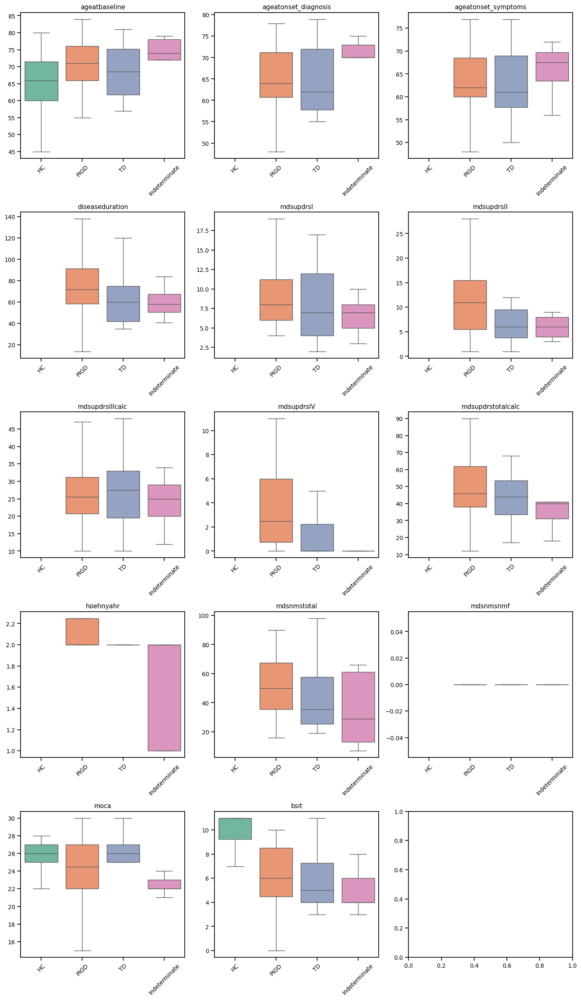

In [54]:

groups = ['HC', 'PIGD', 'TD', 'Indeterminate']

# display plots in the order HC, PIGD, TD and Indeterminate
cat_type = CategoricalDtype(categories=groups, ordered=True)
df_total['tdpigdphenotype'] = df_total['tdpigdphenotype'].astype(cat_type)

# printing number of participants in each group
print(df_total['tdpigdphenotype'].value_counts().reindex(groups))

sns.set_context("notebook", font_scale=0.9)
fig, axes = plt.subplots(5, 3, figsize=(14, 24))

# generating boxplots for all clinical features
for index, key in enumerate(df_clinical.select_dtypes('number')):
    i, j = divmod(index, 3)
    sns.boxplot(ax=axes[i, j], x='tdpigdphenotype', y=key, data=df_total,
                hue='tdpigdphenotype', palette='Set2', showfliers=False, legend=False)
    axes[i, j].set_title(key)
    axes[i, j].set(xlabel=None, ylabel=None)
    axes[i, j].tick_params(axis='x', rotation=45)
    axes[i, j].legend([], [], frameon=False)  

plt.tight_layout()
plt.show()


### Clinical data across HC, PIGD, TD, Indeterminate - Violin plots

tdpigdphenotype
HC               18
PIGD             32
TD               20
Indeterminate     5
Name: count, dtype: int64


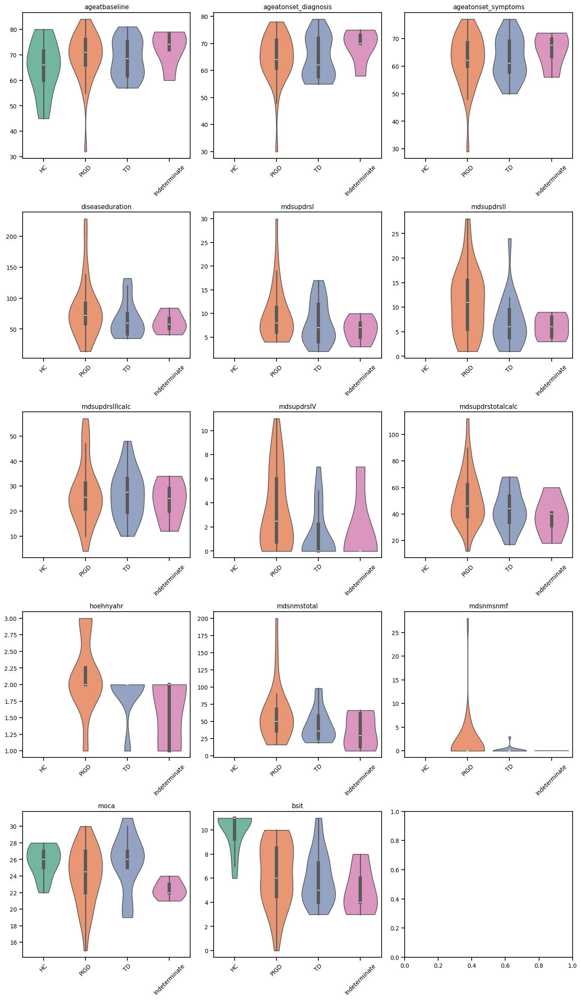

In [55]:
groups = ['HC', 'PIGD', 'TD', 'Indeterminate']

# display plots in the order HC, PIGD, TD and Indeterminate
cat_type = CategoricalDtype(categories=groups, ordered=True)
df_total['tdpigdphenotype'] = df_total['tdpigdphenotype'].astype(cat_type)

# printing number of participants in each group
print(df_total['tdpigdphenotype'].value_counts().reindex(groups))

sns.set_context("notebook", font_scale=0.9)
fig, axes = plt.subplots(5, 3, figsize=(14, 24))

# generating violinplots for all clinical features
for index, key in enumerate(df_clinical.select_dtypes('number')):
    i, j = divmod(index, 3)
    sns.violinplot(
        ax=axes[i, j],
        x='tdpigdphenotype',
        y=key,
        data=df_total,
        hue='tdpigdphenotype',       
        palette='Set2',
        cut=0,
        legend=False                 
    )
    axes[i, j].set_title(key)
    axes[i, j].set(xlabel=None, ylabel=None)
    axes[i, j].tick_params(axis='x', rotation=45)
    axes[i, j].legend([], [], frameon=False)  

plt.tight_layout()
plt.show()


## MRI data - SNpc

### MRI data across HC, PIGD, TD, Indeterminate - Boxplots (SNpc Left)

tdpigdphenotype
HC               18
PIGD             32
TD               20
Indeterminate     5
Name: count, dtype: int64


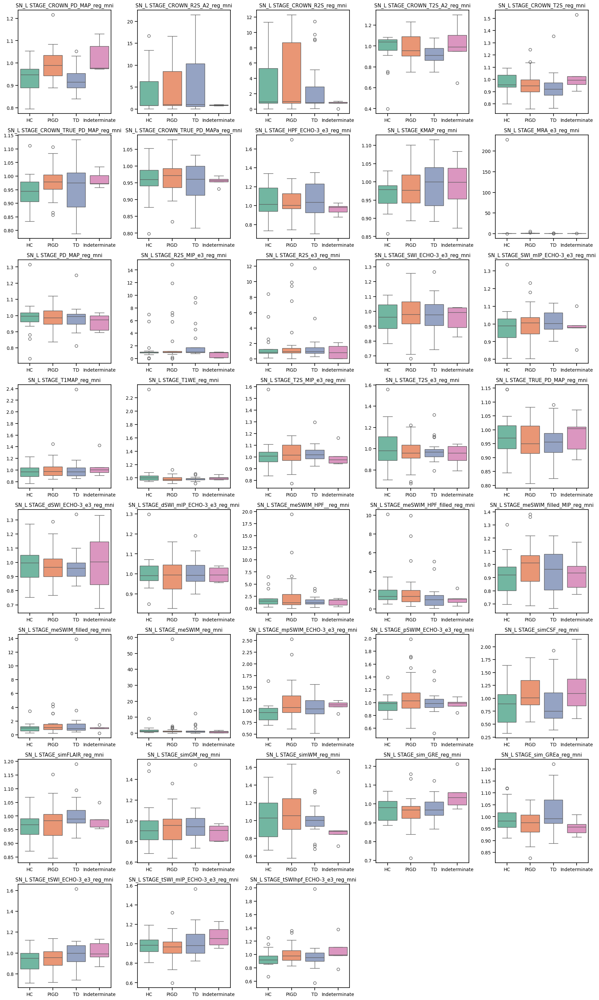

In [56]:
groups = ['HC', 'PIGD', 'TD', 'Indeterminate']

# display plots in the order HC, PIGD, TD and Indeterminate 
cat_type = CategoricalDtype(categories=groups, ordered=True)
df_total['tdpigdphenotype'] = df_total['tdpigdphenotype'].astype(cat_type)

# print number of participants in each group
print(df_total['tdpigdphenotype'].value_counts().reindex(groups))

sns.set_context("notebook", font_scale=0.9)
fig, axes = plt.subplots(8, 5, figsize=(18, 30))

# generating boxplots for all MRI features in left SNpc 
for index, key in enumerate(df_mri.keys()[:38]):
    i, j = divmod(index, 5)
    sns.boxplot(ax=axes[i, j], x='tdpigdphenotype', y=key,
                hue='tdpigdphenotype', data=df_total, palette='Set2')
    axes[i, j].set(ylabel=None, xlabel=None, title=key)
    axes[i, j].legend([], [], frameon=False)

for index in range(38, 40):
    i, j = divmod(index, 5)
    axes[i, j].axis('off')

plt.tight_layout()
plt.show()


### MRI data across HC, PIGD, TD, Indeterminate - Violin plots (SNpc Left)

tdpigdphenotype
HC               18
PIGD             32
TD               20
Indeterminate     5
Name: count, dtype: int64


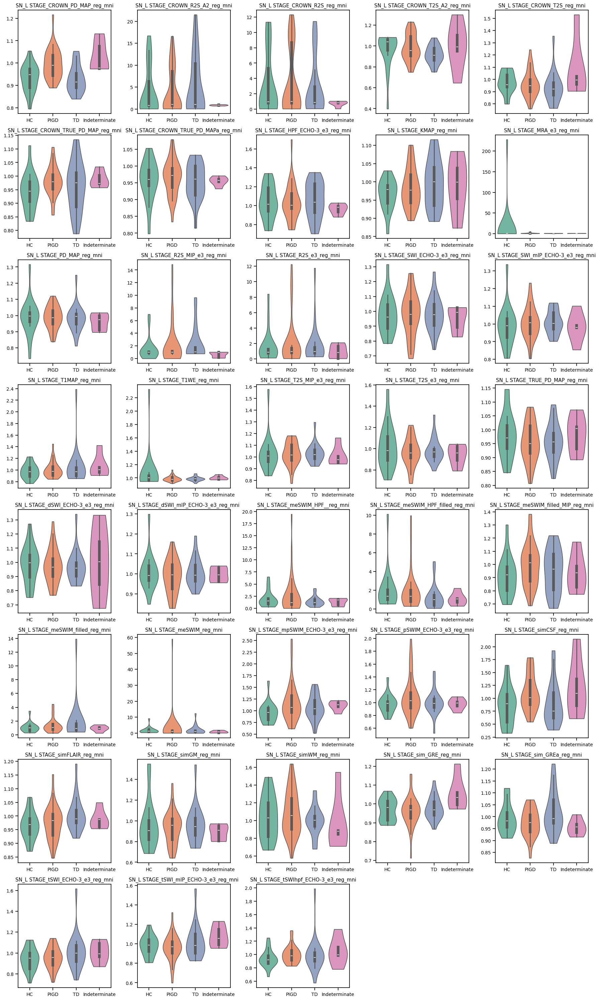

In [57]:
groups = ['HC', 'PIGD', 'TD', 'Indeterminate']

# display plots in the order HC, PIGD, TD and Indeterminate
cat_type = CategoricalDtype(categories=groups, ordered=True)
df_total['tdpigdphenotype'] = df_total['tdpigdphenotype'].astype(cat_type)

# printing number of participants in each group
print(df_total['tdpigdphenotype'].value_counts().reindex(groups))

sns.set_context("notebook", font_scale=0.9)
fig, axes = plt.subplots(8, 5, figsize=(18, 30))

# generating violin plots for all MRI features in left SNpc
for index, key in enumerate(df_mri.keys()[:38]):
    i, j = divmod(index, 5)
    sns.violinplot(ax=axes[i, j], x='tdpigdphenotype', y=key,
                   hue='tdpigdphenotype', data=df_total, palette='Set2', cut=0, dodge=False)
    axes[i, j].set(ylabel=None, xlabel=None, title=key)
    axes[i, j].legend([], [], frameon=False)

for index in range(38, 40):
    i, j = divmod(index, 5)
    axes[i, j].axis('off')

plt.tight_layout()
plt.show()

### MRI data across HC, PIGD, TD, Indeterminate - Boxplots (SNpc Right)

tdpigdphenotype
HC               18
PIGD             32
TD               20
Indeterminate     5
Name: count, dtype: int64


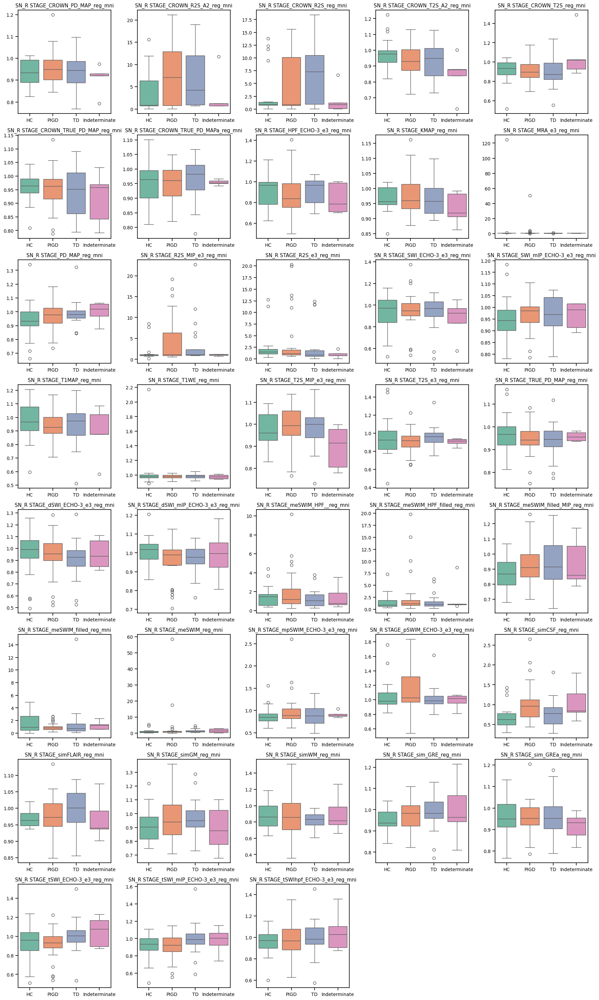

In [58]:
groups = ['HC', 'PIGD', 'TD', 'Indeterminate']

# display plots in the order HC, PIGD, TD and Indeterminate
cat_type = CategoricalDtype(categories=groups, ordered=True)
df_total['tdpigdphenotype'] = df_total['tdpigdphenotype'].astype(cat_type)

# printing number of participants in each group
print(df_total['tdpigdphenotype'].value_counts().reindex(groups))

sns.set_context("notebook", font_scale=0.9)
fig, axes = plt.subplots(8, 5, figsize=(18, 30))

# generating box plots for all MRI features in right SNpc 
for index, key in enumerate(df_mri.keys()[38:76]):
    i, j = divmod(index, 5)
    sns.boxplot(ax=axes[i, j], x='tdpigdphenotype', y=key,
                hue='tdpigdphenotype', data=df_total, palette='Set2')
    axes[i, j].set(ylabel=None, xlabel=None, title=key)
    axes[i, j].legend([], [], frameon=False)

for index in range(38, 40):
    i, j = divmod(index, 5)
    axes[i, j].axis('off')

plt.tight_layout()
plt.show()

### MRI data across HC, PIGD, TD, Indeterminate - Violin plots (SNpc Right)

tdpigdphenotype
HC               18
PIGD             32
TD               20
Indeterminate     5
Name: count, dtype: int64


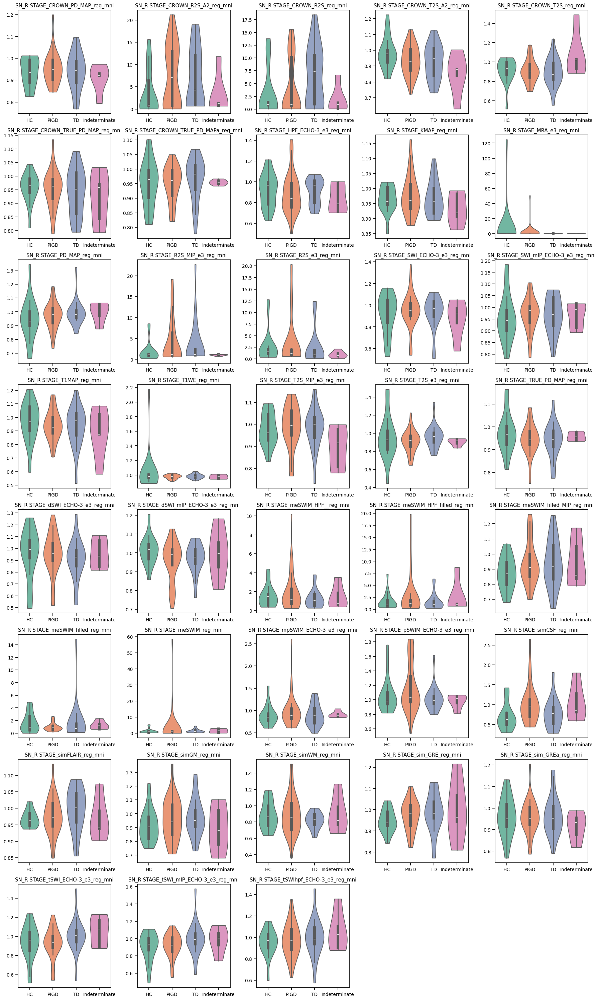

In [59]:
groups = ['HC', 'PIGD', 'TD', 'Indeterminate']

#  display plots in the order HC, PIGD, TD and Indeterminate
cat_type = CategoricalDtype(categories=groups, ordered=True)
df_total['tdpigdphenotype'] = df_total['tdpigdphenotype'].astype(cat_type)

# printing number of participants in each group
print(df_total['tdpigdphenotype'].value_counts().reindex(groups))

sns.set_context("notebook", font_scale=0.9)
fig, axes = plt.subplots(8, 5, figsize=(18, 30))

# generating violin plots for all MRI features in right SNpc
for index, key in enumerate(df_mri.keys()[38:76]):
    i, j = divmod(index, 5)
    sns.violinplot(ax=axes[i, j], x='tdpigdphenotype', y=key,
                   hue='tdpigdphenotype', data=df_total, palette='Set2', cut=0, dodge=False)
    axes[i, j].set(ylabel=None, xlabel=None, title=key)
    axes[i, j].legend([], [], frameon=False)

for index in range(38, 40):
    i, j = divmod(index, 5)
    axes[i, j].axis('off')

plt.tight_layout()
plt.show()

### MRI data across HC, PIGD, TD, Indeterminate - Boxplots (combined SNpc)

tdpigdphenotype
HC               18
PIGD             32
TD               20
Indeterminate     5
Name: count, dtype: int64


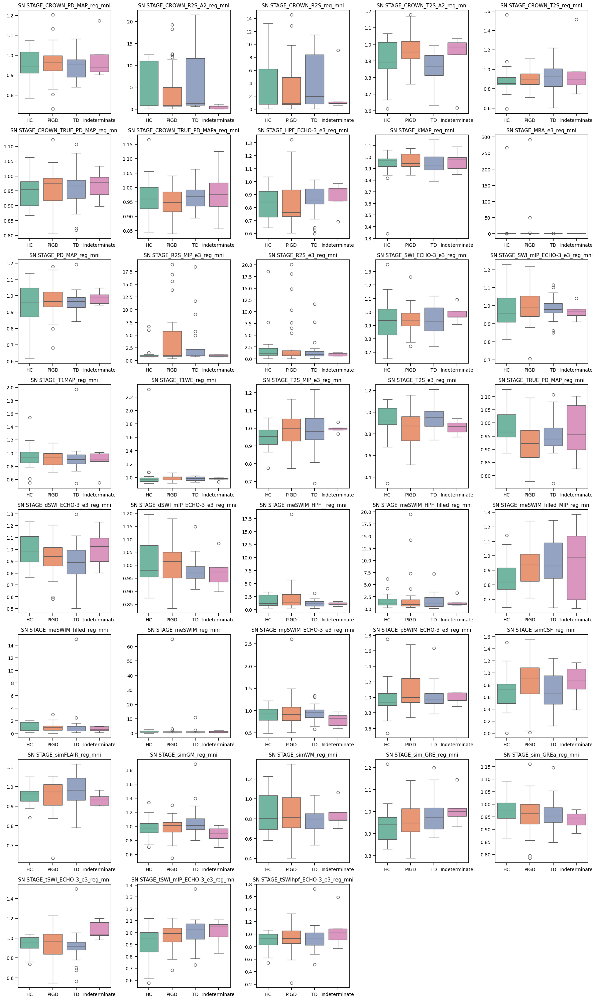

In [60]:
groups = ['HC', 'PIGD', 'TD', 'Indeterminate']

# display plots in the order HC, PIGD, TD and Indeterminate
cat_type = CategoricalDtype(categories=groups, ordered=True)
df_total['tdpigdphenotype'] = df_total['tdpigdphenotype'].astype(cat_type)

# printing number of participants in each group
print(df_total['tdpigdphenotype'].value_counts().reindex(groups))

sns.set_context("notebook", font_scale=0.9)
fig, axes = plt.subplots(8, 5, figsize=(18, 30))

# generating box plots for all MRI features in combined SNpc
for index, key in enumerate(df_mri.keys()[76:114]):
    i, j = divmod(index, 5)
    sns.boxplot(ax=axes[i, j], x='tdpigdphenotype', y=key,
                hue='tdpigdphenotype', data=df_total, palette='Set2')
    axes[i, j].set(ylabel=None, xlabel=None, title=key)
    axes[i, j].legend([], [], frameon=False)

for index in range(38, 40):
    i, j = divmod(index, 5)
    axes[i, j].axis('off')

plt.tight_layout()
plt.show()

### MRI data across HC, PIGD, TD, Indeterminate - Violin plots (Combined SNpc)

tdpigdphenotype
HC               18
PIGD             32
TD               20
Indeterminate     5
Name: count, dtype: int64


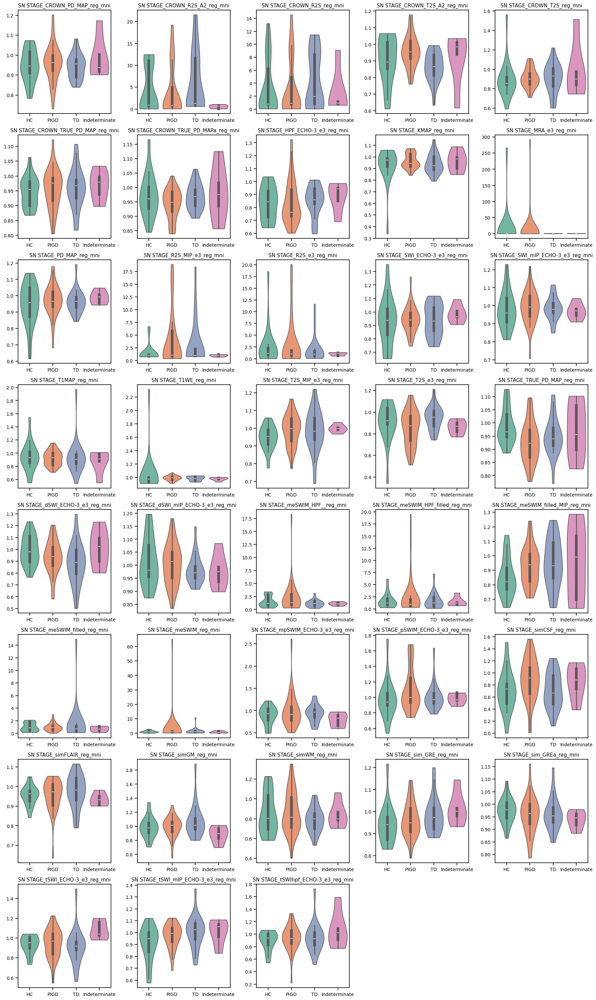

In [61]:
groups = ['HC', 'PIGD', 'TD', 'Indeterminate']

# display plots in the order HC, PIGD, TD and Indeterminate
cat_type = CategoricalDtype(categories=groups, ordered=True)
df_total['tdpigdphenotype'] = df_total['tdpigdphenotype'].astype(cat_type)

# printing number of participants in each group
print(df_total['tdpigdphenotype'].value_counts().reindex(groups))

sns.set_context("notebook", font_scale=0.9)
fig, axes = plt.subplots(8, 5, figsize=(18, 30))

# plotting violin plots for all MRI features in combined SNpc
for index, key in enumerate(df_mri.keys()[76:114]):
    i, j = divmod(index, 5)
    sns.violinplot(ax=axes[i, j], x='tdpigdphenotype', y=key,
                   hue='tdpigdphenotype', data=df_total, palette='Set2', cut=0, dodge=False)
    axes[i, j].set(ylabel=None, xlabel=None, title=key)
    axes[i, j].legend([], [], frameon=False)

for index in range(38, 40):
    i, j = divmod(index, 5)
    axes[i, j].axis('off')

plt.tight_layout()
plt.show()

## MRI data - LC

### MRI data across HC, PIGD, TD, Indeterminate - Boxplots (LC Left)

tdpigdphenotype
HC               18
PIGD             32
TD               20
Indeterminate     5
Name: count, dtype: int64


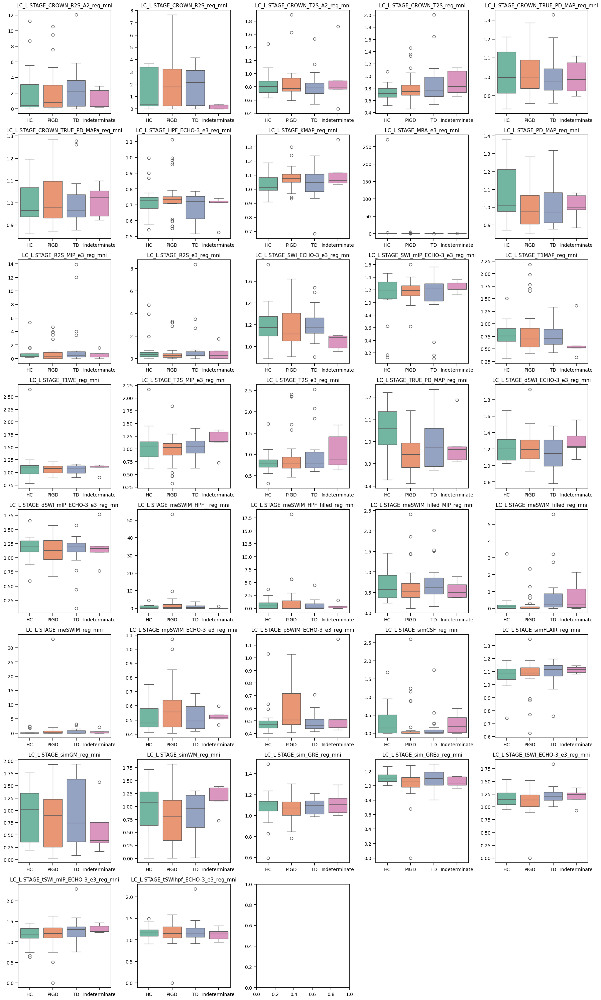

In [62]:
groups = ['HC', 'PIGD', 'TD', 'Indeterminate']

# display plots in the order HC, PIGD, TD and Indeterminate
cat_type = CategoricalDtype(categories=groups, ordered=True)
df_total['tdpigdphenotype'] = df_total['tdpigdphenotype'].astype(cat_type)

# printing number of participants in each group
print(df_total['tdpigdphenotype'].value_counts().reindex(groups))

sns.set_context("notebook", font_scale=0.9)
fig, axes = plt.subplots(8, 5, figsize=(18, 30))

# generating boxplots for all MRI features in left LC
for index, key in enumerate(df_mri.keys()[115:152]):
    i, j = divmod(index, 5)
    sns.boxplot(ax=axes[i, j], x='tdpigdphenotype', y=key,
                hue='tdpigdphenotype', data=df_total, palette='Set2')
    axes[i, j].set(ylabel=None, xlabel=None, title=key)
    axes[i, j].legend([], [], frameon=False)

for index in range(38, 40):
    i, j = divmod(index, 5)
    axes[i, j].axis('off')

plt.tight_layout()
plt.show()

### MRI data across HC, PIGD, TD, Indeterminate - Violin plots (LC Left)

tdpigdphenotype
HC               18
PIGD             32
TD               20
Indeterminate     5
Name: count, dtype: int64


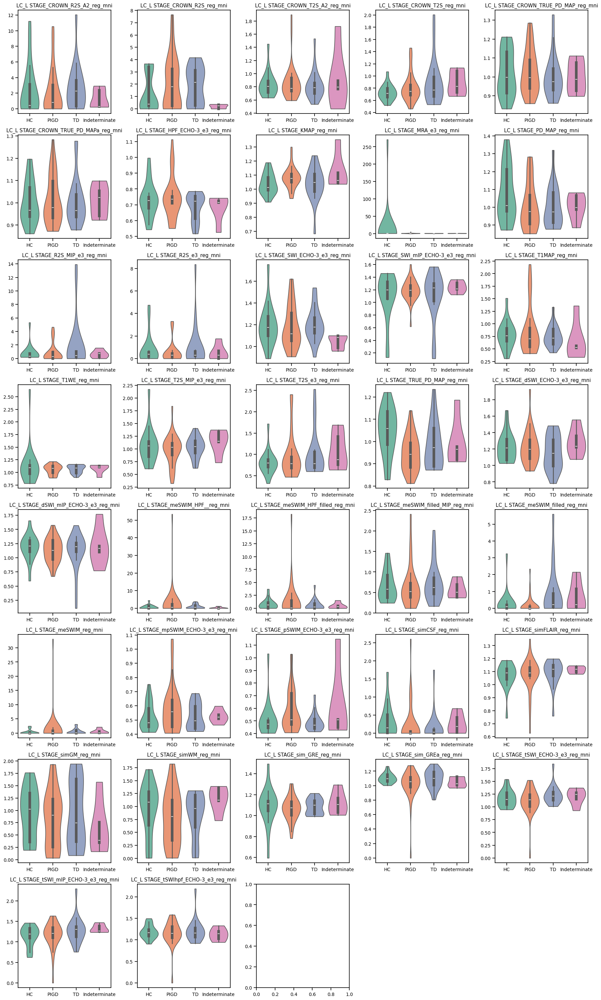

In [63]:
groups = ['HC', 'PIGD', 'TD', 'Indeterminate']

# display plots in the order HC, PIGD, TD and Indeterminate
cat_type = CategoricalDtype(categories=groups, ordered=True)
df_total['tdpigdphenotype'] = df_total['tdpigdphenotype'].astype(cat_type)

# printing number of participants in each group
print(df_total['tdpigdphenotype'].value_counts().reindex(groups))

sns.set_context("notebook", font_scale=0.9)
fig, axes = plt.subplots(8, 5, figsize=(18, 30))

# generating violin plots for all MRI features in left LC
for index, key in enumerate(df_mri.keys()[115:152]):
    i, j = divmod(index, 5)
    sns.violinplot(ax=axes[i, j], x='tdpigdphenotype', y=key,
                   hue='tdpigdphenotype', data=df_total, palette='Set2', cut=0, dodge=False)
    axes[i, j].set(ylabel=None, xlabel=None, title=key)
    axes[i, j].legend([], [], frameon=False)

for index in range(38, 40):
    i, j = divmod(index, 5)
    axes[i, j].axis('off')

plt.tight_layout()
plt.show()

### MRI data across HC, PIGD, TD, Indeterminate - Boxplots (LC Right)

tdpigdphenotype
HC               18
PIGD             32
TD               20
Indeterminate     5
Name: count, dtype: int64


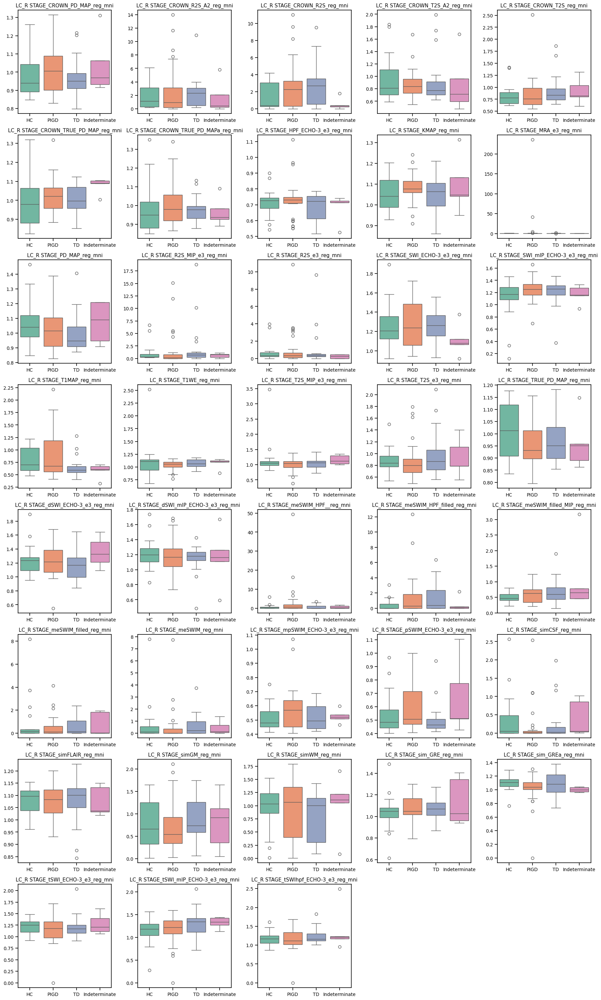

In [64]:
groups = ['HC', 'PIGD', 'TD', 'Indeterminate']

# display plots in the order HC, PIGD, TD and Indeterminate
cat_type = CategoricalDtype(categories=groups, ordered=True)
df_total['tdpigdphenotype'] = df_total['tdpigdphenotype'].astype(cat_type)

# printing number of participants in each group
print(df_total['tdpigdphenotype'].value_counts().reindex(groups))

sns.set_context("notebook", font_scale=0.9)
fig, axes = plt.subplots(8, 5, figsize=(18, 30))

# generating boxplots for all MRI features in right LC
for index, key in enumerate(df_mri.keys()[152:190]):
    i, j = divmod(index, 5)
    sns.boxplot(ax=axes[i, j], x='tdpigdphenotype', y=key,
                hue='tdpigdphenotype', data=df_total, palette='Set2')
    axes[i, j].set(ylabel=None, xlabel=None, title=key)
    axes[i, j].legend([], [], frameon=False)

for index in range(38, 40):
    i, j = divmod(index, 5)
    axes[i, j].axis('off')

plt.tight_layout()
plt.show()

### MRI data across HC, PIGD, TD, Indeterminate - Violin plots (LC Right)

tdpigdphenotype
HC               18
PIGD             32
TD               20
Indeterminate     5
Name: count, dtype: int64


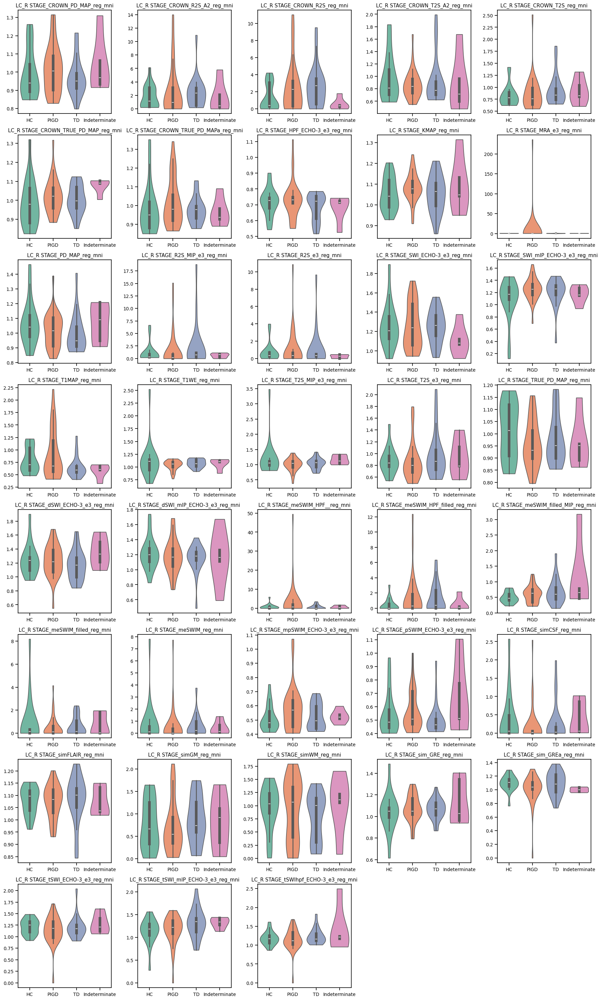

In [65]:
groups = ['HC', 'PIGD', 'TD', 'Indeterminate']

# display plots in the order HC, PIGD, TD and Indeterminate
cat_type = CategoricalDtype(categories=groups, ordered=True)
df_total['tdpigdphenotype'] = df_total['tdpigdphenotype'].astype(cat_type)

# printing number of participants in each group
print(df_total['tdpigdphenotype'].value_counts().reindex(groups))

sns.set_context("notebook", font_scale=0.9)
fig, axes = plt.subplots(8, 5, figsize=(18, 30))

# generating violin plots for all MRI features in right LC
for index, key in enumerate(df_mri.keys()[152:190]):
    i, j = divmod(index, 5)
    sns.violinplot(ax=axes[i, j], x='tdpigdphenotype', y=key,
                   hue='tdpigdphenotype', data=df_total, palette='Set2', cut=0, dodge=False)
    axes[i, j].set(ylabel=None, xlabel=None, title=key)
    axes[i, j].legend([], [], frameon=False)

for index in range(38, 40):
    i, j = divmod(index, 5)
    axes[i, j].axis('off')

plt.tight_layout()
plt.show()

### MRI data across HC, PIGD, TD, Indeterminate - Boxplots (Combined LC)

tdpigdphenotype
HC               18
PIGD             32
TD               20
Indeterminate     5
Name: count, dtype: int64


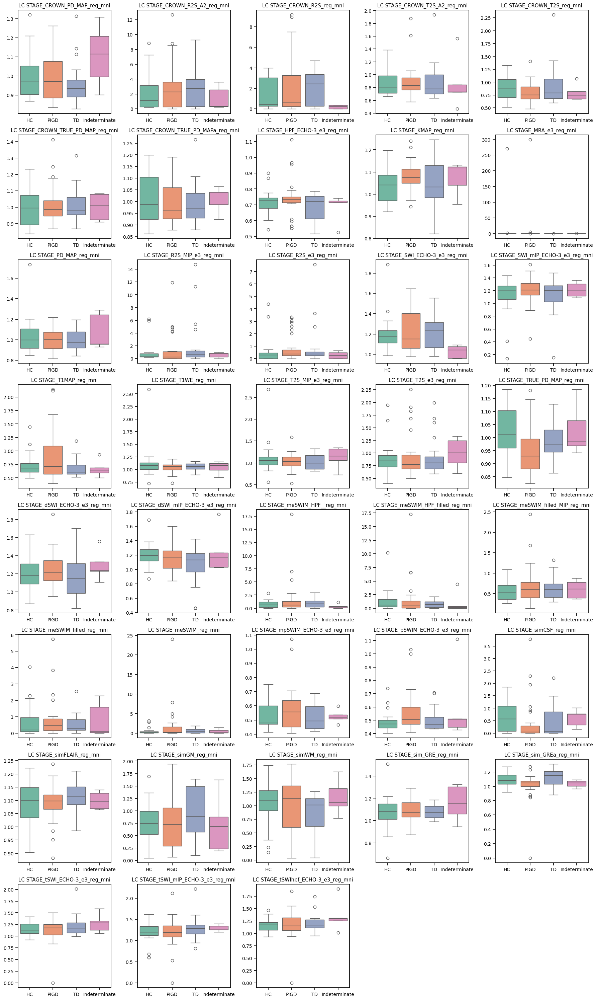

In [66]:
groups = ['HC', 'PIGD', 'TD', 'Indeterminate']

# display plots in the order HC, PIGD, TD and Indeterminate
cat_type = CategoricalDtype(categories=groups, ordered=True)
df_total['tdpigdphenotype'] = df_total['tdpigdphenotype'].astype(cat_type)

# printing number of participants in each group
print(df_total['tdpigdphenotype'].value_counts().reindex(groups))

sns.set_context("notebook", font_scale=0.9)
fig, axes = plt.subplots(8, 5, figsize=(18, 30))

# generating box plots for all MRI features in combined LC
for index, key in enumerate(df_mri.keys()[190:228]):
    i, j = divmod(index, 5)
    sns.boxplot(ax=axes[i, j], x='tdpigdphenotype', y=key,
                hue='tdpigdphenotype', data=df_total, palette='Set2')
    axes[i, j].set(ylabel=None, xlabel=None, title=key)
    axes[i, j].legend([], [], frameon=False)

for index in range(38, 40):
    i, j = divmod(index, 5)
    axes[i, j].axis('off')

plt.tight_layout()
plt.show()

### MRI data across HC, PIGD, TD, Indeterminate - Violin plots (Combined LC)

tdpigdphenotype
HC               18
PIGD             32
TD               20
Indeterminate     5
Name: count, dtype: int64


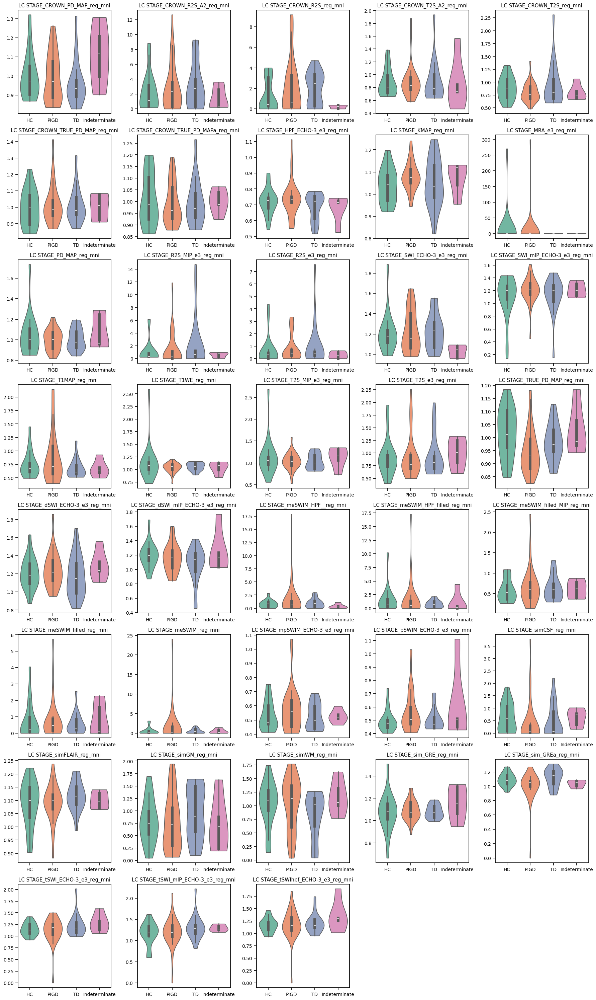

In [67]:
groups = ['HC', 'PIGD', 'TD', 'Indeterminate']

# display plots in the order HC, PIGD, TD and Indeterminate
cat_type = CategoricalDtype(categories=groups, ordered=True)
df_total['tdpigdphenotype'] = df_total['tdpigdphenotype'].astype(cat_type)

# printing number of participants in each group
print(df_total['tdpigdphenotype'].value_counts().reindex(groups))

sns.set_context("notebook", font_scale=0.9)
fig, axes = plt.subplots(8, 5, figsize=(18, 30))

# generating violin plots for all MRI features in combined LC
for index, key in enumerate(df_mri.keys()[190:228]):
    i, j = divmod(index, 5)
    sns.violinplot(ax=axes[i, j], x='tdpigdphenotype', y=key,
                   hue='tdpigdphenotype', data=df_total, palette='Set2', cut=0, dodge=False)
    axes[i, j].set(ylabel=None, xlabel=None, title=key)
    axes[i, j].legend([], [], frameon=False)

for index in range(38, 40):
    i, j = divmod(index, 5)
    axes[i, j].axis('off')

plt.tight_layout()
plt.show()

## MRI data - putamen

### MRI data across HC, PIGD, TD, Indeterminate - Boxplots (Putamen Left)

tdpigdphenotype
HC               18
PIGD             32
TD               20
Indeterminate     5
Name: count, dtype: int64


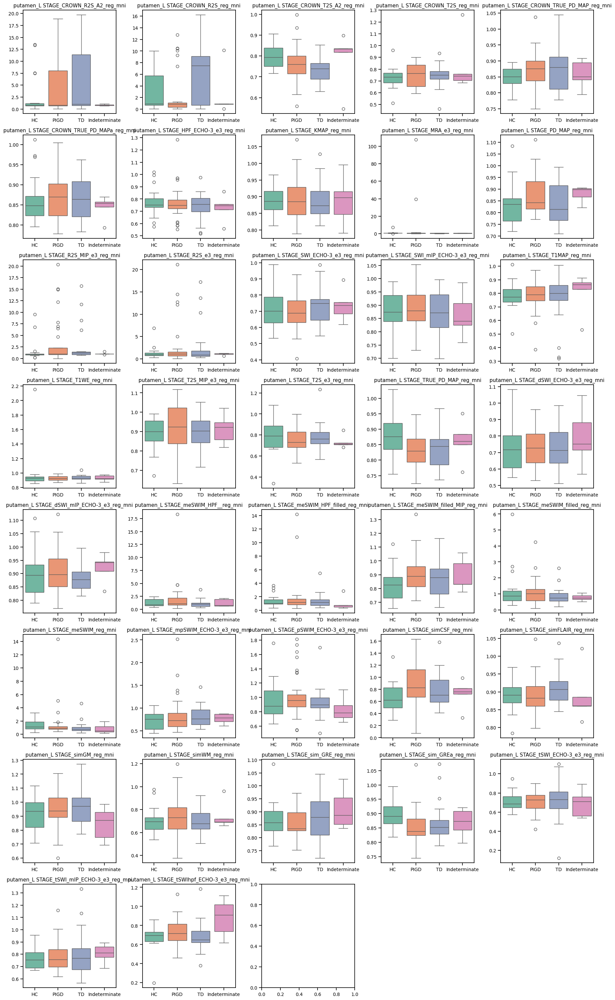

In [68]:
groups = ['HC', 'PIGD', 'TD', 'Indeterminate']

# display plots in the order HC, PIGD, TD and Indeterminate
cat_type = CategoricalDtype(categories=groups, ordered=True)
df_total['tdpigdphenotype'] = df_total['tdpigdphenotype'].astype(cat_type)

# printing number of participants in each group
print(df_total['tdpigdphenotype'].value_counts().reindex(groups))

sns.set_context("notebook", font_scale=0.9)
fig, axes = plt.subplots(8, 5, figsize=(18, 30))

# generating box plots for all MRI features in left putamen
for index, key in enumerate(df_mri.keys()[229:266]):
    i, j = divmod(index, 5)
    sns.boxplot(ax=axes[i, j], x='tdpigdphenotype', y=key,
                hue='tdpigdphenotype', data=df_total, palette='Set2')
    axes[i, j].set(ylabel=None, xlabel=None, title=key)
    axes[i, j].legend([], [], frameon=False)

for index in range(38, 40):
    i, j = divmod(index, 5)
    axes[i, j].axis('off')

plt.tight_layout()
plt.show()

### MRI data across HC, PIGD, TD, Indeterminate - Violin plots (Putamen Left)

tdpigdphenotype
HC               18
PIGD             32
TD               20
Indeterminate     5
Name: count, dtype: int64


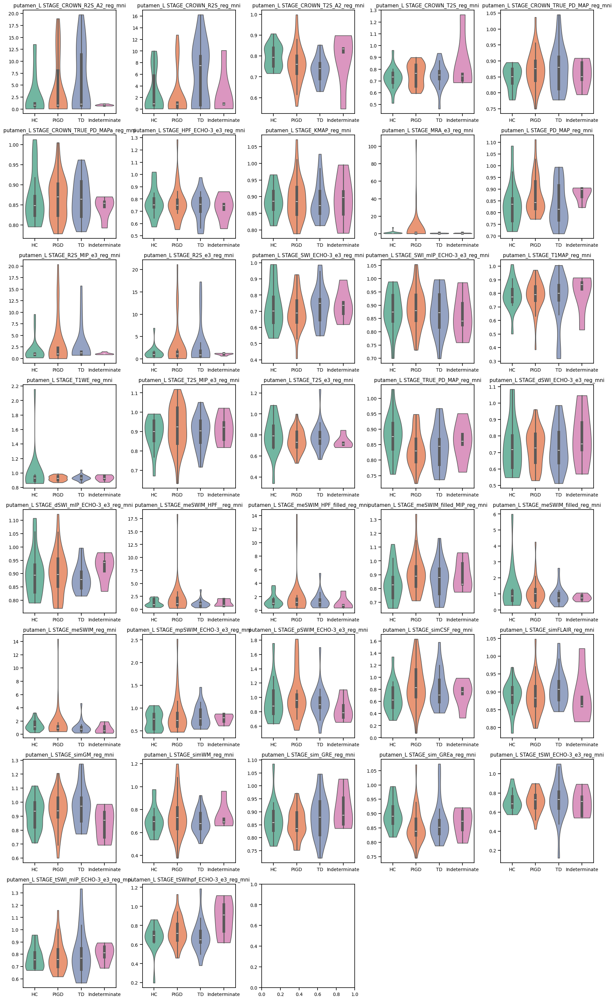

In [69]:
groups = ['HC', 'PIGD', 'TD', 'Indeterminate']

# display plots in the order HC, PIGD, TD and Indeterminate
cat_type = CategoricalDtype(categories=groups, ordered=True)
df_total['tdpigdphenotype'] = df_total['tdpigdphenotype'].astype(cat_type)

print(df_total['tdpigdphenotype'].value_counts().reindex(groups))
sns.set_context("notebook", font_scale=0.9)

# generating violin plots for all MRI features in left putamen 
fig, axes = plt.subplots(8, 5, figsize=(18, 30))
for index, key in enumerate(df_mri.keys()[229:266]):
    i, j = divmod(index, 5)
    sns.violinplot(ax=axes[i, j], x='tdpigdphenotype', y=key,
                   hue='tdpigdphenotype', data=df_total, palette='Set2', cut=0, dodge=False)
    axes[i, j].set(ylabel=None, xlabel=None, title=key)
    axes[i, j].legend([], [], frameon=False)

for index in range(38, 40):
    i, j = divmod(index, 5)
    axes[i, j].axis('off')

plt.tight_layout()
plt.show()

### MRI data across HC, PIGD, TD, Indeterminate - Boxplots (Putamen Right)

tdpigdphenotype
HC               18
PIGD             32
TD               20
Indeterminate     5
Name: count, dtype: int64


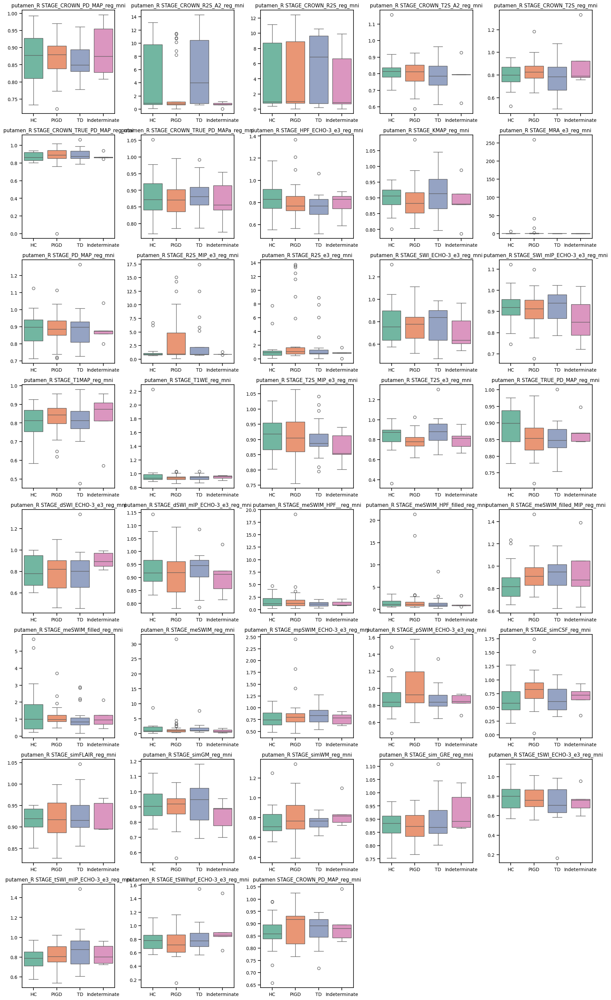

In [70]:
groups = ['HC', 'PIGD', 'TD', 'Indeterminate']

# display plots in the order HC, PIGD, TD and Indeterminate
cat_type = CategoricalDtype(categories=groups, ordered=True)
df_total['tdpigdphenotype'] = df_total['tdpigdphenotype'].astype(cat_type)

# printing number of participants in each group
print(df_total['tdpigdphenotype'].value_counts().reindex(groups))

sns.set_context("notebook", font_scale=0.9)
fig, axes = plt.subplots(8, 5, figsize=(18, 30))

# generating box plots for all MRI features in right putamen
for index, key in enumerate(df_mri.keys()[266:304]):
    i, j = divmod(index, 5)
    sns.boxplot(ax=axes[i, j], x='tdpigdphenotype', y=key,
                hue='tdpigdphenotype', data=df_total, palette='Set2')
    axes[i, j].set(ylabel=None, xlabel=None, title=key)
    axes[i, j].legend([], [], frameon=False)

for index in range(38, 40):
    i, j = divmod(index, 5)
    axes[i, j].axis('off')

plt.tight_layout()
plt.show()


### MRI data across HC, PIGD, TD, Indeterminate - Violin plots (Putamen Right)

tdpigdphenotype
HC               18
PIGD             32
TD               20
Indeterminate     5
Name: count, dtype: int64


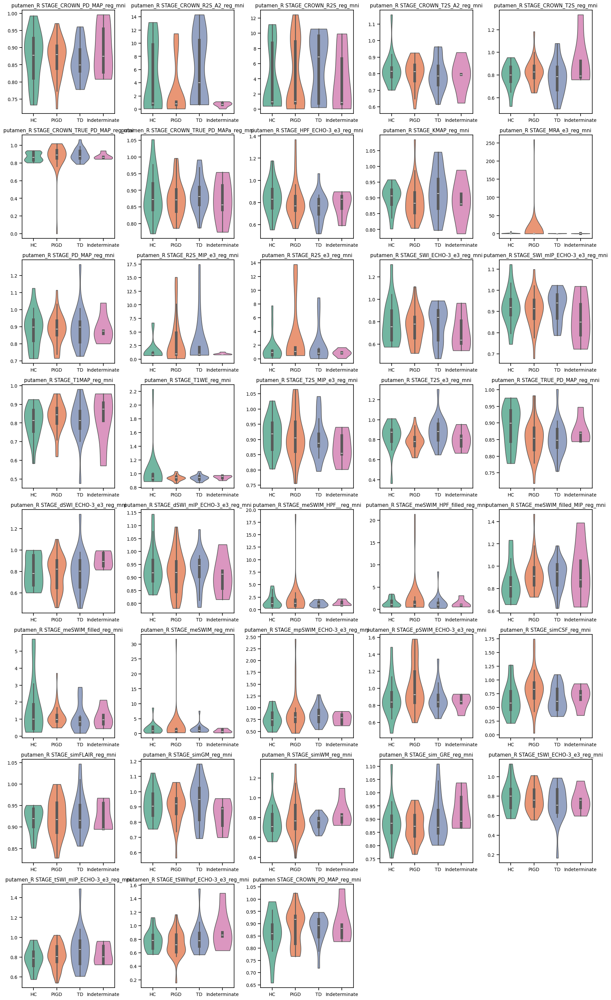

In [71]:
groups = ['HC', 'PIGD', 'TD', 'Indeterminate']

# display plots in the order HC, PIGD, TD and Indeterminate
cat_type = CategoricalDtype(categories=groups, ordered=True)
df_total['tdpigdphenotype'] = df_total['tdpigdphenotype'].astype(cat_type)

# printing number of participants in each group
print(df_total['tdpigdphenotype'].value_counts().reindex(groups))

sns.set_context("notebook", font_scale=0.9)
fig, axes = plt.subplots(8, 5, figsize=(18, 30))

# generating violin plots for all MRI features in right putamen
for index, key in enumerate(df_mri.keys()[266:304]):
    i, j = divmod(index, 5)
    sns.violinplot(ax=axes[i, j], x='tdpigdphenotype', y=key,
                   hue='tdpigdphenotype', data=df_total, palette='Set2', cut=0, dodge=False)
    axes[i, j].set(ylabel=None, xlabel=None, title=key)
    axes[i, j].legend([], [], frameon=False)

for index in range(38, 40):
    i, j = divmod(index, 5)
    axes[i, j].axis('off')

plt.tight_layout()
plt.show()

### MRI data across HC, PIGD, TD, Indeterminate - Boxplots (Combined Putamen)

tdpigdphenotype
HC               18
PIGD             32
TD               20
Indeterminate     5
Name: count, dtype: int64


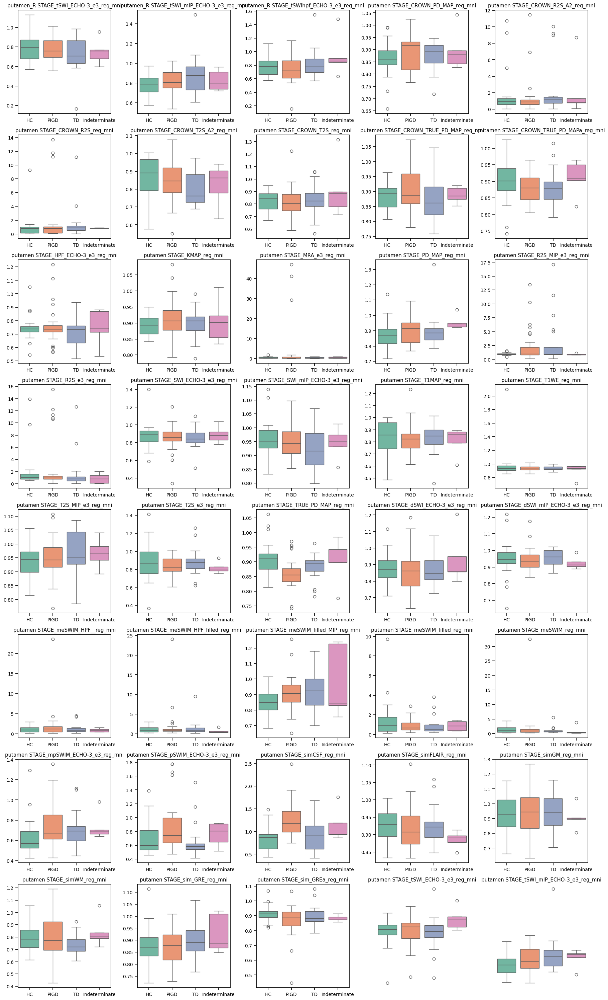

In [72]:
groups = ['HC', 'PIGD', 'TD', 'Indeterminate']

# display plots in the order HC, PIGD, TD and Indeterminate
cat_type = CategoricalDtype(categories=groups, ordered=True)
df_total['tdpigdphenotype'] = df_total['tdpigdphenotype'].astype(cat_type)

# printing number of participants in each group
print(df_total['tdpigdphenotype'].value_counts().reindex(groups))

sns.set_context("notebook", font_scale=0.9)
fig, axes = plt.subplots(8, 5, figsize=(18, 30))

# generating box plots for all MRI features in combined putamen
for index, key in enumerate(df_mri.keys()[300:340]):
    i, j = divmod(index, 5)
    sns.boxplot(ax=axes[i, j], x='tdpigdphenotype', y=key,
                hue='tdpigdphenotype', data=df_total, palette='Set2')
    axes[i, j].set(ylabel=None, xlabel=None, title=key)
    axes[i, j].legend([], [], frameon=False)

for index in range(38, 40):
    i, j = divmod(index, 5)
    axes[i, j].axis('off')

plt.tight_layout()
plt.show()

### MRI data across HC, PIGD, TD, Indeterminate - Violin plots (Combined Putamen)

tdpigdphenotype
HC               18
PIGD             32
TD               20
Indeterminate     5
Name: count, dtype: int64


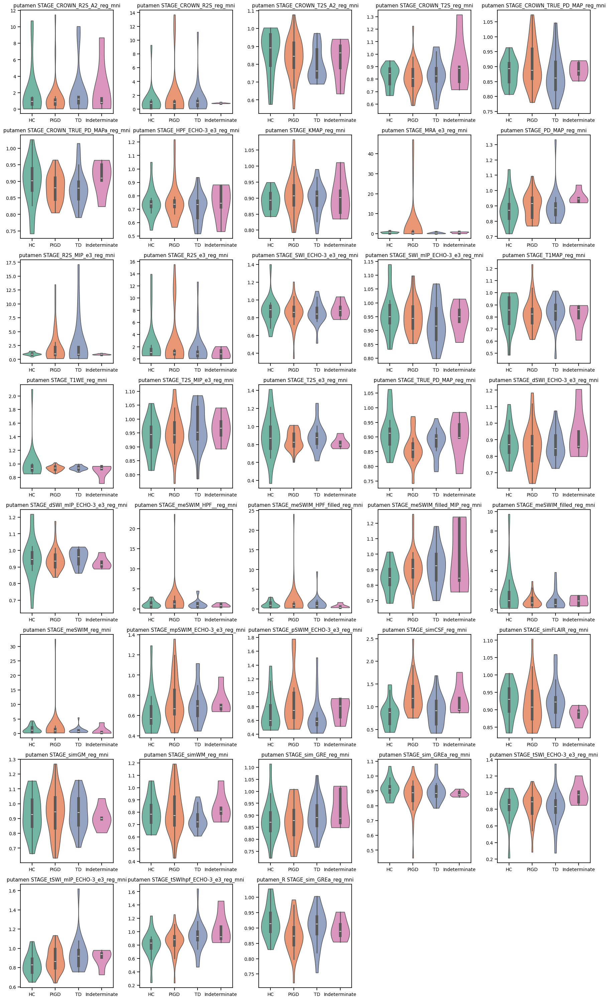

In [73]:
groups = ['HC', 'PIGD', 'TD', 'Indeterminate']

# display plots in the order HC, PIGD, TD and Indeterminate
cat_type = CategoricalDtype(categories=groups, ordered=True)
df_total['tdpigdphenotype'] = df_total['tdpigdphenotype'].astype(cat_type)

# printing number of participants in each group
print(df_total['tdpigdphenotype'].value_counts().reindex(groups))

sns.set_context("notebook", font_scale=0.9)
fig, axes = plt.subplots(8, 5, figsize=(18, 30))

# generating violin plots for all MRI features in combined putamen
for index, key in enumerate(df_mri.keys()[304:342]):
    i, j = divmod(index, 5)
    sns.violinplot(ax=axes[i, j], x='tdpigdphenotype', y=key,
                   hue='tdpigdphenotype', data=df_total, palette='Set2', cut=0, dodge=False)
    axes[i, j].set(ylabel=None, xlabel=None, title=key)
    axes[i, j].legend([], [], frameon=False)

for index in range(38, 40):
    i, j = divmod(index, 5)
    axes[i, j].axis('off')

plt.tight_layout()
plt.show()

<h1 style="text-align: center;"> STATISTICAL FEATURE EXTRACTION </h1>

In [74]:
# Converting categorical data status (control, patient), gender (female, male) and tdpigdphenotype (td, pigd, indeterminate) 
# to numerical data
le = LabelEncoder()
df_total['status'] = le.fit_transform(df_total['status'])
df_total['gender'] = le.fit_transform(df_total['gender'])
df_total['tdpigdphenotype'] = le.fit_transform(df_total['tdpigdphenotype'])
df_total

,status,gender,ageatbaseline,ageatonset_diagnosis,ageatonset_symptoms,diseaseduration,mdsupdrsI,mdsupdrsII,mdsupdrsIIIcalc,mdsupdrsIV,...,putamen STAGE_simCSF_reg_mni,putamen STAGE_simFLAIR_reg_mni,putamen STAGE_simGM_reg_mni,putamen STAGE_simWM_reg_mni,putamen STAGE_sim_GRE_reg_mni,putamen STAGE_sim_GREa_reg_mni,putamen STAGE_tSWI_ECHO-3_e3_reg_mni,putamen STAGE_tSWI_mIP_ECHO-3_e3_reg_mni,putamen STAGE_tSWIhpf_ECHO-3_e3_reg_mni,putamen_R STAGE_sim_GREa_reg_mni
personal_id,,,,,,,,,,,,,,,,,,,,,
01-0002,0,0,67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.010047,0.942482,0.844180,0.960801,0.722684,0.828294,0.884909,0.826558,0.845798,0.991020
01-0003,1,0,62,58.0,57.0,50.0,12.0,4.0,13.0,7.0,...,0.492292,0.848162,0.948088,0.684853,0.969854,0.928656,0.961619,0.780712,0.990648,0.897542
01-0004,0,1,63,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.501965,0.969373,1.031371,0.781392,0.896080,0.930706,0.855357,0.784464,0.869397,0.934566
01-0005,1,0,68,64.0,61.0,84.0,4.0,9.0,28.0,1.0,...,1.435666,0.957152,0.951908,0.878481,0.750157,0.833066,0.988646,1.134120,1.111051,0.859936
01-0006,1,0,61,57.0,58.0,36.0,6.0,3.0,29.0,0.0,...,0.925772,0.866898,1.061764,0.834344,0.979004,0.932131,0.915817,1.618753,0.906765,0.876747
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
01-0083,1,1,66,63.0,61.0,60.0,9.0,8.0,26.0,1.0,...,0.963209,0.911466,0.951932,0.654031,0.879566,0.860178,0.543840,0.870432,0.907901,0.842127
01-0084,1,1,78,75.0,NaN,NaN,7.0,4.0,20.0,0.0,...,0.929123,0.913019,0.905174,1.056682,0.849333,0.890932,1.009394,0.934695,0.840064,0.854523
01-0085,1,1,72,61.0,60.0,138.0,8.0,7.0,32.0,11.0,...,0.988520,0.844036,0.878299,0.765393,0.912336,0.936387,0.744019,0.779739,0.607976,0.872645


In [75]:
df_hc = df_total[df_total["status"] == 0]
df_hc.head()

,status,gender,ageatbaseline,ageatonset_diagnosis,ageatonset_symptoms,diseaseduration,mdsupdrsI,mdsupdrsII,mdsupdrsIIIcalc,mdsupdrsIV,...,putamen STAGE_simCSF_reg_mni,putamen STAGE_simFLAIR_reg_mni,putamen STAGE_simGM_reg_mni,putamen STAGE_simWM_reg_mni,putamen STAGE_sim_GRE_reg_mni,putamen STAGE_sim_GREa_reg_mni,putamen STAGE_tSWI_ECHO-3_e3_reg_mni,putamen STAGE_tSWI_mIP_ECHO-3_e3_reg_mni,putamen STAGE_tSWIhpf_ECHO-3_e3_reg_mni,putamen_R STAGE_sim_GREa_reg_mni
personal_id,,,,,,,,,,,,,,,,,,,,,
01-0002,0,0,67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.010047,0.942482,0.844180,0.960801,0.722684,0.828294,0.884909,0.826558,0.845798,0.991020
01-0004,0,1,63,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.501965,0.969373,1.031371,0.781392,0.896080,0.930706,0.855357,0.784464,0.869397,0.934566
01-0011,0,1,77,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.486083,1.004533,1.154226,0.616187,0.966356,0.902164,0.630499,0.924225,0.694231,0.852278
01-0016,0,0,68,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.889765,0.892140,1.081998,0.820046,0.833138,0.909015,0.818077,0.774876,0.825843,0.891026
01-0019,0,0,70,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.700190,0.942030,0.828220,0.858054,0.841475,0.924683,0.869089,0.757054,0.832064,0.893374


In [76]:
df_pd = df_total[df_total["status"] == 1]
df_pd.head()

,status,gender,ageatbaseline,ageatonset_diagnosis,ageatonset_symptoms,diseaseduration,mdsupdrsI,mdsupdrsII,mdsupdrsIIIcalc,mdsupdrsIV,...,putamen STAGE_simCSF_reg_mni,putamen STAGE_simFLAIR_reg_mni,putamen STAGE_simGM_reg_mni,putamen STAGE_simWM_reg_mni,putamen STAGE_sim_GRE_reg_mni,putamen STAGE_sim_GREa_reg_mni,putamen STAGE_tSWI_ECHO-3_e3_reg_mni,putamen STAGE_tSWI_mIP_ECHO-3_e3_reg_mni,putamen STAGE_tSWIhpf_ECHO-3_e3_reg_mni,putamen_R STAGE_sim_GREa_reg_mni
personal_id,,,,,,,,,,,,,,,,,,,,,
01-0003,1,0,62,58.0,57.0,50.0,12.0,4.0,13.0,7.0,...,0.492292,0.848162,0.948088,0.684853,0.969854,0.928656,0.961619,0.780712,0.990648,0.897542
01-0005,1,0,68,64.0,61.0,84.0,4.0,9.0,28.0,1.0,...,1.435666,0.957152,0.951908,0.878481,0.750157,0.833066,0.988646,1.134120,1.111051,0.859936
01-0006,1,0,61,57.0,58.0,36.0,6.0,3.0,29.0,0.0,...,0.925772,0.866898,1.061764,0.834344,0.979004,0.932131,0.915817,1.618753,0.906765,0.876747
01-0007,1,1,79,60.0,60.0,228.0,8.0,24.0,57.0,1.0,...,1.444419,0.921640,0.996618,0.612830,0.918706,0.911333,1.136984,1.029999,0.855641,0.797932
01-0008,1,1,69,64.0,63.0,72.0,12.0,17.0,31.0,9.0,...,1.172500,0.932740,0.916314,0.932428,0.838430,0.807553,0.748734,1.080266,0.808161,0.974762


In [77]:
df_pigd = df_total[df_total["tdpigdphenotype"] == 2]
df_pigd.head()

,status,gender,ageatbaseline,ageatonset_diagnosis,ageatonset_symptoms,diseaseduration,mdsupdrsI,mdsupdrsII,mdsupdrsIIIcalc,mdsupdrsIV,...,putamen STAGE_simCSF_reg_mni,putamen STAGE_simFLAIR_reg_mni,putamen STAGE_simGM_reg_mni,putamen STAGE_simWM_reg_mni,putamen STAGE_sim_GRE_reg_mni,putamen STAGE_sim_GREa_reg_mni,putamen STAGE_tSWI_ECHO-3_e3_reg_mni,putamen STAGE_tSWI_mIP_ECHO-3_e3_reg_mni,putamen STAGE_tSWIhpf_ECHO-3_e3_reg_mni,putamen_R STAGE_sim_GREa_reg_mni
personal_id,,,,,,,,,,,,,,,,,,,,,
01-0005,1,0,68,64.0,61.0,84.0,4.0,9.0,28.0,1.0,...,1.435666,0.957152,0.951908,0.878481,0.750157,0.833066,0.988646,1.134120,1.111051,0.859936
01-0007,1,1,79,60.0,60.0,228.0,8.0,24.0,57.0,1.0,...,1.444419,0.921640,0.996618,0.612830,0.918706,0.911333,1.136984,1.029999,0.855641,0.797932
01-0008,1,1,69,64.0,63.0,72.0,12.0,17.0,31.0,9.0,...,1.172500,0.932740,0.916314,0.932428,0.838430,0.807553,0.748734,1.080266,0.808161,0.974762
01-0010,1,0,71,69.0,66.0,54.0,7.0,8.0,35.0,6.0,...,1.454833,0.995305,1.208658,1.065053,0.883439,0.926972,0.893733,0.855425,0.845114,0.968171
01-0012,1,0,84,78.0,77.0,84.0,11.0,14.0,50.0,9.0,...,0.897631,0.965085,0.723465,0.705008,0.819453,0.447244,0.929061,0.910408,0.880309,0.866953


In [78]:
df_td = df_total[df_total["tdpigdphenotype"] == 3]
df_td.head()

,status,gender,ageatbaseline,ageatonset_diagnosis,ageatonset_symptoms,diseaseduration,mdsupdrsI,mdsupdrsII,mdsupdrsIIIcalc,mdsupdrsIV,...,putamen STAGE_simCSF_reg_mni,putamen STAGE_simFLAIR_reg_mni,putamen STAGE_simGM_reg_mni,putamen STAGE_simWM_reg_mni,putamen STAGE_sim_GRE_reg_mni,putamen STAGE_sim_GREa_reg_mni,putamen STAGE_tSWI_ECHO-3_e3_reg_mni,putamen STAGE_tSWI_mIP_ECHO-3_e3_reg_mni,putamen STAGE_tSWIhpf_ECHO-3_e3_reg_mni,putamen_R STAGE_sim_GREa_reg_mni
personal_id,,,,,,,,,,,,,,,,,,,,,
01-0003,1,0,62,58.0,57.0,50.0,12.0,4.0,13.0,7.0,...,0.492292,0.848162,0.948088,0.684853,0.969854,0.928656,0.961619,0.780712,0.990648,0.897542
01-0006,1,0,61,57.0,58.0,36.0,6.0,3.0,29.0,0.0,...,0.925772,0.866898,1.061764,0.834344,0.979004,0.932131,0.915817,1.618753,0.906765,0.876747
01-0009,1,1,81,79.0,77.0,42.0,15.0,12.0,35.0,5.0,...,1.258753,0.929929,0.901689,0.606961,0.935346,0.911772,0.900460,0.756087,0.742075,1.003530
01-0013,1,1,75,72.0,69.0,66.0,4.0,11.0,42.0,5.0,...,1.024237,0.855341,0.706321,0.754629,0.811652,0.867648,0.787401,0.880142,0.906994,0.955101
01-0018,1,0,79,70.0,68.0,132.0,10.0,6.0,48.0,4.0,...,0.791377,0.949249,1.033315,0.754686,0.940940,0.922898,1.346794,0.819773,1.051071,0.929642


In [79]:
df_indeterminate = df_total[df_total["tdpigdphenotype"] == 1]
df_indeterminate.head()

,status,gender,ageatbaseline,ageatonset_diagnosis,ageatonset_symptoms,diseaseduration,mdsupdrsI,mdsupdrsII,mdsupdrsIIIcalc,mdsupdrsIV,...,putamen STAGE_simCSF_reg_mni,putamen STAGE_simFLAIR_reg_mni,putamen STAGE_simGM_reg_mni,putamen STAGE_simWM_reg_mni,putamen STAGE_sim_GRE_reg_mni,putamen STAGE_sim_GREa_reg_mni,putamen STAGE_tSWI_ECHO-3_e3_reg_mni,putamen STAGE_tSWI_mIP_ECHO-3_e3_reg_mni,putamen STAGE_tSWIhpf_ECHO-3_e3_reg_mni,putamen_R STAGE_sim_GREa_reg_mni
personal_id,,,,,,,,,,,,,,,,,,,,,
01-0014,1,1,79,73.0,72.0,84.0,3.0,3.0,12.0,0.0,...,1.760293,0.896635,1.035894,0.807493,1.008746,0.858952,1.204610,0.981018,1.461924,0.875227
01-0045,1,0,74,70.0,69.0,54.0,8.0,8.0,25.0,0.0,...,0.942311,0.847980,0.804632,0.789246,0.888315,0.913313,0.848966,0.903423,1.078027,0.912235
01-0076,1,0,72,70.0,66.0,62.0,5.0,6.0,29.0,0.0,...,0.868318,0.877977,0.900838,0.835176,0.868296,0.874863,0.886702,0.947428,0.926738,0.888774
01-0084,1,1,78,75.0,NaN,NaN,7.0,4.0,20.0,0.0,...,0.929123,0.913019,0.905174,1.056682,0.849333,0.890932,1.009394,0.934695,0.840064,0.854523
01-0090,1,1,60,58.0,56.0,41.0,10.0,9.0,34.0,7.0,...,1.190733,0.892935,0.894264,0.721141,1.021803,0.874594,0.973190,0.726473,0.894401,0.952379


## PD/HC - INDEPENDENT TTEST / MANN-WHITNEY U TEST

Code used to generate results shown in Table 4.1 - significant features PD vs HC
- Calculating median, Q1 and Q3 values for PD and HC participants shown in Table 4.1

In [80]:
df_hc_mri = df_hc.iloc[:, 17:]
df_pd_mri = df_pd.iloc[:, 17:]

# calculate median, Q1, and Q3 for HC (controls)
medians_hc = df_hc_mri.median()
q1_hc = df_hc_mri.quantile(0.25)
q3_hc = df_hc_mri.quantile(0.75)

# calculate median, Q1, and Q3 for PD (patients)
medians_pd = df_pd_mri.median()
q1_pd = df_pd_mri.quantile(0.25)
q3_pd = df_pd_mri.quantile(0.75)

summary_stats = pd.DataFrame({
    'Median PD': medians_pd,
    'Q1 PD': q1_pd,
    'Q3 PD': q3_pd,
    'Median HC': medians_hc,
    'Q1 HC': q1_hc,
    'Q3 HC': q3_hc
})

print(summary_stats)
summary_stats.to_csv('summary_stats_pdhc.csv', index=True)
print("summary stats saved to 'summary_stats_pdhc.csv'.")

                                          Median PD     Q1 PD     Q3 PD  \
SN_L STAGE_CROWN_PD_MAP_reg_mni            0.969756  0.928107  1.025002   
SN_L STAGE_CROWN_R2S_A2_reg_mni            0.988866  0.780214  8.514663   
SN_L STAGE_CROWN_R2S_reg_mni               0.949830  0.772474  2.929773   
SN_L STAGE_CROWN_T2S_A2_reg_mni            0.949157  0.879277  1.023137   
SN_L STAGE_CROWN_T2S_reg_mni               0.941839  0.897789  0.991626   
...                                             ...       ...       ...   
putamen STAGE_sim_GREa_reg_mni             0.885357  0.851067  0.925599   
putamen STAGE_tSWI_ECHO-3_e3_reg_mni       0.876489  0.763015  0.932873   
putamen STAGE_tSWI_mIP_ECHO-3_e3_reg_mni   0.903423  0.801129  0.984074   
putamen STAGE_tSWIhpf_ECHO-3_e3_reg_mni    0.904476  0.823005  0.963119   
putamen_R STAGE_sim_GREa_reg_mni           0.886780  0.850795  0.918700   

                                          Median HC     Q1 HC     Q3 HC  
SN_L STAGE_CROWN_PD_MAP_r

Significant features and corresponding p-values shown in Table 4.1

In [81]:
results = []

# normality tests: Kolmogorov-Smirnov on patients, Shapiro on healthy controls
for feature in df_mri.columns:
    T_pd, p_pd = kstest(df_pd[feature], cdf="norm")
    T_hc, p_hc = shapiro(df_hc[feature])

    # checking for normality
    if (p_pd < 0.05) or (p_hc < 0.05):
        print(f"Non-normal distribution in {feature}")
        # if the feature is not normally distributed in one of the groups, Mann-Whitney U is applied
        t_stat, p_value = mannwhitneyu(df_pd[feature], df_hc[feature])
    else:
        # if the feature is normally distributed in both groups, independent ttest is applied
        print(f"Normal distribution in {feature}")
        t_stat, p_value = ttest_ind(df_pd[feature], df_hc[feature], equal_var=False)

    # significance level thresholds
    if p_value < 0.001:
        level = 'Highly Significant (p < 0.001)'
    elif p_value < 0.05:
        level = 'Significant (p < 0.05)'
    else:
        level = 'Nonsignificant (p ≥ 0.05)'

    results.append({'Feature': feature, 'p-value': p_value, 'Significance Level': level})

df_results = pd.DataFrame(results)

# grouping results by significance 
df_plot = df_results['Significance Level'].value_counts().reindex([
    'Highly Significant (p < 0.001)',
    'Significant (p < 0.05)',
    'Nonsignificant (p ≥ 0.05)'
]).reset_index()

df_plot.columns = ['Significance Level', 'Number of Features']

# plotting bar plot
fig = px.bar(df_plot, x='Significance Level', y='Number of Features',
             title='Distribution of Features for PD vs HC',
             color='Significance Level',
             color_discrete_map={
                 'Highly Significant (p < 0.001)': 'red',
                 'Significant (p < 0.05)': 'orange',
                 'Nonsignificant (p ≥ 0.05)': 'green'
             })

# annotations printing features according to significance
annotations = []
y_offset = -40

for level in df_plot['Significance Level']:
    y_value = df_plot[df_plot['Significance Level'] == level]['Number of Features'].values[0]
    features = df_results[df_results['Significance Level'] == level]['Feature'].tolist()

    if features:
        annotations.append(dict(
            x=level,
            y=y_value,
            text='<br>'.join(features),
            showarrow=True,
            arrowhead=2,
            ax=0,
            ay=y_offset,
            font=dict(size=5),
            xanchor='center',
            yanchor='bottom',
        ))
        y_offset -= 30

fig.update_layout(
    annotations=annotations,
    xaxis_title='Significance Level',
    yaxis_title='Number of Features',
    xaxis_tickangle=-45,
    margin=dict(t=30)
)

fig.show()

# printing features grouped by significance 
for level in ['Highly Significant (p < 0.001)', 'Significant (p < 0.05)', 'Nonsignificant (p ≥ 0.05)']:
    features = df_results[df_results['Significance Level'] == level][['Feature', 'p-value']]
    print(f"\n{level} ({len(features)} features):")
    print(features.to_string(index=False))


Non-normal distribution in SN_L STAGE_CROWN_PD_MAP_reg_mni
Non-normal distribution in SN_L STAGE_CROWN_R2S_A2_reg_mni
Non-normal distribution in SN_L STAGE_CROWN_R2S_reg_mni
Non-normal distribution in SN_L STAGE_CROWN_T2S_A2_reg_mni
Non-normal distribution in SN_L STAGE_CROWN_T2S_reg_mni
Non-normal distribution in SN_L STAGE_CROWN_TRUE_PD_MAP_reg_mni
Non-normal distribution in SN_L STAGE_CROWN_TRUE_PD_MAPa_reg_mni
Non-normal distribution in SN_L STAGE_HPF_ECHO-3_e3_reg_mni
Non-normal distribution in SN_L STAGE_KMAP_reg_mni
Non-normal distribution in SN_L STAGE_MRA_e3_reg_mni
Non-normal distribution in SN_L STAGE_PD_MAP_reg_mni
Non-normal distribution in SN_L STAGE_R2S_MIP_e3_reg_mni
Non-normal distribution in SN_L STAGE_R2S_e3_reg_mni
Non-normal distribution in SN_L STAGE_SWI_ECHO-3_e3_reg_mni
Non-normal distribution in SN_L STAGE_SWI_mIP_ECHO-3_e3_reg_mni
Non-normal distribution in SN_L STAGE_T1MAP_reg_mni
Non-normal distribution in SN_L STAGE_T1WE_reg_mni
Non-normal distribution in S


Highly Significant (p < 0.001) (0 features):
Empty DataFrame
Columns: [Feature, p-value]
Index: []

Significant (p < 0.05) (23 features):
                                  Feature  p-value
     SN_L STAGE_CROWN_TRUE_PD_MAP_reg_mni 0.046474
      SN_L STAGE_mpSWIM_ECHO-3_e3_reg_mni 0.019366
                SN_R STAGE_simCSF_reg_mni 0.022091
              SN STAGE_T2S_MIP_e3_reg_mni 0.047854
             SN STAGE_TRUE_PD_MAP_reg_mni 0.014783
       SN STAGE_meSWIM_filled_MIP_reg_mni 0.031371
      SN STAGE_tSWI_mIP_ECHO-3_e3_reg_mni 0.040064
           LC_L STAGE_TRUE_PD_MAP_reg_mni 0.005561
                LC_L STAGE_simCSF_reg_mni 0.035531
             LC STAGE_TRUE_PD_MAP_reg_mni 0.035491
                  LC STAGE_simCSF_reg_mni 0.047506
     putamen_L STAGE_CROWN_T2S_A2_reg_mni 0.026804
      putamen_L STAGE_TRUE_PD_MAP_reg_mni 0.027668
           putamen_L STAGE_simCSF_reg_mni 0.038876
         putamen_L STAGE_sim_GREa_reg_mni 0.008385
      putamen_R STAGE_TRUE_PD_MAP_reg_mni 0.0

In [82]:

summary_stats = pd.read_csv('summary_stats_pdhc.csv', index_col=0)

significant_modalities = [
    'LC_L STAGE_TRUE_PD_MAP_reg_mni', 
    'putamen_L STAGE_sim_GREa_reg_mni', 
    'putamen STAGE_simCSF_reg_mni',
    'SN_L STAGE_CROWN_TRUE_PD_MAP_reg_mni',
    'SN_L STAGE_mpSWIM_ECHO-3_e3_reg_mni',
    'SN_R STAGE_simCSF_reg_mni',
    'SN STAGE_T2S_MIP_e3_reg_mni',
    'SN STAGE_TRUE_PD_MAP_reg_mni',
    'SN STAGE_meSWIM_filled_MIP_reg_mni',
    'SN STAGE_tSWI_mIP_ECHO-3_e3_reg_mni',
    'LC_L STAGE_simCSF_reg_mni',
    'LC STAGE_TRUE_PD_MAP_reg_mni',
    'LC STAGE_simCSF_reg_mni',
    'putamen_L STAGE_CROWN_T2S_A2_reg_mni',
    'putamen_L STAGE_TRUE_PD_MAP_reg_mni',
    'putamen_L STAGE_simCSF_reg_mni',
    'putamen_R STAGE_TRUE_PD_MAP_reg_mni',
    'putamen_R STAGE_meSWIM_filled_MIP_reg_mni',
    'putamen STAGE_TRUE_PD_MAP_reg_mni',
    'putamen STAGE_meSWIM_filled_MIP_reg_mni',
    'putamen STAGE_mpSWIM_ECHO-3_e3_reg_mni',
    'putamen STAGE_tSWI_mIP_ECHO-3_e3_reg_mni',
    'putamen STAGE_tSWIhpf_ECHO-3_e3_reg_mni'
]


significant_data = summary_stats[summary_stats.index.isin(significant_modalities)]
significant_data.to_csv('significant_modalities_summary_stats_pdhc.csv')
print(significant_data)


                                           Median PD     Q1 PD     Q3 PD  \
SN_L STAGE_CROWN_TRUE_PD_MAP_reg_mni        0.975244  0.945950  1.007376   
SN_L STAGE_mpSWIM_ECHO-3_e3_reg_mni         1.071779  0.941079  1.282855   
SN_R STAGE_simCSF_reg_mni                   0.856814  0.626358  1.099550   
SN STAGE_T2S_MIP_e3_reg_mni                 0.997663  0.936403  1.050102   
SN STAGE_TRUE_PD_MAP_reg_mni                0.936000  0.888631  0.980655   
SN STAGE_meSWIM_filled_MIP_reg_mni          0.934040  0.825883  1.021838   
SN STAGE_tSWI_mIP_ECHO-3_e3_reg_mni         1.005806  0.927481  1.061335   
LC_L STAGE_TRUE_PD_MAP_reg_mni              0.958761  0.886837  1.012238   
LC_L STAGE_simCSF_reg_mni                   0.005246  0.000000  0.073254   
LC STAGE_TRUE_PD_MAP_reg_mni                0.948498  0.900938  1.016200   
LC STAGE_simCSF_reg_mni                     0.068167  0.013437  0.770197   
putamen_L STAGE_CROWN_T2S_A2_reg_mni        0.751309  0.695412  0.804131   
putamen_L ST

## PIGD vs TD - INDEPENDENT TTEST / MANN-WHITNEY U TEST

Code used to generate results shown in Table 4.2 - significant features PIGD vs TD
- Calculating median, Q1 and Q3 values for PIGD and TD participants, shown in Table 4.2

In [83]:
df_pigd_mri = df_pigd.iloc[:, 17:]
df_td_mri = df_td.iloc[:, 17:]

# calculate median, Q1, and Q3 for PIGD patients
medians_pigd = df_pigd_mri.median()
q1_pigd = df_pigd_mri.quantile(0.25)
q3_pigd = df_pigd_mri.quantile(0.75)

# calculate median, Q1, and Q3 for TD patients
medians_td = df_td_mri.median()
q1_td = df_td_mri.quantile(0.25)
q3_td = df_td_mri.quantile(0.75)

summary_stats_pigdtd = pd.DataFrame({
    'Median PIGD': medians_pigd,
    'Q1 PIGD': q1_pigd,
    'Q3 PIGD': q3_pigd,
    'Median TD': medians_td,
    'Q1 TD': q1_td,
    'Q3 TD': q3_td
})


print(summary_stats_pigdtd)
summary_stats_pigdtd.to_csv('summary_stats_pigdtd.csv', index=True)
print(" summary stats for PIGD and TD have been saved to 'summary_stats_pigdtd.csv'.")

                                          Median PIGD   Q1 PIGD   Q3 PIGD  \
SN_L STAGE_CROWN_PD_MAP_reg_mni              0.989221  0.943609  1.034284   
SN_L STAGE_CROWN_R2S_A2_reg_mni              1.008348  0.809298  8.593770   
SN_L STAGE_CROWN_R2S_reg_mni                 1.015006  0.772696  8.685288   
SN_L STAGE_CROWN_T2S_A2_reg_mni              0.957878  0.906798  1.092980   
SN_L STAGE_CROWN_T2S_reg_mni                 0.949311  0.900470  0.997422   
...                                               ...       ...       ...   
putamen STAGE_sim_GREa_reg_mni               0.887105  0.833028  0.925942   
putamen STAGE_tSWI_ECHO-3_e3_reg_mni         0.889247  0.747555  0.934340   
putamen STAGE_tSWI_mIP_ECHO-3_e3_reg_mni     0.862929  0.792873  0.990336   
putamen STAGE_tSWIhpf_ECHO-3_e3_reg_mni      0.881464  0.797708  0.930441   
putamen_R STAGE_sim_GREa_reg_mni             0.874070  0.844581  0.902201   

                                          Median TD     Q1 TD      Q3 TD  


Significant features and corresponding p-values given in Table 4.2

In [84]:
results = []

# normality tests: Shapiro test for both PIGD and TD groups
for feature in df_mri.columns:
    _, p_pigd = shapiro(df_pigd[feature])
    _, p_td = shapiro(df_td[feature])

    # checking normality
    if (p_pigd < 0.05) or (p_td < 0.05):
        print(f"Non-normal distribution in {feature}")
        # if the feature is not normally distributed in one of the groups, Mann-Whitney U test is applied
        t_stat, p_value = mannwhitneyu(df_pigd[feature], df_td[feature])
    else:
        # if the feature is normally distributed in both groups, independent ttest is applied
        print(f"Normal distribution in {feature}")
        t_stat, p_value = ttest_ind(df_pigd[feature], df_td[feature], equal_var=False)

    # significance level thresholds
    if p_value < 0.001:
        level = 'Highly Significant (p < 0.001)'
    elif p_value < 0.05:
        level = 'Significant (p < 0.05)'
    else:
        level = 'Nonsignificant (p ≥ 0.05)'

    results.append({'Feature': feature, 'p-value': p_value, 'Significance Level': level})

df_results = pd.DataFrame(results)

# grouping results by significance level
df_plot = df_results['Significance Level'].value_counts().reindex([
    'Highly Significant (p < 0.001)',
    'Significant (p < 0.05)',
    'Nonsignificant (p ≥ 0.05)'
]).reset_index()

df_plot.columns = ['Significance Level', 'Number of Features']
feature_names = df_results.groupby('Significance Level')['Feature'].apply(list).to_dict()

# annotations printing features according to significance
annotations = []
y_offset = -40

for level in df_plot['Significance Level']:
    y_val = df_plot[df_plot['Significance Level'] == level]['Number of Features'].values[0]
    features = feature_names.get(level, [])

    if features:
        annotations.append(
            dict(
                x=level,
                y=y_val,
                text='<br>'.join(features),
                showarrow=True,
                arrowhead=2,
                ax=0,
                ay=y_offset,
                font=dict(size=5),
                xanchor='center',
                yanchor='bottom'
            )
        )
        y_offset -= 30

# plotting bar plot
fig = px.bar(df_plot, x='Significance Level', y='Number of Features',
             title='Distribution of Features for PIGD vs TD',
             color='Significance Level',
             color_discrete_map={
                 'Highly Significant (p < 0.001)': 'red',
                 'Significant (p < 0.05)': 'orange',
                 'Nonsignificant (p ≥ 0.05)': 'green'
             })

fig.update_layout(
    annotations=annotations,
    xaxis_title='Significance Level',
    yaxis_title='Number of Features',
    xaxis_tickangle=-45,
    margin=dict(t=30)
)

fig.show()

# print features grouped by significance
for level in ['Highly Significant (p < 0.001)', 'Significant (p < 0.05)', 'Nonsignificant (p ≥ 0.05)']:
    features = df_results[df_results['Significance Level'] == level][['Feature', 'p-value']]
    print(f"\n{level} ({len(features)} features):")
    print(features.to_string(index=False))


Non-normal distribution in SN_L STAGE_CROWN_PD_MAP_reg_mni
Non-normal distribution in SN_L STAGE_CROWN_R2S_A2_reg_mni
Non-normal distribution in SN_L STAGE_CROWN_R2S_reg_mni
Normal distribution in SN_L STAGE_CROWN_T2S_A2_reg_mni
Non-normal distribution in SN_L STAGE_CROWN_T2S_reg_mni
Normal distribution in SN_L STAGE_CROWN_TRUE_PD_MAP_reg_mni
Normal distribution in SN_L STAGE_CROWN_TRUE_PD_MAPa_reg_mni
Non-normal distribution in SN_L STAGE_HPF_ECHO-3_e3_reg_mni
Normal distribution in SN_L STAGE_KMAP_reg_mni
Normal distribution in SN_L STAGE_MRA_e3_reg_mni
Non-normal distribution in SN_L STAGE_PD_MAP_reg_mni
Non-normal distribution in SN_L STAGE_R2S_MIP_e3_reg_mni
Non-normal distribution in SN_L STAGE_R2S_e3_reg_mni
Normal distribution in SN_L STAGE_SWI_ECHO-3_e3_reg_mni
Normal distribution in SN_L STAGE_SWI_mIP_ECHO-3_e3_reg_mni
Non-normal distribution in SN_L STAGE_T1MAP_reg_mni
Non-normal distribution in SN_L STAGE_T1WE_reg_mni
Non-normal distribution in SN_L STAGE_T2S_MIP_e3_reg_mni


Highly Significant (p < 0.001) (1 features):
                      Feature  p-value
SN STAGE_CROWN_T2S_A2_reg_mni 0.000842

Significant (p < 0.05) (17 features):
                                Feature  p-value
        SN_L STAGE_CROWN_PD_MAP_reg_mni 0.001257
        SN_L STAGE_CROWN_T2S_A2_reg_mni 0.023284
              SN_L STAGE_simCSF_reg_mni 0.025824
            SN_L STAGE_sim_GREa_reg_mni 0.044641
              SN_R STAGE_simCSF_reg_mni 0.049353
                SN STAGE_T2S_e3_reg_mni 0.014561
     LC_L STAGE_pSWIM_ECHO-3_e3_reg_mni 0.037674
          LC_R STAGE_R2S_MIP_e3_reg_mni 0.024680
     LC_R STAGE_pSWIM_ECHO-3_e3_reg_mni 0.035977
                 LC STAGE_simWM_reg_mni 0.047218
              LC STAGE_sim_GREa_reg_mni 0.010246
         putamen_R STAGE_T2S_e3_reg_mni 0.010625
putamen_R STAGE_pSWIM_ECHO-3_e3_reg_mni 0.041274
         putamen_R STAGE_simCSF_reg_mni 0.022087
      putamen STAGE_TRUE_PD_MAP_reg_mni 0.039440
  putamen STAGE_pSWIM_ECHO-3_e3_reg_mni 0.003053
    

In [85]:
summary_stats_pigd_td = pd.read_csv('summary_stats_pigdtd.csv', index_col=0)

significant_modalities = [
    'SN_L STAGE_CROWN_PD_MAP_reg_mni',
    'SN STAGE_CROWN_T2S_A2_reg_mni',
    'putamen_R STAGE_T2S_e3_reg_mni',
    'putamen STAGE_pSWIM_ECHO-3_e3_reg_mni',
    'putamen STAGE_simCSF_reg_mni',
    'SN_L STAGE_CROWN_T2S_A2_reg_mni',
    'SN_L STAGE_simCSF_reg_mni',
    'SN_L STAGE_sim_GREa_reg_mni',
    'SN_R STAGE_simCSF_reg_mni',
    'SN STAGE_T2S_e3_reg_mni',
    'LC_L STAGE_pSWIM_ECHO-3_e3_reg_mni',
    'LC_R STAGE_R2S_MIP_e3_reg_mni',
    'LC_R STAGE_pSWIM_ECHO-3_e3_reg_mni',
    'LC STAGE_simWM_reg_mni',
    'LC STAGE_sim_GREa_reg_mni',
    'putamen_R STAGE_pSWIM_ECHO-3_e3_reg_mni',
    'putamen_R STAGE_simCSF_reg_mni',
    'putamen STAGE_TRUE_PD_MAP_reg_mni'
]

significant_data_pigd_td = summary_stats_pigd_td[summary_stats_pigd_td.index.isin(significant_modalities)]
significant_data_pigd_td.to_csv('significant_modalities_summary_stats_pigdtd.csv')
print(significant_data_pigd_td)


                                         Median PIGD   Q1 PIGD   Q3 PIGD  \
SN_L STAGE_CROWN_PD_MAP_reg_mni             0.989221  0.943609  1.034284   
SN_L STAGE_CROWN_T2S_A2_reg_mni             0.957878  0.906798  1.092980   
SN_L STAGE_simCSF_reg_mni                   1.011822  0.874180  1.347392   
SN_L STAGE_sim_GREa_reg_mni                 0.975831  0.935661  1.007651   
SN_R STAGE_simCSF_reg_mni                   0.963038  0.694719  1.123852   
SN STAGE_CROWN_T2S_A2_reg_mni               0.955146  0.914863  1.019883   
SN STAGE_T2S_e3_reg_mni                     0.872337  0.735212  0.959539   
LC_L STAGE_pSWIM_ECHO-3_e3_reg_mni          0.507779  0.471174  0.717613   
LC_R STAGE_R2S_MIP_e3_reg_mni               0.216846  0.000000  0.810955   
LC_R STAGE_pSWIM_ECHO-3_e3_reg_mni          0.507779  0.471174  0.713904   
LC STAGE_simWM_reg_mni                      1.136361  0.604470  1.365439   
LC STAGE_sim_GREa_reg_mni                   1.050812  0.999252  1.073897   
putamen_R ST

##  HC, PIGD, TD and Indeterminate (one-way ANOVA / KRUSKAL-WALLIS TEST)

Code used to generate results shown in Table 4.4 - significant features HC, PIGD, TD and Indeterminate comparisons

In [86]:
results = []

for feature in df_total.columns:
    # get intensity values for each of the groups
    vals = {
        'HC': df_hc[feature],
        'Indeterminate': df_indeterminate[feature],
        'PIGD': df_pigd[feature],
        'TD': df_td[feature]
    }
    
    constant_in_group = [g for g, v in vals.items() if np.all(v == v.iloc[0])]
    
    # skips if feature has constant input 
    if constant_in_group:
        results.append({
            'Feature': feature,
            'p-value': np.nan,
            'Significance Level': f'Constant Input: {", ".join(constant_in_group)}'
        })
        continue


    # normality test (shapiro) for all the groups: HC, PIGD, TD, Indeterminate
    p_hc = shapiro(df_hc[feature])[1]
    p_indeterminate = shapiro(df_indeterminate[feature])[1]
    p_pigd = shapiro(df_pigd[feature])[1]
    p_td = shapiro(df_td[feature])[1]

    #checking for normality
    if p_hc < 0.05 or p_indeterminate < 0.05 or p_pigd < 0.05 or p_td < 0.05:
        
        # If the feature is not normally distributed in one of the groups, Kruskal-Wallis test is applied
        h_stat, p_value = stats.kruskal(df_hc[feature], df_indeterminate[feature], 
                                        df_pigd[feature], df_td[feature])
    else:
        # if the feature is normally distributed in all groups, one-way ANOVA is applied
        f_stat, p_value = stats.f_oneway(df_hc[feature], df_indeterminate[feature], 
                                         df_pigd[feature], df_td[feature])

    # significance level thresholds
    if p_value < 0.001:
        level = 'Highly Significant (p < 0.001)'
    elif p_value < 0.05:
        level = 'Significant (p < 0.05)'
    else:
        level = 'Nonsignificant (p ≥ 0.05)'

    results.append({'Feature': feature, 'p-value': p_value, 'Significance Level': level})

df_results = pd.DataFrame(results)

# group results by significance level
df_plot = df_results['Significance Level'].value_counts().reindex([
    'Highly Significant (p < 0.001)',
    'Significant (p < 0.05)',
    'Nonsignificant (p ≥ 0.05)'
]).reset_index()

df_plot.columns = ['Significance Level', 'Number of Features']

# annotations printing features according to significance
annotations = []
y_offset = -40  

for level in df_plot['Significance Level']:
    y_value = df_plot[df_plot['Significance Level'] == level]['Number of Features'].values[0]
    features = df_results[df_results['Significance Level'] == level]['Feature'].tolist()

    if features:
        annotations.append(dict(
            x=level,
            y=y_value,
            text='<br>'.join(features),
            showarrow=True,
            arrowhead=2,
            ax=0,
            ay=y_offset,
            font=dict(size=5),
            xanchor='center',
            yanchor='bottom',
        ))
        y_offset -= 30  

# plot bar plot
fig = px.bar(df_plot, x='Significance Level', y='Number of Features',
             title='Distribution of Features for HC vs PIGD vs TD vs Indeterminate',
             color='Significance Level',
             color_discrete_map={
                 'Highly Significant (p < 0.001)': 'red',
                 'Significant (p < 0.05)': 'orange',
                 'Nonsignificant (p ≥ 0.05)': 'green'
             })

fig.update_layout(
    annotations=annotations,
    xaxis_title='Significance Level',
    yaxis_title='Number of Features',
    xaxis_tickangle=-45,
    margin=dict(t=30)
)

fig.show()

# print grouped features by significance level
for level in ['Highly Significant (p < 0.001)', 'Significant (p < 0.05)', 'Nonsignificant (p ≥ 0.05)']:
    features = df_results[df_results['Significance Level'] == level][['Feature', 'p-value']]
    print(f"\n{level} ({len(features)} features):")
    print(features.to_string(index=False))


Highly Significant (p < 0.001) (2 features):
                        Feature  p-value
SN_L STAGE_CROWN_PD_MAP_reg_mni 0.000577
   putamen STAGE_simCSF_reg_mni 0.000312

Significant (p < 0.05) (15 features):
                                Feature  p-value
                                   moca 0.031105
              SN_R STAGE_simCSF_reg_mni 0.022949
          SN STAGE_CROWN_T2S_A2_reg_mni 0.021725
        SN STAGE_tSWI_ECHO-3_e3_reg_mni 0.039960
         LC_L STAGE_TRUE_PD_MAP_reg_mni 0.027921
              LC_L STAGE_simCSF_reg_mni 0.038149
            LC_R STAGE_sim_GREa_reg_mni 0.045564
           LC STAGE_TRUE_PD_MAP_reg_mni 0.019667
              LC STAGE_sim_GREa_reg_mni 0.023954
   putamen_L STAGE_CROWN_T2S_A2_reg_mni 0.023994
       putamen_L STAGE_sim_GREa_reg_mni 0.037658
         putamen_R STAGE_T2S_e3_reg_mni 0.032344
      putamen STAGE_TRUE_PD_MAP_reg_mni 0.008085
  putamen STAGE_pSWIM_ECHO-3_e3_reg_mni 0.020100
putamen STAGE_tSWIhpf_ECHO-3_e3_reg_mni 0.029194

Nonsign

<h2 style="text-align: center;"> ASSESSMENT OF LATERALITY </h2>

### PD

Code used to generate results shown in Table 4.3 - laterality assessment (patients)

In [87]:
results = []

regions = ["SN", "LC", "putamen"]
patient_columns = df_pd.iloc[:, 17:].columns

# pairing left and right for each region
for region in regions:
    left_columns = [col for col in patient_columns if col.startswith(region + "_L")]
    right_columns = [col.replace("_L", "_R") for col in left_columns if col.replace("_L", "_R") in patient_columns]

    for left_col, right_col in zip(left_columns, right_columns):
        left = df_pd[left_col]
        right = df_pd[right_col]

        # normality is tested using Kolmogorov-Smirnov test 
        _, p_left = kstest(left, cdf='norm')
        _, p_right = kstest(right, cdf='norm')

        # paired t-test if both sides are normally distributed, Wilcoxon if either one of the sides are non-normal
        if p_left > 0.05 and p_right > 0.05:
            stat, p_value = ttest_rel(left, right)
        else:
            stat, p_value = wilcoxon(left, right)

        feature_name = left_col.replace(region + "_L", region)

        # significance level thresholds
        if p_value < 0.001:
            level = 'Highly Significant (p < 0.001)'
        elif p_value < 0.05:
            level = 'Significant (p < 0.05)'
        else:
            level = 'Nonsignificant (p ≥ 0.05)'

        results.append({'Feature': feature_name, 'p-value': p_value, 'Significance Level': level})

df_results = pd.DataFrame(results)

# grouping results by significance
df_plot = df_results['Significance Level'].value_counts().reindex([
    'Highly Significant (p < 0.001)',
    'Significant (p < 0.05)',
    'Nonsignificant (p ≥ 0.05)'
]).reset_index()

df_plot.columns = ['Significance Level', 'Number of Features']

annotations = []
y_offset = -40

# annotations printing features according to significance
for level in ['Highly Significant (p < 0.001)', 'Significant (p < 0.05)']:
    features = df_results[df_results['Significance Level'] == level]['Feature'].tolist()
    count = df_plot[df_plot['Significance Level'] == level]['Number of Features'].values[0]

    if features:
        annotations.append(dict(
            x=level,
            y=count,
            text='<br>'.join(features),
            showarrow=True,
            arrowhead=2,
            ax=0,
            ay=y_offset,
            font=dict(size=5.5),
            xanchor='center',
            yanchor='bottom',
        ))

        if level == 'Highly Significant (p < 0.001)':
            y_offset -= max(10, len(features) * 6)
        elif level == 'Significant (p < 0.05)':
            y_offset -= max(10, len(features) * 9)

# bar plot
fig = px.bar(df_plot, x='Significance Level', y='Number of Features',
             title='Laterality - patients',
             color='Significance Level',
             color_discrete_map={
                 'Highly Significant (p < 0.001)': 'red',
                 'Significant (p < 0.05)': 'orange',
                 'Nonsignificant (p ≥ 0.05)': 'green'
             })

fig.update_layout(
    annotations=annotations,
    xaxis_title='Significance Level',
    yaxis_title='Number of Features',
    xaxis_tickangle=-45,
    margin=dict(t=20)
)

fig.show()

# print features grouped by significance
for level in ['Highly Significant (p < 0.001)', 'Significant (p < 0.05)', 'Nonsignificant (p ≥ 0.05)']:
    features = df_results[df_results['Significance Level'] == level][['Feature', 'p-value']]
    print(f"\n{level} ({len(features)} features):")
    print(features.to_string(index=False))


Highly Significant (p < 0.001) (9 features):
                          Feature      p-value
   SN STAGE_HPF_ECHO-3_e3_reg_mni 6.704701e-07
      SN STAGE_R2S_MIP_e3_reg_mni 1.853274e-04
SN STAGE_mpSWIM_ECHO-3_e3_reg_mni 1.091479e-06
           SN STAGE_simWM_reg_mni 1.505278e-08
  putamen STAGE_CROWN_T2S_reg_mni 5.560500e-04
      putamen STAGE_T1MAP_reg_mni 3.772888e-04
     putamen STAGE_T2S_e3_reg_mni 8.148892e-06
   putamen STAGE_simFLAIR_reg_mni 3.928497e-05
      putamen STAGE_simWM_reg_mni 2.411404e-06

Significant (p < 0.05) (30 features):
                                 Feature  p-value
           SN STAGE_CROWN_PD_MAP_reg_mni 0.012186
           SN STAGE_CROWN_T2S_A2_reg_mni 0.036299
              SN STAGE_CROWN_T2S_reg_mni 0.006349
      SN STAGE_CROWN_TRUE_PD_MAP_reg_mni 0.003779
                   SN STAGE_KMAP_reg_mni 0.020995
                 SN STAGE_R2S_e3_reg_mni 0.009931
      SN STAGE_SWI_mIP_ECHO-3_e3_reg_mni 0.004395
                  SN STAGE_T1MAP_reg_mni 0.00

### PIGD

In [88]:
results = []

regions = ["SN", "LC", "putamen"]
pigd_columns = df_pigd.iloc[:, 17:].columns

# pairing left and right for each region
for region in regions:
    left_columns = [col for col in pigd_columns if col.startswith(region + "_L")]
    right_columns = [col.replace("_L", "_R") for col in left_columns if col.replace("_L", "_R") in pigd_columns]

    for left_col, right_col in zip(left_columns, right_columns):
        left = df_pigd[left_col]
        right = df_pigd[right_col]

        # normality is tested using Shapiro for the PIGD group 
        _, p_left = shapiro(left)
        _, p_right = shapiro(right)

        # paired t-test if both sides are normally distributed, Wilcoxon if either one of the sides are non-normal
        if p_left > 0.05 and p_right > 0.05:
            stat, p_value = ttest_rel(left, right)
        else:
            stat, p_value = wilcoxon(left, right)

        feature_name = left_col.replace(region + "_L", region)

        # significance level thresholds
        if p_value < 0.001:
            level = 'Highly Significant (p < 0.001)'
        elif p_value < 0.05:
            level = 'Significant (p < 0.05)'
        else:
            level = 'Nonsignificant (p ≥ 0.05)'

        results.append({'Feature': feature_name, 'p-value': p_value, 'Significance Level': level})

df_results = pd.DataFrame(results)

# grouping results by significance
df_plot = df_results['Significance Level'].value_counts().reindex([
    'Highly Significant (p < 0.001)',
    'Significant (p < 0.05)',
    'Nonsignificant (p ≥ 0.05)'
]).reset_index()

df_plot.columns = ['Significance Level', 'Number of Features']

annotations = []
y_offset = -40

# annotations printing features according to significance
for level in ['Highly Significant (p < 0.001)', 'Significant (p < 0.05)']:
    features = df_results[df_results['Significance Level'] == level]['Feature'].tolist()
    count = df_plot[df_plot['Significance Level'] == level]['Number of Features'].values[0]

    if features:
        annotations.append(dict(
            x=level,
            y=count,
            text='<br>'.join(features),
            showarrow=True,
            arrowhead=2,
            ax=0,
            ay=y_offset,
            font=dict(size=4),
            xanchor='center',
            yanchor='bottom',
        ))

        if level == 'Highly Significant (p < 0.001)':
            y_offset -= max(10, len(features) * 5)
        elif level == 'Significant (p < 0.05)':
            y_offset -= max(10, len(features) * 8)

# bar plot
fig = px.bar(df_plot, x='Significance Level', y='Number of Features',
             title='Laterality - PIGD patients',
             color='Significance Level',
             color_discrete_map={
                 'Highly Significant (p < 0.001)': 'red',
                 'Significant (p < 0.05)': 'orange',
                 'Nonsignificant (p ≥ 0.05)': 'green'
             })

fig.update_layout(
    annotations=annotations,
    xaxis_title='Significance Level',
    yaxis_title='Number of Features',
    xaxis_tickangle=-45,
    margin=dict(t=20)
)

fig.show()

# printing features grouped by significance 
for level in ['Highly Significant (p < 0.001)', 'Significant (p < 0.05)', 'Nonsignificant (p ≥ 0.05)']:
    features = df_results[df_results['Significance Level'] == level][['Feature', 'p-value']]
    print(f"\n{level} ({len(features)} features):")
    print(features.to_string(index=False))




Highly Significant (p < 0.001) (5 features):
                          Feature  p-value
   SN STAGE_HPF_ECHO-3_e3_reg_mni 0.000122
SN STAGE_mpSWIM_ECHO-3_e3_reg_mni 0.000606
           SN STAGE_simWM_reg_mni 0.000004
      putamen STAGE_T1MAP_reg_mni 0.000606
   putamen STAGE_simFLAIR_reg_mni 0.000067

Significant (p < 0.05) (20 features):
                             Feature  p-value
       SN STAGE_CROWN_PD_MAP_reg_mni 0.003615
       SN STAGE_CROWN_T2S_A2_reg_mni 0.027620
          SN STAGE_CROWN_T2S_reg_mni 0.006133
  SN STAGE_CROWN_TRUE_PD_MAP_reg_mni 0.011951
         SN STAGE_R2S_MIP_e3_reg_mni 0.017460
             SN STAGE_R2S_e3_reg_mni 0.002391
             SN STAGE_T2S_e3_reg_mni 0.013368
    SN STAGE_pSWIM_ECHO-3_e3_reg_mni 0.045395
      LC STAGE_SWI_ECHO-3_e3_reg_mni 0.007333
  LC STAGE_SWI_mIP_ECHO-3_e3_reg_mni 0.002947
  putamen STAGE_CROWN_T2S_A2_reg_mni 0.023525
     putamen STAGE_CROWN_T2S_reg_mni 0.002166
 putamen STAGE_HPF_ECHO-3_e3_reg_mni 0.013998
 putamen STAG

### TD

In [89]:
results = []

regions = ["SN", "LC", "putamen"]
td_columns = df_td.iloc[:, 17:].columns

# pairing left and right for each region
for region in regions:
    left_columns = [col for col in td_columns if col.startswith(region + "_L")]
    right_columns = [col.replace("_L", "_R") for col in left_columns if col.replace("_L", "_R") in td_columns]

    for left_col, right_col in zip(left_columns, right_columns):
        left = df_td[left_col]
        right = df_td[right_col]

        # normality is tested using Shapiro for the TD group 
        _, p_left = shapiro(left)
        _, p_right = shapiro(right)

        # paired t-test if both sides are normally distributed, Wilcoxon if either one of the sides are non-normal
        if p_left > 0.05 and p_right > 0.05:
            stat, p_value = ttest_rel(left, right)
        else:
            if (left == right).all():
                stat, p_value = 0, 1.0  # identical values, no difference
            else:
                stat, p_value = wilcoxon(left, right)

        feature_name = left_col.replace(region + "_L", region)

        # significance level thresholds
        if p_value < 0.001:
            level = 'Highly Significant (p < 0.001)'
        elif p_value < 0.05:
            level = 'Significant (p < 0.05)'
        else:
            level = 'Nonsignificant (p ≥ 0.05)'

        results.append({'Feature': feature_name, 'p-value': p_value, 'Significance Level': level})

df_results = pd.DataFrame(results)

# grouping results by significance
df_plot = df_results['Significance Level'].value_counts().reindex([
    'Highly Significant (p < 0.001)',
    'Significant (p < 0.05)',
    'Nonsignificant (p ≥ 0.05)'
]).reset_index()

df_plot.columns = ['Significance Level', 'Number of Features']

annotations = []
y_offset = -40

# annotations printing features according to significance
for level in ['Highly Significant (p < 0.001)', 'Significant (p < 0.05)']:
    features = df_results[df_results['Significance Level'] == level]['Feature'].tolist()
    count = df_plot[df_plot['Significance Level'] == level]['Number of Features'].values[0]

    if features:
        annotations.append(dict(
            x=level,
            y=count,
            text='<br>'.join(features),
            showarrow=True,
            arrowhead=2,
            ax=0,
            ay=y_offset,
            font=dict(size=4),
            xanchor='center',
            yanchor='bottom',
        ))

        if level == 'Highly Significant (p < 0.001)':
            y_offset -= max(10, len(features) * 5)
        elif level == 'Significant (p < 0.05)':
            y_offset -= max(10, len(features) * 8)

# bar plot
fig = px.bar(df_plot, x='Significance Level', y='Number of Features',
             title='Laterality - TD patients',
             color='Significance Level',
             color_discrete_map={
                 'Highly Significant (p < 0.001)': 'red',
                 'Significant (p < 0.05)': 'orange',
                 'Nonsignificant (p ≥ 0.05)': 'green'
             })

fig.update_layout(
    annotations=annotations,
    xaxis_title='Significance Level',
    yaxis_title='Number of Features',
    xaxis_tickangle=-45,
    margin=dict(t=20)
)

fig.show()

# print features grouped by significance 
for level in ['Highly Significant (p < 0.001)', 'Significant (p < 0.05)', 'Nonsignificant (p ≥ 0.05)']:
    features = df_results[df_results['Significance Level'] == level][['Feature', 'p-value']]
    print(f"\n{level} ({len(features)} features):")
    print(features.to_string(index=False))



Highly Significant (p < 0.001) (4 features):
                          Feature  p-value
SN STAGE_mpSWIM_ECHO-3_e3_reg_mni 0.000928
           SN STAGE_simWM_reg_mni 0.000020
     putamen STAGE_T2S_e3_reg_mni 0.000261
     putamen STAGE_meSWIM_reg_mni 0.000851

Significant (p < 0.05) (18 features):
                                 Feature  p-value
              SN STAGE_CROWN_R2S_reg_mni 0.008308
          SN STAGE_HPF_ECHO-3_e3_reg_mni 0.002712
             SN STAGE_R2S_MIP_e3_reg_mni 0.015312
      SN STAGE_SWI_mIP_ECHO-3_e3_reg_mni 0.026993
                  SN STAGE_T1MAP_reg_mni 0.039989
               SN STAGE_sim_GREa_reg_mni 0.004569
              LC STAGE_CROWN_R2S_reg_mni 0.040136
                  LC STAGE_T1MAP_reg_mni 0.012079
      LC STAGE_meSWIM_HPF_filled_reg_mni 0.031249
      putamen STAGE_CROWN_T2S_A2_reg_mni 0.009993
              putamen STAGE_KMAP_reg_mni 0.019234
            putamen STAGE_PD_MAP_reg_mni 0.001986
 putamen STAGE_SWI_mIP_ECHO-3_e3_reg_mni 0.004514


 <h1 style="text-align: center;"> EFFECT SIZE (COHEN'S D VALUE) - IDENTIFY KEY FEATURES </h1>

## PD vs HC

In [90]:
# defining Cohen's d effect size function ((Mean (group 1) - mean (group 2)) / pooled standard deviation)
def cohen_d(x1, x2):
    mean1, mean2 = np.mean(x1), np.mean(x2)
    std1, std2 = np.std(x1, ddof=1), np.std(x2, ddof=1)
    pooled_std = np.sqrt(((len(x1) - 1) * std1**2 + (len(x2) - 1) * std2**2) / (len(x1) + len(x2) - 2))
    return (mean1 - mean2) / pooled_std 

# calculating Cohen's d for significant features 
def calculate_cohens_d(df_total, modalities):
    # results dictionary
    results = {}
    
    for modality in modalities:
        df_hc = df_total[df_total['status'] == 0][modality].dropna() # HC
        df_pd = df_total[df_total['status'] == 1][modality].dropna() # PD
    
        cohens_d = cohen_d(df_pd, df_hc)

        results[modality] = cohens_d
        
    return results

#significant in PD vs HC comparison earlier
modalities = [
    'LC_L STAGE_TRUE_PD_MAP_reg_mni',
    'putamen_L STAGE_sim_GREa_reg_mni',
    'putamen STAGE_simCSF_reg_mni',
    'SN_L STAGE_CROWN_TRUE_PD_MAP_reg_mni',
    'SN_L STAGE_mpSWIM_ECHO-3_e3_reg_mni',
    'SN_R STAGE_simCSF_reg_mni',
    'SN STAGE_T2S_MIP_e3_reg_mni',
    'SN STAGE_TRUE_PD_MAP_reg_mni',
    'SN STAGE_meSWIM_filled_MIP_reg_mni',
    'SN STAGE_tSWI_mIP_ECHO-3_e3_reg_mni',
    'LC_L STAGE_simCSF_reg_mni',
    'LC STAGE_TRUE_PD_MAP_reg_mni',
    'LC STAGE_simCSF_reg_mni',
    'putamen_L STAGE_CROWN_T2S_A2_reg_mni',
    'putamen_L STAGE_TRUE_PD_MAP_reg_mni',
    'putamen_L STAGE_simCSF_reg_mni',
    'putamen_R STAGE_TRUE_PD_MAP_reg_mni',
    'putamen_R STAGE_meSWIM_filled_MIP_reg_mni',
    'putamen STAGE_TRUE_PD_MAP_reg_mni',
    'putamen STAGE_meSWIM_filled_MIP_reg_mni',
    'putamen STAGE_mpSWIM_ECHO-3_e3_reg_mni',
    'putamen STAGE_tSWI_mIP_ECHO-3_e3_reg_mni',
    'putamen STAGE_tSWIhpf_ECHO-3_e3_reg_mni'
]

# calculating effect size for these modalities 
cohens_d_results = calculate_cohens_d(df_total, modalities) 

# separate positive and negative Cohen's d values, while keeping NaN values
negative_results = {k: v for k, v in cohens_d_results.items() if v < 0}
positive_results = {k: v for k, v in cohens_d_results.items() if v >= 0 and not np.isnan(v)}
nan_results = {k: v for k, v in cohens_d_results.items() if np.isnan(v)}

sorted_negative = {k: v for k, v in sorted(negative_results.items(), key=lambda item: item[1], reverse=True)}  
sorted_positive = {k: v for k, v in sorted(positive_results.items(), key=lambda item: item[1], reverse=True)}  

sorted_cohens_d = {**sorted_positive, **nan_results, **sorted_negative }

modalities = list(sorted_cohens_d.keys())
effect_sizes = [v if not np.isnan(v) else 0 for v in sorted_cohens_d.values()]  # use 0 for NaN values

# plotly horizontal bar plot
fig = px.bar(
    x=effect_sizes,
    y=modalities,
    orientation='h',  
    labels={'x': "Cohen's d Value", 'y': 'Modality'},
    title="Effect Size (Cohen's d) for Significant Modalities (PD vs HC)",
    color=effect_sizes,  
    color_continuous_scale='Viridis' # color bar for effect size values
)

fig.update_layout(
    xaxis_title="Cohen's d Value",
    yaxis_title="Modality",
    xaxis=dict(
        tickangle=45,  
        tickmode='linear', 
        dtick=0.1 
    ),
    yaxis=dict(tickmode='linear', tick0=0, dtick=1),  
    plot_bgcolor='white',  
    paper_bgcolor='white', 
    font=dict(size=12)  
)

fig.show()

## TD vs PIGD

In [91]:
# defining Cohen's d effect size function ((Mean (group 1) - mean (group 2)) / pooled standard deviation)
def cohen_d(x1, x2):
    mean1, mean2 = np.mean(x1), np.mean(x2)
    std1, std2 = np.std(x1, ddof=1), np.std(x2, ddof=1)
    pooled_std = np.sqrt(((len(x1) - 1) * std1**2 + (len(x2) - 1) * std2**2) / (len(x1) + len(x2) - 2))
    return (mean1 - mean2) / pooled_std

# calculating Cohen's d for significant modalities
def calculate_cohens_d(df_total, modalities):
    results = {}
    nan_modalities = []  
    
    for modality in modalities:
        df_td = df_total[df_total['tdpigdphenotype'] == 3][modality].dropna()  # TD
        df_pigd = df_total[df_total['tdpigdphenotype'] == 2][modality].dropna()  # PIGD
        
        if len(df_td) == 0 or len(df_pigd) == 0:
            nan_modalities.append(modality)
            results[modality] = float('nan')  
            continue

        cohens_d = cohen_d(df_pigd, df_td)
        results[modality] = cohens_d
        
    return results, nan_modalities

# significant features in PIGD vs TD group comparison earlier
modalities = [
    'SN_L STAGE_CROWN_PD_MAP_reg_mni',
    'SN STAGE_CROWN_T2S_A2_reg_mni',
    'putamen_R STAGE_T2S_e3_reg_mni',
    'putamen STAGE_pSWIM_ECHO-3_e3_reg_mni',
    'putamen STAGE_simCSF_reg_mni',
    'SN_L STAGE_CROWN_T2S_A2_reg_mni',
    'SN_L STAGE_simCSF_reg_mni',
    'SN_L STAGE_sim_GREa_reg_mni',
    'SN_R STAGE_simCSF_reg_mni',
    'SN STAGE_T2S_e3_reg_mni',
    'LC_L STAGE_pSWIM_ECHO-3_e3_reg_mni',
    'LC_R STAGE_R2S_MIP_e3_reg_mni',
    'LC_R STAGE_pSWIM_ECHO-3_e3_reg_mni',
    'LC STAGE_simWM_reg_mni',
    'LC STAGE_sim_GREa_reg_mni',
    'putamen_R STAGE_pSWIM_ECHO-3_e3_reg_mni',
    'putamen_R STAGE_simCSF_reg_mni',
    'putamen STAGE_TRUE_PD_MAP_reg_mni'
]

# calculating effect size for these modalities
cohens_d_results, nan_modalities = calculate_cohens_d(df_total, modalities)

def plot_cohens_d(cohens_d_results):
    
    # separate positive and negative Cohen's d values, while keeping NaN values
    negative_results = {k: v for k, v in cohens_d_results.items() if v < 0}
    positive_results = {k: v for k, v in cohens_d_results.items() if v >= 0 and not np.isnan(v)}
    nan_results = {k: v for k, v in cohens_d_results.items() if np.isnan(v)}

    sorted_negative = {k: v for k, v in sorted(negative_results.items(), key=lambda item: item[1], reverse=True)}
    sorted_positive = {k: v for k, v in sorted(positive_results.items(), key=lambda item: item[1], reverse=True)}
    
    sorted_cohens_d = {**sorted_positive, **nan_results, **sorted_negative}
    
    modalities = list(sorted_cohens_d.keys())
    effect_sizes = [v if not np.isnan(v) else 0 for v in sorted_cohens_d.values()] 
    
    # plotly horizontal bar plot
    fig = px.bar(
        x=effect_sizes,
        y=modalities,
        orientation='h',  
        labels={'x': "Cohen's d Value", 'y': 'Modality'},
        title="Effect Size (Cohen's d) for Significant Modalities (TD vs PIGD)",
        color=effect_sizes, 
        color_continuous_scale='Viridis'   # color bar for effect size values
    )
    
    fig.update_layout(
        xaxis_title="Cohen's d Value",
        yaxis_title="Modality",
        xaxis=dict(
            tickangle=45,  
            tickmode='linear', 
            dtick=0.1  
        ),
        yaxis=dict(tickmode='linear', tick0=0, dtick=1),  
        plot_bgcolor='white', 
        paper_bgcolor='white',  
        font=dict(size=12)  
    )
    
    fig.show()

plot_cohens_d(cohens_d_results)

## HC vs PIGD vs TD vs Indeterminate 

Code used to generate 
- Table 4.5 results - effect sizes for significant features following one-way ANOVA/Kruskal-Wallis tests
- Figure 4.3 - bar plot of effect sizes (significant features following one-way ANOVA/Kruskal-Wallis tests)

In [92]:
# defining Cohen's d effect size function ((Mean (group 1) - mean (group 2)) / pooled standard deviation)
def cohen_d(x1, x2):
    mean1, mean2 = np.mean(x1), np.mean(x2)
    std1, std2 = np.std(x1, ddof=1), np.std(x2, ddof=1)

    # check for zero standard deviation
    if std1 == 0 or std2 == 0:
        return np.nan 

    pooled_std = np.sqrt(((len(x1) - 1) * std1**2 + (len(x2) - 1) * std2**2) / (len(x1) + len(x2) - 2))
    return (mean1 - mean2) / pooled_std

# calculating Cohen's d for significant features + mean and std for the corresponding groups
def calculate_cohens_d(df_total, modalities, group_dict):
    # results dict
    results = {}

    for modality in modalities:
        
        for group1 in group_dict:
            for group2 in group_dict:
                if group1 < group2:  
                    
                    df_group1 = df_total[df_total['tdpigdphenotype'] == group1][modality].dropna()
                    df_group2 = df_total[df_total['tdpigdphenotype'] == group2][modality].dropna()

                    cohens_d = cohen_d(df_group1, df_group2)

                    mean_group1 = np.mean(df_group1)
                    mean_group2 = np.mean(df_group2)
                    std_group1 = np.std(df_group1, ddof=1)
                    std_group2 = np.std(df_group2, ddof=1)

                    group_pair = f"{group_dict[group1]} vs {group_dict[group2]}"
                    results[f"{modality} ({group_pair})"] = {
                        'cohens_d': cohens_d,
                        'mean_group1': mean_group1,
                        'std_group1': std_group1,
                        'mean_group2': mean_group2,
                        'std_group2': std_group2
                    }

    return results

# features that were significant in HC, PIGD, TD and Inderminate comparison earlier
modalities = {
    'SN_L STAGE_CROWN_PD_MAP_reg_mni': 'SNpc Left CROWN PrD',
    'putamen STAGE_simCSF_reg_mni': 'Putamen simCSF',
    'putamen STAGE_TRUE_PD_MAP_reg_mni': 'Putamen TRUE PrD',
    'moca': 'MoCA Score',
    'SN_R STAGE_simCSF_reg_mni': 'SNpc Right simCSF',
    'SN STAGE_CROWN_T2S_A2_reg_mni': 'SNpc CROWN T2* A2',
    'SN STAGE_tSWI_ECHO-3_e3_reg_mni': 'SNpc tSWI',
    'LC_L STAGE_TRUE_PD_MAP_reg_mni': 'LC Left TRUE PrD',
    'LC_L STAGE_simCSF_reg_mni': 'LC Left simCSF',
    'LC_R STAGE_sim_GREa_reg_mni': 'LC Right simGREa',
    'LC STAGE_TRUE_PD_MAP_reg_mni': 'LC TRUE PrD MAP',
    'LC STAGE_sim_GREa_reg_mni': 'LC simGREa',
    'putamen_L STAGE_CROWN_T2S_A2_reg_mni': 'Putamen Left CROWN T2* A2',
    'putamen_L STAGE_sim_GREa_reg_mni': 'Putamen Left simGREa',
    'putamen_R STAGE_T2S_e3_reg_mni': 'Putamen Right T2*',
    'putamen STAGE_pSWIM_ECHO-3_e3_reg_mni': 'Putamen pSWIM',
    'putamen STAGE_tSWIhpf_ECHO-3_e3_reg_mni': 'Putamen tSWI HPF'
}

group_dict = {
    0: 'HC',
    1: 'Indeterminate',
    2: 'PIGD',
    3: 'TD'
}

# calculating effect size for these modalities
cohens_d_results = calculate_cohens_d(df_total, modalities, group_dict)

sorted_cohens_d_results = {k: v for k, v in sorted(cohens_d_results.items(), key=lambda item: item[1]['cohens_d'], reverse=True)}

for modality, info in sorted_cohens_d_results.items():
    print(f"{modality} - Cohen's d: {info['cohens_d']:.3f}")
    print(f"   Mean of Group 1 ({info['mean_group1']:.3f}), Std of Group 1 ({info['std_group1']:.3f})")
    print(f"   Mean of Group 2 ({info['mean_group2']:.3f}), Std of Group 2 ({info['std_group2']:.3f})")
    print()

# seperating positive and negative Cohen's d values, plotting only those above 0.8 or below -0.8
def plot_cohens_d(cohens_d_results, modalities):
    filtered_cohens_d = {k: v for k, v in cohens_d_results.items() if v['cohens_d'] < -0.8 or v['cohens_d'] > 0.8}
    sorted_cohens_d = {k: v for k, v in sorted(filtered_cohens_d.items(), key=lambda item: item[1]['cohens_d'], reverse=True)}
    
    effect_sizes = [v['cohens_d'] for v in sorted_cohens_d.values()]
    renamed_modalities = [modalities.get(k.split(" (")[0], k.split(" (")[0]) + " (" + k.split(" (")[1] for k in sorted_cohens_d.keys()]
    
    # plotly horizontal bar plot
    fig = px.bar(
        x=effect_sizes,
        y=renamed_modalities,
        orientation='h',  
        labels={'x': "Effect Size (Cohen's d Value)", 'y': 'Modality'},
        title="Effect Size (Cohen's d Value) for HC vs PIGD vs TD vs Indeterminate",
        color=effect_sizes, 
        color_continuous_scale='Viridis'  # color bar for effect size values
    )
    fig.update_coloraxes(colorbar_title='Effect Size')
    fig.update_layout(
        xaxis_title="Effect Size (Cohen's d Value)",
        yaxis_title="Modality",
        xaxis=dict(
            tickangle=45,  
            tickmode='linear', 
            dtick=0.2,  
            tickfont=dict(size=8)
        ),
        yaxis=dict(tickmode='linear', tick0=0, dtick=1, tickfont=dict(size=8)),  
        plot_bgcolor='white',  
        paper_bgcolor='white',  
        font=dict(size=12)  
    )
    
    fig.show()

plot_cohens_d(cohens_d_results, modalities)

moca (HC vs Indeterminate) - Cohen's d: 1.930
   Mean of Group 1 (25.778), Std of Group 1 (1.865)
   Mean of Group 2 (22.400), Std of Group 2 (1.140)

SN_L STAGE_CROWN_PD_MAP_reg_mni (Indeterminate vs TD) - Cohen's d: 1.530
   Mean of Group 1 (1.027), Std of Group 1 (0.073)
   Mean of Group 2 (0.930), Std of Group 2 (0.061)

putamen_L STAGE_CROWN_T2S_A2_reg_mni (HC vs TD) - Cohen's d: 1.088
   Mean of Group 1 (0.796), Std of Group 1 (0.057)
   Mean of Group 2 (0.733), Std of Group 2 (0.060)

LC_L STAGE_TRUE_PD_MAP_reg_mni (HC vs PIGD) - Cohen's d: 1.042
   Mean of Group 1 (1.043), Std of Group 1 (0.109)
   Mean of Group 2 (0.947), Std of Group 2 (0.081)

SN_L STAGE_CROWN_PD_MAP_reg_mni (PIGD vs TD) - Cohen's d: 1.019
   Mean of Group 1 (0.996), Std of Group 1 (0.067)
   Mean of Group 2 (0.930), Std of Group 2 (0.061)

putamen STAGE_tSWIhpf_ECHO-3_e3_reg_mni (Indeterminate vs PIGD) - Cohen's d: 1.010
   Mean of Group 1 (1.040), Std of Group 1 (0.252)
   Mean of Group 2 (0.847), Std of G

<h1 style="text-align: center;"> SIGNIFICANT FEATURES - GENERATING VIOLIN (BOX) PLOTS </h1>

## PD vs HC

Figure 4.1 - Violin plot for true PrD (all putamen hemispheres)

In [93]:
# defining names for the three features True PrD across putamen left, right and combined
modality_names = {
    "putamen STAGE_TRUE_PD_MAP_reg_mni": "Putamen True PrD",
    "putamen_L STAGE_TRUE_PD_MAP_reg_mni": "Putamen Left True PrD",
    "putamen_R STAGE_TRUE_PD_MAP_reg_mni": "Putamen Right True PrD"
}

# converting status to labels, preparing for plotting
df_box = df_total[['status'] + list(modality_names.keys())].copy()
df_box['status'] = df_box['status'].map({0: 'HC', 1: 'PD'})
df_melted = df_box.melt(id_vars=['status'], value_vars=modality_names.keys(),
                         var_name='Region', value_name='Intensity')
df_melted['Region'] = df_melted['Region'].replace(modality_names)

# box plot
fig_box = px.box(df_melted, 
                 x='Region', 
                 y='Intensity', 
                 color='status',
                 title='Comparison of PD vs HC for Putamen (Combined, Left, Right) - Box Plot',
                 labels={'Intensity': 'Signal - Mean Intensity'},
                 category_orders={'Region': list(modality_names.values())},
                 color_discrete_map={'HC': 'blue', 'PD': 'red'})


fig_box.show()

# violin plot
fig_violin = px.violin(df_melted, 
                       x='Region', 
                       y='Intensity', 
                       color='status',
                       box=True,  # box plot inside violin plot
                       title='Comparison of PD vs HC for Putamen True PrD (Combined, Left, Right)',
                       labels={'Intensity': 'Signal - Mean Intensity'},
                       category_orders={'Region': list(modality_names.values())},
                       color_discrete_map={'HC': 'blue', 'PD': 'red'})

fig_violin.update_layout(legend_title_text='Group')
fig_violin.show()

In [94]:
# defining the names for the three features True PrD across LC left, right and combined
modality_names = {
    "LC STAGE_TRUE_PD_MAP_reg_mni": "LC True PrD",
    "LC_L STAGE_TRUE_PD_MAP_reg_mni": "LC Left True PrD",
    "LC_R STAGE_TRUE_PD_MAP_reg_mni": "LC Right True PrD"
} 

# converting status to labels and preparing for plotting
df_box = df_total[['status'] + list(modality_names.keys())].copy()
df_box['status'] = df_box['status'].map({0: 'HC', 1: 'PD'})
df_melted = df_box.melt(id_vars=['status'], value_vars=modality_names.keys(),
                         var_name='Region', value_name='Intensity')
df_melted['Region'] = df_melted['Region'].replace(modality_names)

# box plot
fig_box = px.box(df_melted, 
                 x='Region', 
                 y='Intensity', 
                 color='status',
                 title='Comparison of PD vs HC for LC (Combined, Left, Right) - Box Plot',
                 labels={'Intensity': 'Signal - Mean Intensity'},
                 category_orders={'Region': list(modality_names.values())},
                 color_discrete_map={'HC': 'blue', 'PD': 'red'})

fig_box.show()

# violin plot
fig_violin = px.violin(df_melted, 
                       x='Region', 
                       y='Intensity', 
                       color='status',
                       box=True,  # box plot inside violin plot
                       title='Comparison of PD vs HC for LC True PrD (Combined, Left, Right) ',
                       labels={'Intensity': 'Signal - Mean Intensity'},
                       category_orders={'Region': list(modality_names.values())},
                       color_discrete_map={'HC': 'blue', 'PD': 'red'})


fig_violin.show()

## PIGD vs TD 

Figure 4.2 - violin plot for CROWN T2* A2 (all SNpc hemispheres)

In [95]:
# defining names of the three features CROWN T2* A2 across SNpc left, right and combined
modality_names = {
    "SN STAGE_CROWN_T2S_A2_reg_mni": "SNpc CROWN T2* A2",
    "SN_L STAGE_CROWN_T2S_A2_reg_mni": "SNpc Left CROWN T2* A2",
    "SN_R STAGE_CROWN_T2S_A2_reg_mni": "SNpc Right CROWN T2* A2"
}

# converting status to labels, preparing for plotting
df_box = df_total[['tdpigdphenotype'] + list(modality_names.keys())].copy()
df_box['tdpigdphenotype'] = df_box['tdpigdphenotype'].map({2: 'PIGD', 3: 'TD'})

df_melted = df_box.melt(id_vars=['tdpigdphenotype'], value_vars=modality_names.keys(),
                         var_name='Region', value_name='Intensity')

df_melted['Region'] = df_melted['Region'].replace(modality_names)

# box plot
fig_box = px.box(df_melted, 
                 x='Region', 
                 y='Intensity', 
                 color='tdpigdphenotype',
                 title='Comparison of PIGD vs TD for SNpc (Combined, Left, Right) CROWN T2* A2 - Box Plot',
                 labels={'Intensity': 'Signal - Mean Intensity'},
                 category_orders={'Region': list(modality_names.values())},
                 color_discrete_map={'PIGD': 'blue', 'TD': 'red'})  

fig_box.show()

# violin plot
fig_violin = px.violin(df_melted, 
                       x='Region', 
                       y='Intensity', 
                       color='tdpigdphenotype',
                       box=True,  # box plot inside violin plot
                       title='Comparison of PIGD vs TD for SNpc (Combined, Left, Right) CROWN T2* A2 - Violin Plot',
                       labels={'Intensity': 'Signal - Mean Intensity'},
                       category_orders={'Region': list(modality_names.values())},
                       color_discrete_map={'PIGD': 'blue', 'TD': 'red'})

fig_violin.update_layout(legend_title_text='Group')
fig_violin.show()


In [96]:
fig_violin.write_html("violin_pigdtd_sn_crownt2.html")

In [97]:

# defining names of the three features simCSF across putamen left, right and combined
modality_names = {
    "putamen STAGE_simCSF_reg_mni": "putamen simCSF",
    "putamen_L STAGE_simCSF_reg_mni": "putamen Left simCSF",
    "putamen_R STAGE_simCSF_reg_mni": "putamen Right simCSF"
}

# converting status to labels, preparing for plotting
df_box = df_total[['tdpigdphenotype'] + list(modality_names.keys())].copy()
df_box['tdpigdphenotype'] = df_box['tdpigdphenotype'].map({2: 'PIGD', 3: 'TD'})

df_melted = df_box.melt(id_vars=['tdpigdphenotype'], value_vars=modality_names.keys(),
                         var_name='Region', value_name='Intensity')

df_melted['Region'] = df_melted['Region'].replace(modality_names)

# box plot
fig_box = px.box(df_melted, 
                 x='Region', 
                 y='Intensity', 
                 color='tdpigdphenotype',
                 title='Comparison of PIGD vs TD for putamen (Combined, Left, Right) simCSF - Box Plot',
                 labels={'Intensity': 'Signal - Mean Intensity'},
                 category_orders={'Region': list(modality_names.values())},
                 color_discrete_map={'PIGD': 'blue', 'TD': 'red'})  

fig_box.show()

# violin plot
fig_violin = px.violin(df_melted, 
                       x='Region', 
                       y='Intensity', 
                       color='tdpigdphenotype',
                       box=True,  # box plot inside violin plot
                       title='Comparison of PIGD vs TD for putamen (Combined, Left, Right) simCSF - Violin Plot',
                       labels={'Intensity': 'Signal - Mean Intensity'},
                       category_orders={'Region': list(modality_names.values())},
                       color_discrete_map={'PIGD': 'blue', 'TD': 'red'})


fig_violin.show()

## HC vs PIGD vs TD vs Indeterminate

Figure 4.4 - Violin plots for CROWN PrD (left SNpc)

In [98]:
# defining name for feature CROWN PrD SNpc left
modality_names = {
    "SN_L STAGE_CROWN_PD_MAP_reg_mni": "SNpc Left CROWN PrD"
}
# converting status to labels for HC, PIGD, TD and Indeterminate, preparing for plotting
df_box = df_total[['tdpigdphenotype'] + list(modality_names.keys())].copy()
df_box['tdpigdphenotype'] = df_box['tdpigdphenotype'].map({0: 'HC', 1: 'Indeterminate', 2: 'PIGD', 3: 'TD'})

group_counts = df_box['tdpigdphenotype'].value_counts().to_dict()
group_labels_with_counts = {group: f"{group} (n={count})" for group, count in group_counts.items()}

df_melted = df_box.melt(id_vars=['tdpigdphenotype'], value_vars=modality_names.keys(),
                         var_name='Region', value_name='Intensity')

df_melted['Region'] = df_melted['Region'].replace(modality_names)
df_melted['Group_Label'] = df_melted['tdpigdphenotype'].map(group_labels_with_counts)

ordered_groups = [f"{group} (n={group_counts[group]})" for group in ['HC', 'Indeterminate', 'PIGD', 'TD']]

# box plot
fig_box = px.box(df_melted, 
                 x='Group_Label', 
                 y='Intensity', 
                 color='Group_Label',
                 title='Comparison of Groups for SNpc Left CROWN PrD - Box Plot',
                 labels={'Intensity': 'Signal - Mean Intensity', 'Group_Label': 'Group'},
                 category_orders={'Group_Label': ordered_groups},
                 color_discrete_map={
                     f"HC (n={group_counts['HC']})": 'blue',
                     f"Indeterminate (n={group_counts['Indeterminate']})": 'purple',
                     f"PIGD (n={group_counts['PIGD']})": 'green',
                     f"TD (n={group_counts['TD']})": 'red'
                 })  

fig_box.show()

# violin plots, including number of participants per group
fig_violin = px.violin(df_melted, 
                       x='Group_Label', 
                       y='Intensity', 
                       color='Group_Label',
                       box=True,  # box plot inside violin plot
                       title='Distribution of Intensities for SNpc Left CROWN PrD - Violin Plot',
                       labels={'Intensity': 'Signal - Mean Intensity', 'Group_Label': 'Group'},
                       category_orders={'Group_Label': ordered_groups},
                       color_discrete_map={
                           f"HC (n={group_counts['HC']})": 'blue',
                           f"Indeterminate (n={group_counts['Indeterminate']})": 'purple',
                           f"PIGD (n={group_counts['PIGD']})": 'green',
                           f"TD (n={group_counts['TD']})": 'red'
                       })

fig_violin.show()

Figure 4.5 - Violin plots for tSWI (SNpc)

In [99]:
# defining name of tSWI SNpc
modality_names = {
    "SN STAGE_tSWI_ECHO-3_e3_reg_mni": "SNpc tSWI"
}
# converting status to labels, preparing for plotting
df_box = df_total[['tdpigdphenotype'] + list(modality_names.keys())].copy()
df_box['tdpigdphenotype'] = df_box['tdpigdphenotype'].map({0: 'HC', 1: 'Indeterminate', 2: 'PIGD', 3: 'TD'})

group_counts = df_box['tdpigdphenotype'].value_counts().to_dict()
group_labels_with_counts = {group: f"{group} (n={count})" for group, count in group_counts.items()}

df_melted = df_box.melt(id_vars=['tdpigdphenotype'], value_vars=modality_names.keys(),
                         var_name='Region', value_name='Intensity')

df_melted['Region'] = df_melted['Region'].replace(modality_names)
df_melted['Group_Label'] = df_melted['tdpigdphenotype'].map(group_labels_with_counts)

ordered_groups = [f"{group} (n={group_counts[group]})" for group in ['HC', 'Indeterminate', 'PIGD', 'TD']]

# box plot
fig_box = px.box(df_melted, 
                 x='Group_Label', 
                 y='Intensity', 
                 color='Group_Label',
                 title='Comparison of Groups for SNpc tSWI - Box Plot',
                 labels={'Intensity': 'Signal - Mean Intensity', 'Group_Label': 'Group'},
                 category_orders={'Group_Label': ordered_groups},
                 color_discrete_map={
                     f"HC (n={group_counts['HC']})": 'blue',
                     f"Indeterminate (n={group_counts['Indeterminate']})": 'purple',
                     f"PIGD (n={group_counts['PIGD']})": 'green',
                     f"TD (n={group_counts['TD']})": 'red'
                 })  

fig_box.show()

# violin plot, including number of participants per group
fig_violin = px.violin(df_melted, 
                       x='Group_Label', 
                       y='Intensity', 
                       color='Group_Label',
                       box=True,  # box plot inside violin plot
                       title='Distribution of Intensities for SNpc tSWI - Violin Plot',
                       labels={'Intensity': 'Signal - Mean Intensity', 'Group_Label': 'Group'},
                       category_orders={'Group_Label': ordered_groups},
                       color_discrete_map={
                           f"HC (n={group_counts['HC']})": 'blue',
                           f"Indeterminate (n={group_counts['Indeterminate']})": 'purple',
                           f"PIGD (n={group_counts['PIGD']})": 'green',
                           f"TD (n={group_counts['TD']})": 'red'
                       })

fig_violin.show()

<h1 style="text-align: center;"> EXAMINE (NORMAL) DISTRIBUTION </h1>

The following analysis was carried out to better understand how most features were distributed in comparison to a normal distribution. Visualizations offered a clearer view of potential skewness and the degree to which the actual distributions deviated from a reference normal (gaussian) curve. These plots were not included in the thesis, but created to guide further analysis.

- Kernel Density Estimate (KDE) were plotted for a smooth estimate of the actual distribution of the features, while Probability Density Function (PDF) were plotted to show the theoretical normal distribution, based on the group mean and standard deviation
- Cohens d value was also computed for some of the group comparisons to look at how some features were distributed in one group compared to another

## PD vs HC

### SNpc

Comparing distribution of SNpc True PrD across PD and HC groups (KDE) to an expected normal distribution (PDF)

In [100]:
# define feature for pd and hc
df_hc = df_total[df_total['status'] == 0]['SN STAGE_TRUE_PD_MAP_reg_mni'].dropna()  
df_pd = df_total[df_total['status'] == 1]['SN STAGE_TRUE_PD_MAP_reg_mni'].dropna()  

fig = go.Figure()

# plot HC data
if not df_hc.empty:
    hc_mean, hc_std = np.mean(df_hc), np.std(df_hc)
    x_values = np.linspace(df_hc.min(), df_hc.max(), 100)

    # KDE 
    kde_hc = gaussian_kde(df_hc)
    kde_values_hc = kde_hc(x_values)

    # Normal PDF
    hc_density = norm.pdf(x_values, hc_mean, hc_std)
    
    fig.add_trace(go.Scatter(x=x_values, y=kde_values_hc, fill='tozeroy', mode='none', name='HC KDE', 
                             fillcolor='rgba(0, 0, 255, 0.3)'))  

    fig.add_trace(go.Scatter(x=x_values, y=hc_density, mode='lines', name='HC Normal Curve', 
                             line=dict(color='blue', dash='dash')))

# plot PD data
if not df_pd.empty:
    pd_mean, pd_std = np.mean(df_pd), np.std(df_pd)
    x_values = np.linspace(df_pd.min(), df_pd.max(), 100)

    # KDE
    kde_pd = gaussian_kde(df_pd)
    kde_values_pd = kde_pd(x_values)

    # normal PDF
    pd_density = norm.pdf(x_values, pd_mean, pd_std)
    
    fig.add_trace(go.Scatter(x=x_values, y=kde_values_pd, fill='tozeroy', mode='none', name='PD KDE', 
                             fillcolor='rgba(255, 0, 0, 0.3)')) 

    fig.add_trace(go.Scatter(x=x_values, y=pd_density, mode='lines', name='PD Normal Curve', 
                             line=dict(color='red', dash='dash')))

fig.update_layout(
    title='PD vs HC - SNpc True PrD',
    xaxis_title='Signal - Mean Intensity',
    yaxis_title='Density - number of patients',
    legend_title='Groups',
    bargap=0.1
)

fig.show()

Distribution of the SNpc True PrD feature across all participants

In [101]:
# define feature for pd and hc
df_hc = df_total[df_total['status'] == 0][['SN STAGE_TRUE_PD_MAP_reg_mni']] 
df_pd = df_total[df_total['status'] == 1][['SN STAGE_TRUE_PD_MAP_reg_mni']]    

fig = go.Figure()

# plot HC data
fig.add_trace(go.Bar(
    x=df_hc.index, 
    y=df_hc['SN STAGE_TRUE_PD_MAP_reg_mni'], 
    name='HC',
    marker_color='blue',
    opacity=0.6
))

# plot PD data
fig.add_trace(go.Bar(
    x=df_pd.index,
    y=df_pd['SN STAGE_TRUE_PD_MAP_reg_mni'], 
    name='PD',
    marker_color='red',
    opacity=0.6
))

fig.update_layout(
    title='PD vs HC - SNpc True PrD',
    xaxis_title='Patient ID',
    yaxis_title='Signal - Mean Intensity',
    barmode='group', 
    legend_title='Groups',
    xaxis_tickangle=-45,  
    bargap=0.1, 
    xaxis=dict(title_font=dict(size=16), tickfont=dict(size=5))
)

fig.show()

Distribution of SNpc R2* across all participants

In [102]:
# define feature and calculate mean for pd and hc
df_hc = df_total[df_total['status'] == 0][['SN STAGE_R2S_e3_reg_mni']]  
df_pd = df_total[df_total['status'] == 1][['SN STAGE_R2S_e3_reg_mni']]  

# calculating mean signal intensity across both groups for this modality
mean_hc = df_hc['SN STAGE_R2S_e3_reg_mni'].mean()
mean_pd = df_pd['SN STAGE_R2S_e3_reg_mni'].mean()
print(f"Mean Signal Intensity for HC: {mean_hc:.4f}")
print(f"Mean Signal Intensity for PD: {mean_pd:.4f}")


fig = go.Figure()

# plot HC data
fig.add_trace(go.Bar(
    x=df_hc.index,  
    y=df_hc['SN STAGE_R2S_e3_reg_mni'], 
    name='HC',
    marker_color='blue',
    opacity=0.6
))

# plot PD data
fig.add_trace(go.Bar(
    x=df_pd.index,  
    y=df_pd['SN STAGE_R2S_e3_reg_mni'], 
    name='PD',
    marker_color='red',
    opacity=0.6
))


fig.update_layout(
    title='PD vs HC - SNpc R2*',
    xaxis_title='Patient ID',
    yaxis_title='Signal - Mean Intensity',
    barmode='group',  # group bars together for HC and PD
    legend_title='Groups',
    xaxis_tickangle=-45,  
    bargap=0.1, 
    xaxis=dict(title_font=dict(size=16), tickfont=dict(size=5))
)

fig.show()

Mean Signal Intensity for HC: 2.5751
Mean Signal Intensity for PD: 2.6056


Comparing distribution of SNpc true PrD and SNpc R2* across PD vs HC participants too see how well they match

Cohen's d for SNpc True PrD: 0.681
Cohen's d for SNpc R2*: -0.007


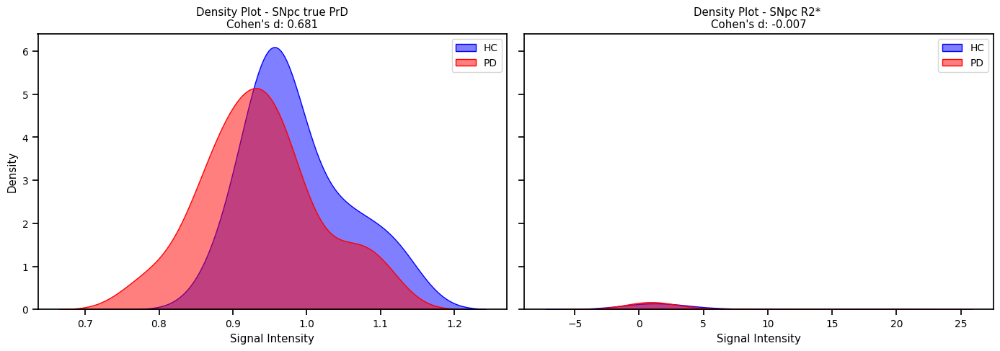

In [103]:
# define features for pd and hc
df_hc_true_pd = df_total[df_total['status'] == 0]['SN STAGE_TRUE_PD_MAP_reg_mni']
df_pd_true_pd = df_total[df_total['status'] == 1]['SN STAGE_TRUE_PD_MAP_reg_mni']

df_hc_tSWIhpf = df_total[df_total['status'] == 0]['SN STAGE_R2S_e3_reg_mni']
df_pd_tSWIhpf = df_total[df_total['status'] == 1]['SN STAGE_R2S_e3_reg_mni']

# function to calculate Cohen's d
def cohens_d(group1, group2):
    # calculate means and standard deviations
    mean1, mean2 = np.mean(group1), np.mean(group2)
    std1, std2 = np.std(group1, ddof=1), np.std(group2, ddof=1)
    # pooled standard deviation
    pooled_std = np.sqrt((std1**2 + std2**2) / 2)
    return (mean1 - mean2) / pooled_std


cohen_d_true_pd = cohens_d(df_hc_true_pd, df_pd_true_pd)
cohen_d_tSWIhpf = cohens_d(df_hc_tSWIhpf, df_pd_tSWIhpf)

print(f"Cohen's d for SNpc True PrD: {cohen_d_true_pd:.3f}")
print(f"Cohen's d for SNpc R2*: {cohen_d_tSWIhpf:.3f}")

fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=True)

# histogram density plot 
sns.kdeplot(df_hc_true_pd, fill=True, color='blue', label='HC', alpha=0.5, ax=axes[0])
sns.kdeplot(df_pd_true_pd, fill=True, color='red', label='PD', alpha=0.5, ax=axes[0])
axes[0].set_title(f'Density Plot - SNpc true PrD\nCohen\'s d: {cohen_d_true_pd:.3f}')
axes[0].set_xlabel('Signal Intensity')
axes[0].set_ylabel('Density')
axes[0].legend()

# histogram density plot 
sns.kdeplot(df_hc_tSWIhpf, fill=True, color='blue', label='HC', alpha=0.5, ax=axes[1])
sns.kdeplot(df_pd_tSWIhpf, fill=True, color='red', label='PD', alpha=0.5, ax=axes[1])
axes[1].set_title(f'Density Plot - SNpc R2* \nCohen\'s d: {cohen_d_tSWIhpf:.3f}')
axes[1].set_xlabel('Signal Intensity')
axes[1].legend()

plt.tight_layout()
plt.show()

### LC

Comparing distributions of LC True PrD across PD and HC groups (KDE) to an expected normal distribution (PDF)

In [104]:
# define feature for pd and hc
df_hc = df_total[df_total['status'] == 0]['LC STAGE_TRUE_PD_MAP_reg_mni'].dropna()  # HC
df_pd = df_total[df_total['status'] == 1]['LC STAGE_TRUE_PD_MAP_reg_mni'].dropna()  # PD

fig = go.Figure()

# HC data
if not df_hc.empty:
    hc_mean, hc_std = np.mean(df_hc), np.std(df_hc)
    x_values = np.linspace(df_hc.min(), df_hc.max(), 100)

    # KDE
    kde_hc = gaussian_kde(df_hc)
    kde_values_hc = kde_hc(x_values)

    # normal PDF
    hc_density = norm.pdf(x_values, hc_mean, hc_std)
    
    fig.add_trace(go.Scatter(x=x_values, y=kde_values_hc, fill='tozeroy', mode='none', name='HC KDE', 
                             fillcolor='rgba(0, 0, 255, 0.3)'))
    
    fig.add_trace(go.Scatter(x=x_values, y=hc_density, mode='lines', name='HC Normal Curve', 
                             line=dict(color='blue', dash='dash')))

# PD data
if not df_pd.empty:
    pd_mean, pd_std = np.mean(df_pd), np.std(df_pd)
    x_values = np.linspace(df_pd.min(), df_pd.max(), 100)

    # KDE
    kde_pd = gaussian_kde(df_pd)
    kde_values_pd = kde_pd(x_values)

    # normal PDF
    pd_density = norm.pdf(x_values, pd_mean, pd_std)
    
    fig.add_trace(go.Scatter(x=x_values, y=kde_values_pd, fill='tozeroy', mode='none', name='PD KDE', 
                             fillcolor='rgba(255, 0, 0, 0.3)'))
    
    fig.add_trace(go.Scatter(x=x_values, y=pd_density, mode='lines', name='PD Normal Curve', 
                             line=dict(color='red', dash='dash')))

fig.update_layout(
    title='PD vs HC - LC true PrD',
    xaxis_title='Signal - Mean Intensity',
    yaxis_title='Density - number of patients',
    legend_title='Groups',
    bargap=0.1
)

fig.show()

Distribution of LC true PrD across all participants

In [105]:
# define feature for PD and HC
df_hc = df_total[df_total['status'] == 0][['LC STAGE_TRUE_PD_MAP_reg_mni']] 
df_pd = df_total[df_total['status'] == 1][['LC STAGE_TRUE_PD_MAP_reg_mni']]    

# calculating mean signal intensity across both groups for this modality
mean_hc = df_hc['LC STAGE_TRUE_PD_MAP_reg_mni'].mean()
mean_pd = df_pd['LC STAGE_TRUE_PD_MAP_reg_mni'].mean()
print(f"Mean Signal Intensity for HC: {mean_hc:.4f}")
print(f"Mean Signal Intensity for PD: {mean_pd:.4f}")

fig = go.Figure()

# HC data
fig.add_trace(go.Bar(
    x=df_hc.index, 
    y=df_hc['LC STAGE_TRUE_PD_MAP_reg_mni'],  
    name='HC',
    marker_color='blue',
    opacity=0.6
))

# PD data
fig.add_trace(go.Bar(
    x=df_pd.index,  
    y=df_pd['LC STAGE_TRUE_PD_MAP_reg_mni'], 
    name='PD',
    marker_color='red',
    opacity=0.6
))


fig.update_layout(
    title='PD vs HC - LC true PrD',
    xaxis_title='Patient ID',
    yaxis_title='Signal - Mean Intensity',
    barmode='group',  
    legend_title='Groups',
    xaxis_tickangle=-45,  
    bargap=0.1, 
    xaxis=dict(title_font=dict(size=16), tickfont=dict(size=5))
)

fig.show()

Mean Signal Intensity for HC: 1.0155
Mean Signal Intensity for PD: 0.9657


Distribution of LC CROWN T2* across all participants

In [106]:
# defining features for pd and hc
df_hc = df_total[df_total['status'] == 0][['LC STAGE_CROWN_T2S_A2_reg_mni']] 
df_pd = df_total[df_total['status'] == 1][['LC STAGE_CROWN_T2S_A2_reg_mni']]    

# calculating mean signal intensity across both groups for this modality
mean_hc = df_hc['LC STAGE_CROWN_T2S_A2_reg_mni'].mean()
mean_pd = df_pd['LC STAGE_CROWN_T2S_A2_reg_mni'].mean()
print(f"Mean Signal Intensity for HC: {mean_hc:.4f}")
print(f"Mean Signal Intensity for PD: {mean_pd:.4f}")

fig = go.Figure()

# HC data
fig.add_trace(go.Bar(
    x=df_hc.index,  
    y=df_hc['LC STAGE_CROWN_T2S_A2_reg_mni'],  
    name='HC',
    marker_color='blue',
    opacity=0.6
))

# PD data
fig.add_trace(go.Bar(
    x=df_pd.index, 
    y=df_pd['LC STAGE_CROWN_T2S_A2_reg_mni'], 
    name='PD',
    marker_color='red',
    opacity=0.6
))

fig.update_layout(
    title='PD vs HC - LC CROWN T2*',
    xaxis_title='Patient ID',
    yaxis_title='Signal - Mean Intensity',
    barmode='group',  
    legend_title='Groups',
    xaxis_tickangle=-45,  
    bargap=0.1, 
    xaxis=dict(title_font=dict(size=16), tickfont=dict(size=5))
)

fig.show()

Mean Signal Intensity for HC: 0.8814
Mean Signal Intensity for PD: 0.8808


Comparing density distributions of LC CROWN True PrD and LC CROWN T2* A2 across PD and HC groups , to see how well they match

Cohen's d for LC True PrD: 0.551
Cohen's d for LC CROWN T2* A2: 0.002


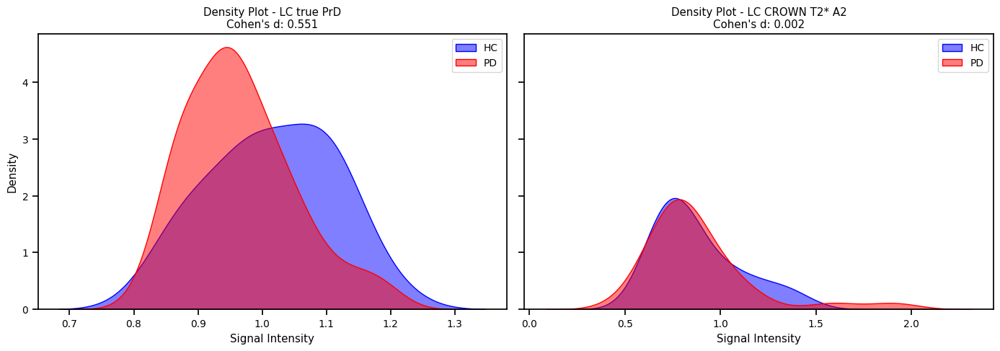

In [107]:
# defining features for pd and hc
df_hc_true_pd = df_total[df_total['status'] == 0]['LC STAGE_TRUE_PD_MAP_reg_mni']
df_pd_true_pd = df_total[df_total['status'] == 1]['LC STAGE_TRUE_PD_MAP_reg_mni']

df_hc_tSWIhpf = df_total[df_total['status'] == 0]['LC STAGE_CROWN_T2S_A2_reg_mni']
df_pd_tSWIhpf = df_total[df_total['status'] == 1]['LC STAGE_CROWN_T2S_A2_reg_mni']

# function to calculate Cohen's d
def cohens_d(group1, group2):
    # mean and standard deviation
    mean1, mean2 = np.mean(group1), np.mean(group2)
    std1, std2 = np.std(group1, ddof=1), np.std(group2, ddof=1)
    # pooled standard deviation
    pooled_std = np.sqrt((std1**2 + std2**2) / 2)
    return (mean1 - mean2) / pooled_std

cohen_d_true_pd = cohens_d(df_hc_true_pd, df_pd_true_pd)
cohen_d_tSWIhpf = cohens_d(df_hc_tSWIhpf, df_pd_tSWIhpf)
print(f"Cohen's d for LC True PrD: {cohen_d_true_pd:.3f}")
print(f"Cohen's d for LC CROWN T2* A2: {cohen_d_tSWIhpf:.3f}")

fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=True)

# histogram density plot 
sns.kdeplot(df_hc_true_pd, fill=True, color='blue', label='HC', alpha=0.5, ax=axes[0])
sns.kdeplot(df_pd_true_pd, fill=True, color='red', label='PD', alpha=0.5, ax=axes[0])
axes[0].set_title(f'Density Plot - LC true PrD\nCohen\'s d: {cohen_d_true_pd:.3f}')
axes[0].set_xlabel('Signal Intensity')
axes[0].set_ylabel('Density')
axes[0].legend()

# histogram density plot 
sns.kdeplot(df_hc_tSWIhpf, fill=True, color='blue', label='HC', alpha=0.5, ax=axes[1])
sns.kdeplot(df_pd_tSWIhpf, fill=True, color='red', label='PD', alpha=0.5, ax=axes[1])
axes[1].set_title(f'Density Plot - LC CROWN T2* A2\nCohen\'s d: {cohen_d_tSWIhpf:.3f}')
axes[1].set_xlabel('Signal Intensity')
axes[1].legend()

plt.tight_layout()
plt.show()

### putamen

Comparing the distributions of putamen True PrD across PD and HC participants (KDE) to an expected normal distribution (PDF)

In [108]:
# defining feature for PD and HC
df_hc = df_total[df_total['status'] == 0]['putamen STAGE_TRUE_PD_MAP_reg_mni'].dropna()  # HC
df_pd = df_total[df_total['status'] == 1]['putamen STAGE_TRUE_PD_MAP_reg_mni'].dropna()  # PD

fig = go.Figure()

# HC data
if not df_hc.empty:
    hc_mean, hc_std = np.mean(df_hc), np.std(df_hc)
    x_values = np.linspace(df_hc.min(), df_hc.max(), 100)

    # KDE
    kde_hc = gaussian_kde(df_hc)
    kde_values_hc = kde_hc(x_values)

    # normal PDF
    hc_density = norm.pdf(x_values, hc_mean, hc_std)
    
    fig.add_trace(go.Scatter(x=x_values, y=kde_values_hc, fill='tozeroy', mode='none', name='HC KDE', 
                             fillcolor='rgba(0, 0, 255, 0.3)'))
    
    fig.add_trace(go.Scatter(x=x_values, y=hc_density, mode='lines', name='HC Normal Curve', 
                             line=dict(color='blue', dash='dash')))

# PD data 
if not df_pd.empty:
    pd_mean, pd_std = np.mean(df_pd), np.std(df_pd)
    x_values = np.linspace(df_pd.min(), df_pd.max(), 100)

    # KDE
    kde_pd = gaussian_kde(df_pd)
    kde_values_pd = kde_pd(x_values)

    # normal PDF
    pd_density = norm.pdf(x_values, pd_mean, pd_std)
    
    fig.add_trace(go.Scatter(x=x_values, y=kde_values_pd, fill='tozeroy', mode='none', name='PD KDE', 
                             fillcolor='rgba(255, 0, 0, 0.3)'))
    
    fig.add_trace(go.Scatter(x=x_values, y=pd_density, mode='lines', name='PD Normal Curve', 
                             line=dict(color='red', dash='dash')))

fig.update_layout(
    title='PD vs HC - putamen true PrD',
    xaxis_title='Signal - Mean Intensity',
    yaxis_title='Density - number of patients',
    legend_title='Groups',
    bargap=0.1
)

fig.show()

Comparing distribution of putamen True PrD across all participants

In [109]:
# define feature for all participants, PD + HC
df_hc = df_total[df_total['status'] == 0][['putamen STAGE_TRUE_PD_MAP_reg_mni']]  
df_pd = df_total[df_total['status'] == 1][['putamen STAGE_TRUE_PD_MAP_reg_mni']]    

# calculating mean signal intensity across both groups for this modality
mean_hc = df_hc['putamen STAGE_TRUE_PD_MAP_reg_mni'].mean()
mean_pd = df_pd['putamen STAGE_TRUE_PD_MAP_reg_mni'].mean()
print(f"Mean Signal Intensity for HC: {mean_hc:.4f}")
print(f"Mean Signal Intensity for PD: {mean_pd:.4f}")

fig = go.Figure()

# HC data
fig.add_trace(go.Bar(
    x=df_hc.index,  
    y=df_hc['putamen STAGE_TRUE_PD_MAP_reg_mni'], 
    name='HC',
    marker_color='blue',
    opacity=0.6
))

# PD data
fig.add_trace(go.Bar(
    x=df_pd.index,  
    y=df_pd['putamen STAGE_TRUE_PD_MAP_reg_mni'], 
    name='PD',
    marker_color='red',
    opacity=0.6
))

fig.update_layout(
    title='PD vs HC - putamen true PrD',
    xaxis_title='Patient ID',
    yaxis_title='Signal - Mean Intensity',
    barmode='group',  # group bars together for HC and PD
    legend_title='Groups',
    xaxis_tickangle=-45,  
    bargap=0.1, 
    xaxis=dict(title_font=dict(size=16), tickfont=dict(size=5))
)

fig.show()

Mean Signal Intensity for HC: 0.9159
Mean Signal Intensity for PD: 0.8716


Distribution of putamen meSWIM across all participants

In [110]:
# defining feature for PD and HC 
df_hc = df_total[df_total['status'] == 0][['putamen STAGE_meSWIM_reg_mni']]  
df_pd = df_total[df_total['status'] == 1][['putamen STAGE_meSWIM_reg_mni']]    

# calculating mean signal intensity across both groups for this modality
mean_hc = df_hc['putamen STAGE_meSWIM_reg_mni'].mean()
mean_pd = df_pd['putamen STAGE_meSWIM_reg_mni'].mean()
print(f"Mean Signal Intensity for HC: {mean_hc:.4f}")
print(f"Mean Signal Intensity for PD: {mean_pd:.4f}")

fig = go.Figure()

# HC data
fig.add_trace(go.Bar(
    x=df_hc.index,  
    y=df_hc['putamen STAGE_meSWIM_reg_mni'], 
    name='HC',
    marker_color='blue',
    opacity=0.6
))

# PD data
fig.add_trace(go.Bar(
    x=df_pd.index,  
    y=df_pd['putamen STAGE_meSWIM_reg_mni'], 
    name='PD',
    marker_color='red',
    opacity=0.6
))

fig.update_layout(
    title='PD vs HC - putamen meSWIM',
    xaxis_title='Patient ID',
    yaxis_title='Signal - Mean Intensity',
    barmode='group',  # group bars together for HC and PD
    legend_title='Groups',
    xaxis_tickangle=-45,  
    bargap=0.1, 
    xaxis=dict(title_font=dict(size=16), tickfont=dict(size=5))
)

fig.show()

Mean Signal Intensity for HC: 1.4809
Mean Signal Intensity for PD: 1.5987


Comparing density distribution of putamen True PrD and putamen meSWIM across PD and HC groups, to see how well they match

Cohen's d for putamen True PrD: 0.748
Cohen's d for putamen meSWIM: -0.037


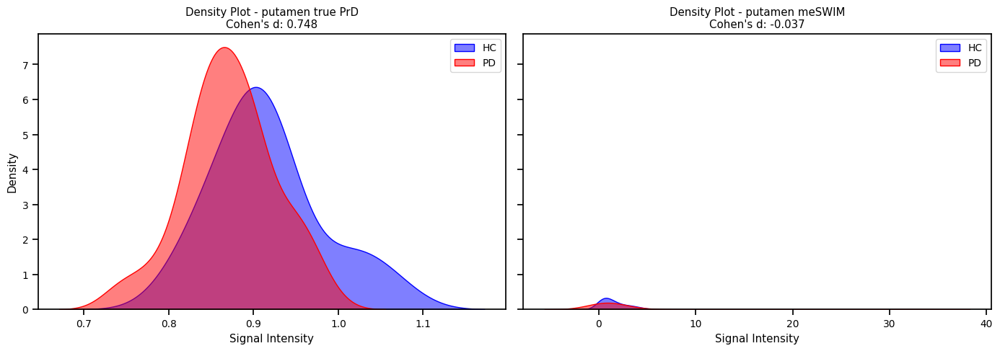

In [111]:
# defining features for pd and hc
df_hc_true_pd = df_total[df_total['status'] == 0]['putamen STAGE_TRUE_PD_MAP_reg_mni']
df_pd_true_pd = df_total[df_total['status'] == 1]['putamen STAGE_TRUE_PD_MAP_reg_mni']

df_hc_tSWIhpf = df_total[df_total['status'] == 0]['putamen STAGE_meSWIM_reg_mni']
df_pd_tSWIhpf = df_total[df_total['status'] == 1]['putamen STAGE_meSWIM_reg_mni']

# function to calculate Cohen's d
def cohens_d(group1, group2):
    # mean and standard deviation
    mean1, mean2 = np.mean(group1), np.mean(group2)
    std1, std2 = np.std(group1, ddof=1), np.std(group2, ddof=1)
    # pooled standard deviation
    pooled_std = np.sqrt((std1**2 + std2**2) / 2)
    return (mean1 - mean2) / pooled_std

cohen_d_true_pd = cohens_d(df_hc_true_pd, df_pd_true_pd)
cohen_d_tSWIhpf = cohens_d(df_hc_tSWIhpf, df_pd_tSWIhpf)

print(f"Cohen's d for putamen True PrD: {cohen_d_true_pd:.3f}")
print(f"Cohen's d for putamen meSWIM: {cohen_d_tSWIhpf:.3f}")

fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=True)

# histogram density plot 
sns.kdeplot(df_hc_true_pd, fill=True, color='blue', label='HC', alpha=0.5, ax=axes[0])
sns.kdeplot(df_pd_true_pd, fill=True, color='red', label='PD', alpha=0.5, ax=axes[0])
axes[0].set_title(f'Density Plot - putamen true PrD\nCohen\'s d: {cohen_d_true_pd:.3f}')
axes[0].set_xlabel('Signal Intensity')
axes[0].set_ylabel('Density')
axes[0].legend()

# histogram density plot
sns.kdeplot(df_hc_tSWIhpf, fill=True, color='blue', label='HC', alpha=0.5, ax=axes[1])
sns.kdeplot(df_pd_tSWIhpf, fill=True, color='red', label='PD', alpha=0.5, ax=axes[1])
axes[1].set_title(f'Density Plot - putamen meSWIM\nCohen\'s d: {cohen_d_tSWIhpf:.3f}')
axes[1].set_xlabel('Signal Intensity')
axes[1].legend()

plt.tight_layout()
plt.show()

## Examining all ROIs

Mean intensity for each participant across all features, to better understand difference between HC and PD + look for outliers

In [112]:
df_investigated = df_total.iloc[:, 17:]  
mri_mean_values = df_investigated.mean(axis=1, skipna=True)
mri_mean_values_clean = mri_mean_values.replace([float('inf'), -float('inf')], float('nan'))

# separate HC and PD groups
df_hc = df_total[df_total['status'] == 0]
df_pd = df_total[df_total['status'] == 1]
df_hc = df_hc[df_hc.index.isin(mri_mean_values.dropna().index)]
df_pd = df_pd[df_pd.index.isin(mri_mean_values.dropna().index)]


fig = go.Figure()

# plot HC data
fig.add_trace(go.Bar(
    x=df_hc.index, 
    y=mri_mean_values[df_hc.index], 
    name='HC',
    marker_color='blue',
    opacity=0.6
))

# plot PD data
fig.add_trace(go.Bar(
    x=df_pd.index,
    y=mri_mean_values[df_pd.index],  
    name='PD',
    marker_color='red',
    opacity=0.6
))

fig.update_layout(
    title='PD vs HC - Mean MRI Intensity',
    xaxis_title='Patient ID',
    yaxis_title='Mean Signal Intensity (All Modalities)',
    barmode='group', 
    legend_title='Groups',
    xaxis_tickangle=-45,  
    bargap=0.1, 
    xaxis=dict(title_font=dict(size=16), tickfont=dict(size=5))
)

fig.show()

Bar chart with features that have high mean intensity across all participants (above a threshold) + looking at number of instances where the mean intensity was above the threshold across all participants for the same features

In [113]:
df_investigated = df_total.iloc[:, 17:]  
mean_intensity_count = df_investigated.mean(axis=0)

# set threshold for high intensity 
threshold = 3  
high_mean_count = mean_intensity_count[mean_intensity_count > threshold]
high_mean_list = high_mean_count.index.tolist()


fig1 = go.Figure()

fig1.add_trace(go.Bar(
    x=high_mean_count.index,  # modalities above threshold
    y=high_mean_count.values,  # mean intensity above threshold
    name='High Mean Intensity Modalities',
    marker_color='blue',
    opacity=0.6
))

fig1.update_layout(
    title='Mean Intensity Across MRI Modalities (Above Threshold)',
    xaxis_title='MRI Modality',
    yaxis_title='Mean Intensity',
    xaxis_tickangle=-45,
    bargap=0.1,
    xaxis=dict(title_font=dict(size=16), tickfont=dict(size=10)),
    yaxis=dict(title_font=dict(size=16))
)

high_outliers_count = {outlier: {modality: 0 for modality in high_mean_list} for outlier in df_investigated.index}

high_outliers = {}

for modality in high_mean_list:
    outlier_values = df_investigated[modality] 
    high_outliers[modality] = outlier_values[outlier_values > mean_intensity_count[modality]]
    for outlier in high_outliers[modality].index:
        high_outliers_count[outlier][modality] += 1

# compute total high intensity count per modality
modality_high_intensity_count = {modality: sum(high_outliers_count[outlier][modality] for outlier in high_outliers_count) for modality in high_mean_list}

# plot - high intensity count per modality
fig2 = go.Figure()

fig2.add_trace(go.Bar(
    x=list(modality_high_intensity_count.keys()), 
    y=list(modality_high_intensity_count.values()),  
    name='High Intensity Count per Modality',
    marker_color='red',
    opacity=0.6
))

fig2.update_layout(
    title='High Intensity Count per Modality Across Participants',
    xaxis_title='MRI Modality',
    yaxis_title='High Intensity Count',
    xaxis_tickangle=-45, 
    bargap=0.1,
    xaxis=dict(title_font=dict(size=16), tickfont=dict(size=10)),
    yaxis=dict(title_font=dict(size=16))
)

fig1.show()
fig2.show()

## PIGD VS TD

### SNpc

Comparing distributions of SNpc CROWN T2* A2 across PIGD and TD groups (KDE) to an expected normal distribution (PDF)

In [114]:
# define feature for pigd and td
df_td_sn = df_total[df_total['tdpigdphenotype'] == 3]['SN STAGE_CROWN_T2S_A2_reg_mni'].dropna()
df_pigd_sn = df_total[df_total['tdpigdphenotype'] == 2]['SN STAGE_CROWN_T2S_A2_reg_mni'].dropna()

fig = go.Figure()

# TD data
if not df_td_sn.empty:
    td_mean, td_std = np.mean(df_td_sn), np.std(df_td_sn)
    x_values = np.linspace(df_td_sn.min(), df_td_sn.max(), 100)

    # KDE
    kde_td = gaussian_kde(df_td_sn)
    kde_values_td = kde_td(x_values)

    # normal PDF
    td_density = norm.pdf(x_values, td_mean, td_std)
    
    fig.add_trace(go.Scatter(x=x_values, y=kde_values_td, fill='tozeroy', mode='none', name='TD KDE', 
                             fillcolor='rgba(0, 0, 255, 0.3)'))
    
    fig.add_trace(go.Scatter(x=x_values, y=td_density, mode='lines', name='TD Normal Curve', 
                             line=dict(color='blue', dash='dash')))

# PIGD data 
if not df_pigd_sn.empty:
    pigd_mean, pigd_std = np.mean(df_pigd_sn), np.std(df_pigd_sn)
    x_values = np.linspace(df_pigd_sn.min(), df_pigd_sn.max(), 100)

    # KDE
    kde_pigd = gaussian_kde(df_pigd_sn)
    kde_values_pigd = kde_pigd(x_values)

    # normal PDF
    pigd_density = norm.pdf(x_values, pigd_mean, pigd_std)
    
    fig.add_trace(go.Scatter(x=x_values, y=kde_values_pigd, fill='tozeroy', mode='none', name='PIGD KDE', 
                             fillcolor='rgba(255, 0, 0, 0.3)'))
    
    fig.add_trace(go.Scatter(x=x_values, y=pigd_density, mode='lines', name='PIGD Normal Curve', 
                             line=dict(color='red', dash='dash')))

fig.update_layout(
    title='PIGD vs TD - SNpc CROWN T2* A2',
    xaxis_title='Signal - Mean Intensity',
    yaxis_title='Density - number of patients',
    legend_title='Groups',
    bargap=0.1
)

fig.show()

Density plots for SNpc CROWN T2* A2 and SNpc T2* MIP across PIGD and TD groups, looking at how well they match

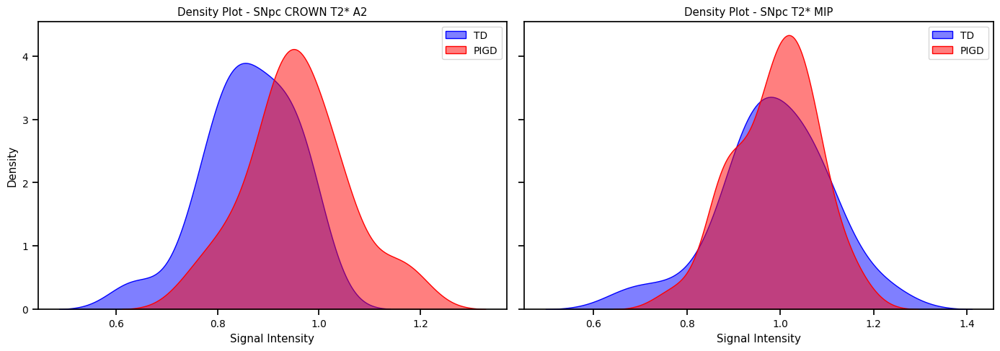

In [115]:
# define feature for pigd and td
df_td_sn_1 = df_total[df_total['tdpigdphenotype'] == 3]['SN STAGE_CROWN_T2S_A2_reg_mni']
df_pigd_sn_1 = df_total[df_total['tdpigdphenotype'] == 2]['SN STAGE_CROWN_T2S_A2_reg_mni']

df_td_sn_2 = df_total[df_total['tdpigdphenotype'] == 3]['SN STAGE_T2S_MIP_e3_reg_mni']
df_pigd_sn_2 = df_total[df_total['tdpigdphenotype'] == 2]['SN STAGE_T2S_MIP_e3_reg_mni']

fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=True)

# histogram density plot 
sns.kdeplot(df_td_sn_1, fill=True, color='blue', label='TD', alpha=0.5, ax=axes[0])
sns.kdeplot(df_pigd_sn_1, fill=True, color='red', label='PIGD', alpha=0.5, ax=axes[0])
axes[0].set_title('Density Plot - SNpc CROWN T2* A2')
axes[0].set_xlabel('Signal Intensity')
axes[0].set_ylabel('Density')
axes[0].legend()

# histogram density plot 
sns.kdeplot(df_td_sn_2, fill=True, color='blue', label='TD', alpha=0.5, ax=axes[1])
sns.kdeplot(df_pigd_sn_2, fill=True, color='red', label='PIGD', alpha=0.5, ax=axes[1])
axes[1].set_title('Density Plot - SNpc T2* MIP')
axes[1].set_xlabel('Signal Intensity')
axes[1].legend()
plt.tight_layout()
plt.show()

### LC

Comparing distributions of LC T1 across PIGD and TD groups (KDE) to an expected normal distribution (PDF)

In [116]:
# define feature for pigd and td
df_td_lc = df_total[df_total['tdpigdphenotype'] == 3]['LC STAGE_T1MAP_reg_mni'].dropna()
df_pigd_lc = df_total[df_total['tdpigdphenotype'] == 2]['LC STAGE_T1MAP_reg_mni'].dropna()

fig = go.Figure()

# TD data
if not df_td_lc.empty:
    td_mean, td_std = np.mean(df_td_lc), np.std(df_td_lc)
    x_values = np.linspace(df_td_lc.min(), df_td_lc.max(), 100)

    # KDE
    kde_td = gaussian_kde(df_td_lc)
    kde_values_td = kde_td(x_values)

    # normal PDF
    td_density = norm.pdf(x_values, td_mean, td_std)
    
    fig.add_trace(go.Scatter(x=x_values, y=kde_values_td, fill='tozeroy', mode='none', name='TD KDE', 
                             fillcolor='rgba(0, 0, 255, 0.3)'))
    
    fig.add_trace(go.Scatter(x=x_values, y=td_density, mode='lines', name='TD Normal Curve', 
                             line=dict(color='blue', dash='dash')))

# PIGD data 
if not df_pigd_lc.empty:
    pigd_mean, pigd_std = np.mean(df_pigd_lc), np.std(df_pigd_lc)
    x_values = np.linspace(df_pigd_lc.min(), df_pigd_lc.max(), 100)

    # KDE
    kde_pigd = gaussian_kde(df_pigd_lc)
    kde_values_pigd = kde_pigd(x_values)

    # normal PDF
    pigd_density = norm.pdf(x_values, pigd_mean, pigd_std)
    
    fig.add_trace(go.Scatter(x=x_values, y=kde_values_pigd, fill='tozeroy', mode='none', name='PIGD KDE', 
                             fillcolor='rgba(255, 0, 0, 0.3)'))
    
    fig.add_trace(go.Scatter(x=x_values, y=pigd_density, mode='lines', name='PIGD Normal Curve', 
                             line=dict(color='red', dash='dash')))

fig.update_layout(
    title='PIGD vs TD - LC T1',
    xaxis_title='Signal - Mean Intensity',
    yaxis_title='Density - number of patients',
    legend_title='Groups',
    bargap=0.1
)

fig.show()

Comparison density distributions of LC T1 and LC SWI for PIGD and TD groups to see how the distributions match

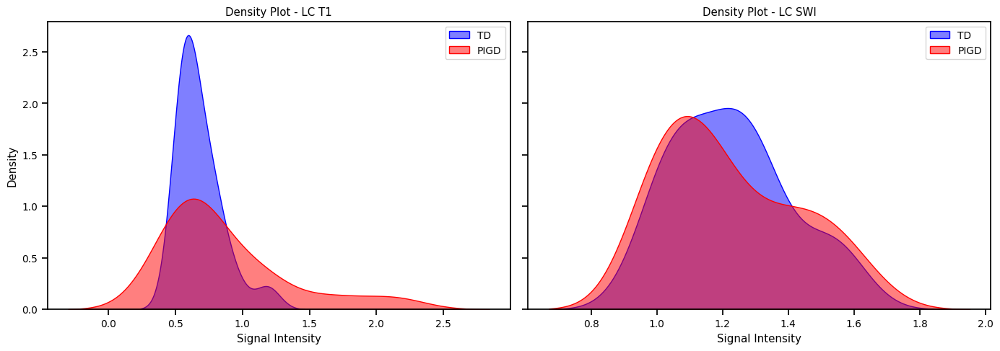

In [117]:
# define feature for pigd and td
df_td_lc_1 = df_total[df_total['tdpigdphenotype'] == 3]['LC STAGE_T1MAP_reg_mni']
df_pigd_lc_1 = df_total[df_total['tdpigdphenotype'] == 2]['LC STAGE_T1MAP_reg_mni']

df_td_lc_2 = df_total[df_total['tdpigdphenotype'] == 3]['LC STAGE_SWI_ECHO-3_e3_reg_mni']
df_pigd_lc_2 = df_total[df_total['tdpigdphenotype'] == 2]['LC STAGE_SWI_ECHO-3_e3_reg_mni']
fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=True)

# histogram density plot 
sns.kdeplot(df_td_lc_1, fill=True, color='blue', label='TD', alpha=0.5, ax=axes[0])
sns.kdeplot(df_pigd_lc_1, fill=True, color='red', label='PIGD', alpha=0.5, ax=axes[0])
axes[0].set_title('Density Plot - LC T1')
axes[0].set_xlabel('Signal Intensity')
axes[0].set_ylabel('Density')
axes[0].legend()

# histogram density plot 
sns.kdeplot(df_td_lc_2, fill=True, color='blue', label='TD', alpha=0.5, ax=axes[1])
sns.kdeplot(df_pigd_lc_2, fill=True, color='red', label='PIGD', alpha=0.5, ax=axes[1])
axes[1].set_title('Density Plot - LC SWI')
axes[1].set_xlabel('Signal Intensity')
axes[1].legend()
plt.tight_layout()
plt.show()

### putamen

Comparing distributions of putamen simCSF across PIGD and TD groups (KDE) to an expected normal distribution (PDF)

In [118]:
# define feature for pigd and td
df_td_putamen = df_total[df_total['tdpigdphenotype'] == 3]['putamen STAGE_simCSF_reg_mni'].dropna()
df_pigd_putamen = df_total[df_total['tdpigdphenotype'] == 2]['putamen STAGE_simCSF_reg_mni'].dropna()

fig = go.Figure()

# TD data
if not df_td_putamen.empty:
    td_mean, td_std = np.mean(df_td_putamen), np.std(df_td_putamen)
    x_values = np.linspace(df_td_putamen.min(), df_td_putamen.max(), 100)

    # KDE
    kde_td = gaussian_kde(df_td_putamen)
    kde_values_td = kde_td(x_values)

    # normal PDF
    td_density = norm.pdf(x_values, td_mean, td_std)
    
    fig.add_trace(go.Scatter(x=x_values, y=kde_values_td, fill='tozeroy', mode='none', name='TD KDE', 
                             fillcolor='rgba(0, 0, 255, 0.3)'))
    
    fig.add_trace(go.Scatter(x=x_values, y=td_density, mode='lines', name='TD Normal Curve', 
                             line=dict(color='blue', dash='dash')))

# PIGD data 
if not df_pigd_putamen.empty:
    pigd_mean, pigd_std = np.mean(df_pigd_putamen), np.std(df_pigd_putamen)
    x_values = np.linspace(df_pigd_putamen.min(), df_pigd_putamen.max(), 100)

    # KDE
    kde_pigd = gaussian_kde(df_pigd_putamen)
    kde_values_pigd = kde_pigd(x_values)

    # normal PDF
    pigd_density = norm.pdf(x_values, pigd_mean, pigd_std)
    
    fig.add_trace(go.Scatter(x=x_values, y=kde_values_pigd, fill='tozeroy', mode='none', name='PIGD KDE', 
                             fillcolor='rgba(255, 0, 0, 0.3)'))
    
    fig.add_trace(go.Scatter(x=x_values, y=pigd_density, mode='lines', name='PIGD Normal Curve', 
                             line=dict(color='red', dash='dash')))

fig.update_layout(
    title='PIGD vs TD - putamen simCSF',
    xaxis_title='Signal - Mean Intensity',
    yaxis_title='Density - number of patients',
    legend_title='Groups',
    bargap=0.1
)

fig.show()

Density plots for putamen simCSF and putamen CROWN True PrD A across PIGD and TD groups

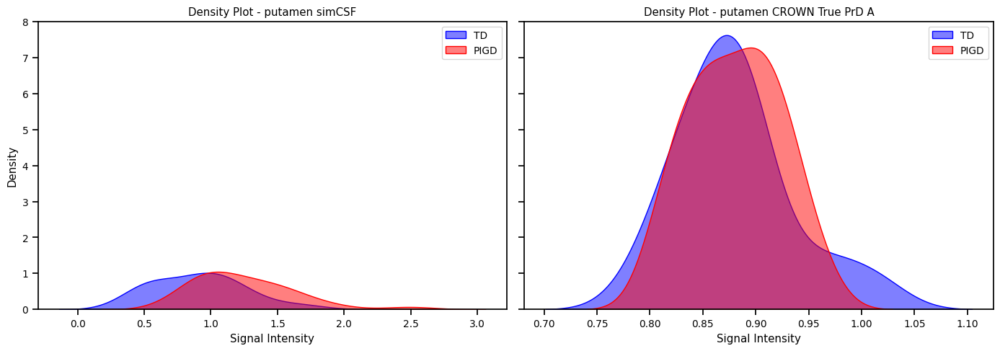

In [119]:
# define features for pigd and td
df_td_put_1 = df_total[df_total['tdpigdphenotype'] == 3]['putamen STAGE_simCSF_reg_mni']
df_pigd_put_1 = df_total[df_total['tdpigdphenotype'] == 2]['putamen STAGE_simCSF_reg_mni']
df_td_put_2 = df_total[df_total['tdpigdphenotype'] == 3]['putamen STAGE_CROWN_TRUE_PD_MAPa_reg_mni']
df_pigd_put_2 = df_total[df_total['tdpigdphenotype'] == 2]['putamen STAGE_CROWN_TRUE_PD_MAPa_reg_mni']

fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=True)

# histogram density plot
sns.kdeplot(df_td_put_1, fill=True, color='blue', label='TD', alpha=0.5, ax=axes[0])
sns.kdeplot(df_pigd_put_1, fill=True, color='red', label='PIGD', alpha=0.5, ax=axes[0])
axes[0].set_title('Density Plot - putamen simCSF')
axes[0].set_xlabel('Signal Intensity')
axes[0].set_ylabel('Density')
axes[0].legend()

# histogram density plot
sns.kdeplot(df_td_put_2, fill=True, color='blue', label='TD', alpha=0.5, ax=axes[1])
sns.kdeplot(df_pigd_put_2, fill=True, color='red', label='PIGD', alpha=0.5, ax=axes[1])
axes[1].set_title('Density Plot - putamen CROWN True PrD A')
axes[1].set_xlabel('Signal Intensity')
axes[1].legend()
plt.tight_layout()
plt.show()

<h1 style="text-align: center;"> GENERALIZED LINEAR MODELS (GLMs)  </h1>

## Imputation and scaling

Imputation was performed using 'SimpleImputer' function from 'Scikit-learn', while scaling was performed using 'StandardScaler' from 'Scikit-learn'

In [120]:
imputer = SimpleImputer(strategy='median') # imputing with median values

# HC - relevant clinical variables are gender, age, MoCA score and BSIT
hc_clinical = df_hc.iloc[:, [1, 2, 15, 16]].values
hc_mri = df_hc.iloc[:, 17:].values

hc_clinical_imputed = imputer.fit_transform(hc_clinical)
hc_mri_imputed = imputer.fit_transform(hc_mri)

# PD
pd_clinical = df_pd.iloc[:, :17].values
pd_mri = df_pd.iloc[:, 17:].values

pd_clinical_imputed = imputer.fit_transform(pd_clinical)
pd_mri_imputed = imputer.fit_transform(pd_mri)

# PIGD 
pigd_clinical = df_pigd.iloc[:, :17].values
pigd_mri = df_pigd.iloc[:, 17:].values

pigd_clinical_imputed = imputer.fit_transform(pigd_clinical)
pigd_mri_imputed = imputer.fit_transform(pigd_mri)

# TD
td_clinical = df_td.iloc[:, :17].values
td_mri = df_td.iloc[:, 17:].values

td_clinical_imputed = imputer.fit_transform(td_clinical)
td_mri_imputed = imputer.fit_transform(td_mri)



scaler = StandardScaler()

# HC 
hc_clinical_scaled = scaler.fit_transform(hc_clinical_imputed)
hc_mri_scaled = scaler.fit_transform(hc_mri_imputed)

# PD 
pd_clinical_scaled = scaler.fit_transform(pd_clinical_imputed)
pd_mri_scaled = scaler.fit_transform(pd_mri_imputed)

# PIGD 
pigd_clinical_scaled = scaler.fit_transform(pigd_clinical_imputed)
pigd_mri_scaled = scaler.fit_transform(pigd_mri_imputed)

# TD 
td_clinical_scaled = scaler.fit_transform(td_clinical_imputed)
td_mri_scaled = scaler.fit_transform(td_mri_imputed)

In [121]:
print("NaNs in hc_clinical after imputation:", np.isnan(hc_clinical_imputed).sum())
print("NaNs in hc_mri after imputation:", np.isnan(hc_mri_imputed).sum())
print("NaNs in pd_clinical after imputation:", np.isnan(pd_clinical_imputed).sum())
print("NaNs in pd_mri after imputation:", np.isnan(pd_mri_imputed).sum())
print("NaNs in pigd_clinical after imputation:", np.isnan(pigd_clinical_imputed).sum())
print("NaNs in pigd_mri after imputation:", np.isnan(pigd_mri_imputed).sum())
print("NaNs in pigd_clinical after imputation:", np.isnan(td_clinical_imputed).sum())
print("NaNs in pigd_mri after imputation:", np.isnan(td_mri_imputed).sum())

NaNs in hc_clinical after imputation: 0
NaNs in hc_mri after imputation: 0
NaNs in pd_clinical after imputation: 0
NaNs in pd_mri after imputation: 0
NaNs in pigd_clinical after imputation: 0
NaNs in pigd_mri after imputation: 0
NaNs in pigd_clinical after imputation: 0
NaNs in pigd_mri after imputation: 0


General info on GLM analysis:
- GLM analysis was performed using the Gaussian GLM, function 'sm.families.Gaussian()' from 'Statsmodels'. The function automatically computes Pseudo R (CS) values. 
- Breusch-Pagan test and plotting of Q-Q plots was performed for all four groups HC, PD, PIGD and TD to assess homoscedasticity and normal distribution of residuals, and to assess the choice of the Gaussian model for this analysis. 

## HC

Code used to generate results shown in Table 4.6 - MRI features with significant clinical features

In [122]:
# extracting feature names, MRI and clinical
hc_mri_feature_names = df_hc.columns[17:].tolist()
hc_clinical_feature_names = df_hc.columns[[1, 2, 15, 16]].tolist()

# the scaled clinical and MRI datasets with intercept column added with sm.add_constant
hc_mri_scaled_df = pd.DataFrame(hc_mri_scaled, columns=hc_mri_feature_names)
hc_clinical_scaled_df = pd.DataFrame(hc_clinical_scaled, columns=hc_clinical_feature_names)
hc_clinical_with_intercept = sm.add_constant(hc_clinical_scaled_df)

significant_results_hc = []

# looping through each MRI feature and fitting Gaussian GLM
for feature in hc_mri_scaled_df.columns:
    glm_mri = sm.GLM(hc_mri_scaled_df[feature], hc_clinical_with_intercept, family=sm.families.Gaussian())
    glm_mri_results = glm_mri.fit()

    # Clinical features - significant (p-value < 0.001)
    significant_features = glm_mri_results.pvalues[1:] < 0.001  
    if significant_features.any():  
    
        print(f"Results for MRI feature: {feature}")
        print(glm_mri_results.summary())
        print("\n")
        # creating a dataframe that stores MRI features with significant clinical predictors for reporting in thesis
        significant_results_hc.append({
            'MRI_Feature': feature,
            'Pseudo_R2_CS': round(1 - np.exp((glm_mri_results.llnull - glm_mri_results.llf) * (2 / glm_mri_results.nobs)), 4), 
            'Significant_Predictors': ", ".join(glm_mri_results.pvalues[1:][significant_features].index),
            'P_Values': ", ".join([f"{pval:.4f}" for pval in glm_mri_results.pvalues[1:][significant_features]]),  
        })

significant_results_hc_df = pd.DataFrame(significant_results_hc) 
significant_results_hc_df.to_csv("hc_significant_mri_features.csv", index=False)

Results for MRI feature: LC_R STAGE_meSWIM_filled_MIP_reg_mni
                          Generalized Linear Model Regression Results                           
Dep. Variable:     LC_R STAGE_meSWIM_filled_MIP_reg_mni   No. Observations:                   18
Model:                                              GLM   Df Residuals:                       13
Model Family:                                  Gaussian   Df Model:                            4
Link Function:                                 Identity   Scale:                         0.52428
Method:                                            IRLS   Log-Likelihood:                -16.801
Date:                                  Sun, 01 Jun 2025   Deviance:                       6.8156
Time:                                          14:02:42   Pearson chi2:                     6.82
No. Iterations:                                       3   Pseudo R-squ. (CS):             0.7085
Covariance Type:                              nonrobust          

Performing Breusch-Pagan test to make sure there is no heteroscedasticity in the residuals

In [123]:
residuals = glm_mri_results.resid_response # extracting response residuals

# Breusch-Pagan test
test_stat, p_value, _, _ = het_breuschpagan(residuals, glm_mri_results.model.exog)
if p_value < 0.05:
    print("There is heteroscedasticity in the model.")
else:
    print("No heteroscedasticity detected.")

No heteroscedasticity detected.


In [124]:
residuals = glm_mri_results.resid_response
exog = glm_mri_results.model.exog # design matrix
_, pval_breusch_pagan, _, _ = het_breuschpagan(residuals, exog)
print(f"Breusch-Pagan test p-value: {pval_breusch_pagan}")

Breusch-Pagan test p-value: 0.3143569516289422


Q-Q plot for assessing normality in the residuals, using sm.qqplot function, with a 45 degree line

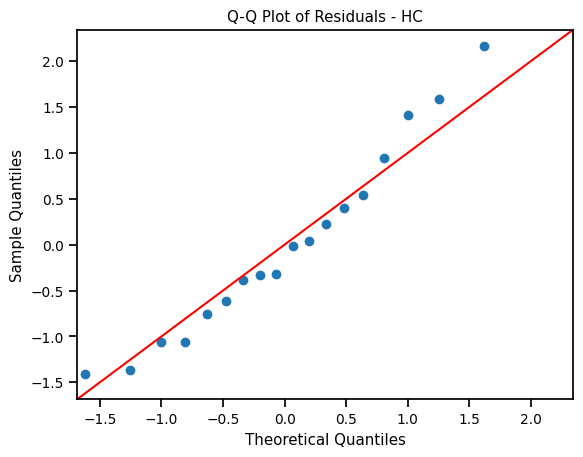

In [125]:
residuals = glm_mri_results.resid_response

# Q-Q plot 
sm.qqplot(residuals, line="45", fit=True)
plt.title("Q-Q Plot of Residuals - HC")
plt.show()

## PD

Code used to generate results shown in Table 4.7 - MRI features with significant clinical features

In [126]:
# extracting feature names, clinical and MRI
pd_mri_feature_names = df_pd.columns[17:].tolist()
pd_clinical_feature_names = df_pd.columns[:17].tolist()

# the scaled clinical and MRI datasets with intercept column added with sm.add_constant
pd_mri_scaled_df = pd.DataFrame(pd_mri_scaled, columns=pd_mri_feature_names)
pd_clinical_scaled_df = pd.DataFrame(pd_clinical_scaled, columns=pd_clinical_feature_names)
pd_clinical_with_intercept = sm.add_constant(pd_clinical_scaled_df)

significant_results = []

# looping through each MRI feature and fitting Gaussian GLM
for feature in pd_mri_scaled_df.columns:
    glm_mri = sm.GLM(pd_mri_scaled_df[feature], pd_clinical_with_intercept, family=sm.families.Gaussian())
    glm_mri_results = glm_mri.fit()

    # clinical features - significant (p-value < 0.01)
    significant_features = glm_mri_results.pvalues[1:] < 0.001  
    if significant_features.any(): 
       
        print(f"Results for MRI feature: {feature}")
        print(glm_mri_results.summary())
        print("\n")
        # creating a dataframe to store MRI features with significant clinical predictors for reporting later
        significant_results.append({
            'MRI_Feature': feature,
            'Pseudo_R2_CS': round(1 - np.exp((glm_mri_results.llnull - glm_mri_results.llf) * (2 / glm_mri_results.nobs)), 4),  
            'Significant_Predictors': ", ".join(glm_mri_results.pvalues[1:][significant_features].index),
            'P_Values': ", ".join([f"{pval:.5f}" for pval in glm_mri_results.pvalues[1:][significant_features]])  
        })

significant_results_df = pd.DataFrame(significant_results)
significant_results_df.to_csv("pd_significant_mri_features.csv", index=False)


Results for MRI feature: SN_L STAGE_CROWN_T2S_A2_reg_mni
                        Generalized Linear Model Regression Results                        
Dep. Variable:     SN_L STAGE_CROWN_T2S_A2_reg_mni   No. Observations:                   57
Model:                                         GLM   Df Residuals:                       40
Model Family:                             Gaussian   Df Model:                           16
Link Function:                            Identity   Scale:                         0.79489
Method:                                       IRLS   Log-Likelihood:                -64.244
Date:                             Sun, 01 Jun 2025   Deviance:                       31.796
Time:                                     14:02:43   Pearson chi2:                     31.8
No. Iterations:                                  3   Pseudo R-squ. (CS):             0.4578
Covariance Type:                         nonrobust                                         
                       

Performing Breusch-Pagan test to make sure there is no heteroscedasticity in the residuals

In [127]:
residuals = glm_mri_results.resid_response # extracting response residuals

# Breusch-Pagan test
test_stat, p_value, _, _ = het_breuschpagan(residuals, glm_mri_results.model.exog)
if p_value < 0.05:
    print("There is heteroscedasticity in the model.")
else:
    print("No heteroscedasticity detected.")

No heteroscedasticity detected.


In [128]:
residuals = glm_mri_results.resid_response
exog = glm_mri_results.model.exog # design matrix

# Breusch-Pagan test 
_, pval_breusch_pagan, _, _ = het_breuschpagan(residuals, exog)


print(f"Breusch-Pagan test p-value: {pval_breusch_pagan}")

Breusch-Pagan test p-value: 0.47679263804006056


Plotting Q-Q plot to assess normality in the residuals, using sm.qqplot function, with 45 degree line

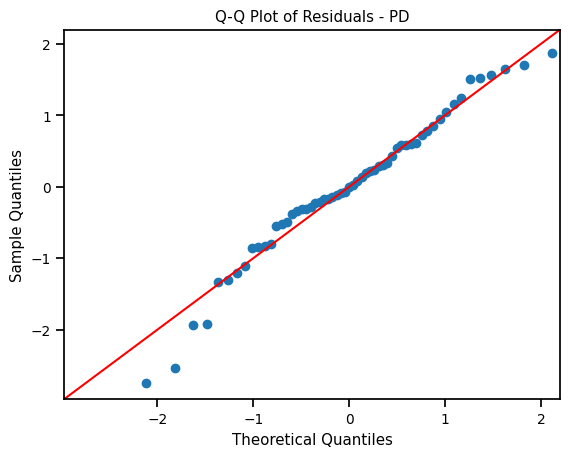

In [129]:
residuals = glm_mri_results.resid_response

# Q-Q plot 
sm.qqplot(residuals, line="45", fit=True)
plt.title("Q-Q Plot of Residuals - PD")
plt.show()

Figure 4.6 - Barplot, significant clinical features (T1WE, putamen)

In [130]:
# Clinical features that were highly significant and corresponding coefficients and p-values
data = {
    "Clinical feature": [
        "Age", "Age at Symptoms", "Disease Duration"
    ],
    "Coefficient": [
        -3.3351, 4.1829, 1.4056
    ],
    "p-value": [
        0.00026, 0.00000, 0.00004
    ],
    "Region": [
        "Putamen", "Putamen", "Putamen"
    ]
}

df = pd.DataFrame(data)
df = df.sort_values(by="Coefficient", key=abs, ascending=False)

# plotting horizontal bar plot
fig_bar = px.bar(
    df,
    x="Coefficient",
    y="Clinical feature",
    color="Coefficient",
    color_continuous_scale=px.colors.diverging.RdYlGn,
    orientation="h",
    title="PD patients: Significant Clinical Features for T1WE in Putamen",
    labels={"Coefficient": "Coefficient Value", "Clinical feature": "Clinical feature"},
    category_orders={"Clinical feature": df["Clinical feature"].tolist()} # maintain sorted order
)

for i, row in df.iterrows():
    fig_bar.add_annotation(
        x=row["Coefficient"],
        y=row["Clinical feature"],
        text=f"p={row['p-value']:.5f}", # annotations of p-values
        showarrow=False,
        font=dict(size=16, color="black"),
        align="center",
        xanchor="right" if row["Coefficient"] < 0 else "left", # left if negative and right if positive coefficients
        xshift=-5 if row["Coefficient"] < 0 else 5
    )

fig_bar.update_layout(
    coloraxis_colorbar=dict(title="Coefficient (\u03B2<sub>k</sub>)"), # color bar for coefficient values, right side
    yaxis=dict(
        title="Clinical Feature", # title clinical feature y-axis
        title_font=dict(size=22), 
        tickfont=dict(size=16),    
        categoryorder="total ascending"
    ),
    xaxis=dict(
        title="Coefficient (\u03B2<sub>k</sub>)", # title coefficients x-axis
        title_font=dict(size=22), 
        tickfont=dict(size=16),
    ),
    showlegend=False,
    title=dict(font=dict(size=26), x=0.5),
    margin=dict(l=150, r=20, t=50, b=20)  
)

fig_bar.update_traces(marker_line_width=0.5)
fig_bar.show()

In [131]:
fig_bar.write_html("GLM_PD_TIWE_P.html")


## PIGD

Code used to generate results shown in Table 4.8 - MRI features with significant clinical features

In [132]:
# extracting feature names, MRI and clinical
pigd_mri_feature_names = df_pigd.columns[17:].tolist()
pigd_clinical_feature_names = df_pigd.columns[:17].tolist()

# the scaled clinical and MRI datasets with intercept column added with sm.add_constant
pigd_mri_scaled_df = pd.DataFrame(pigd_mri_scaled, columns=pigd_mri_feature_names)
pigd_clinical_scaled_df = pd.DataFrame(pigd_clinical_scaled, columns=pigd_clinical_feature_names)
pigd_clinical_with_intercept = sm.add_constant(pigd_clinical_scaled_df)

significant_results_pigd = []

# looping through each MRI feature and fitting Gaussian GLM
for feature in pigd_mri_scaled_df.columns:
    glm_mri = sm.GLM(pigd_mri_scaled_df[feature], pigd_clinical_with_intercept, family=sm.families.Gaussian())
    glm_mri_results = glm_mri.fit()

    # Clinical features - significant (p-value < 0.001)
    significant_features = glm_mri_results.pvalues[1:] < 0.001  # exclude the intercept
    if significant_features.any():
        print(f"Results for MRI feature: {feature}")
        print(glm_mri_results.summary())
        print("\n")
        # dataframe storing MRI features wih significant clinical predictors for reporting in thesis
        significant_results_pigd.append({
            'MRI_Feature': feature,
            'Pseudo_R2_CS': round(1 - np.exp((glm_mri_results.llnull - glm_mri_results.llf) * (2 / glm_mri_results.nobs)), 4),
            'Significant_Predictors': ", ".join(glm_mri_results.pvalues[1:][significant_features].index),
            'P_Values': ", ".join([f"{pval:.5f}" for pval in glm_mri_results.pvalues[1:][significant_features]])  
        })

significant_results_pigd_df = pd.DataFrame(significant_results_pigd)
significant_results_pigd_df.to_csv("pigd_significant_mri_features.csv", index=False)

Results for MRI feature: SN_L STAGE_dSWI_mIP_ECHO-3_e3_reg_mni
                           Generalized Linear Model Regression Results                           
Dep. Variable:     SN_L STAGE_dSWI_mIP_ECHO-3_e3_reg_mni   No. Observations:                   32
Model:                                               GLM   Df Residuals:                       16
Model Family:                                   Gaussian   Df Model:                           15
Link Function:                                  Identity   Scale:                         0.74169
Method:                                             IRLS   Log-Likelihood:                -29.535
Date:                                   Sun, 01 Jun 2025   Deviance:                       11.867
Time:                                           14:02:45   Pearson chi2:                     11.9
No. Iterations:                                        3   Pseudo R-squ. (CS):             0.6470
Covariance Type:                               nonrobus

Breusch-Pagan test to make sure there is no heteroscedasticity in the residuals

In [133]:
residuals = glm_mri_results.resid_response # extracting response residuals

test_stat, p_value, _, _ = het_breuschpagan(residuals, glm_mri_results.model.exog)
if p_value < 0.05:
    print("There is heteroscedasticity in the model.")
else:
    print("No heteroscedasticity detected.")

No heteroscedasticity detected.


In [134]:
residuals = glm_mri_results.resid_response

exog = glm_mri_results.model.exog # design matrix

# Breusch-Pagan test
_, pval_breusch_pagan, _, _ = het_breuschpagan(residuals, exog)

print(f"Breusch-Pagan test p-value: {pval_breusch_pagan}")


Breusch-Pagan test p-value: 0.43819797923427056


Q-Q plot to assess normality in the residuals, using sm.qqplot function with 45 degree line

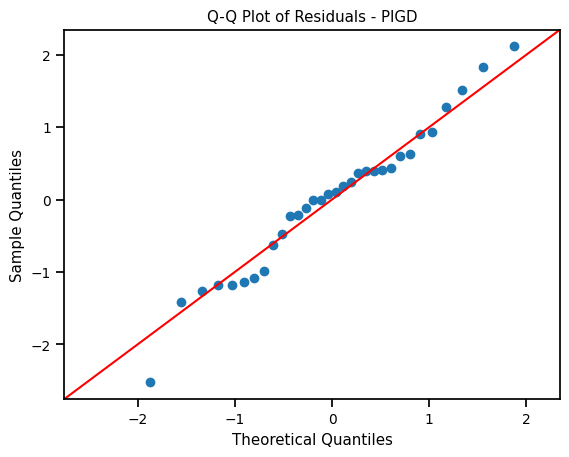

In [135]:
residuals = glm_mri_results.resid_response 

# Q-Q plot 
sm.qqplot(residuals, line="45", fit=True)
plt.title("Q-Q Plot of Residuals - PIGD") 
plt.show()

Figure 4.7 - Barplot of significant clinical features (CROWN PrD, left putamen)

In [136]:
# Clinical features that were highly significant and corresponding coefficients and p-values
data = {
    "Clinical feature": [
        "Age ", "Age at Symptoms", "Disease Duration", "MDS-NMS NMF Score"
    ],
    "Coefficient": [
        -20.0297, 19.8578, 8.0705, 0.7144
    ],
    "p-value": [
        0.00001, 0.00005, 0.00000, 0.001
    ],
    "Region": [
        "Putamen Left", "Putamen Left", "Putamen Left", "Putamen Left"
    ]
}

df = pd.DataFrame(data)
df = df.sort_values(by="Coefficient", key=abs, ascending=False)

# plotting horizontal bar plot
fig_bar = px.bar(
    df,
    x="Coefficient",
    y="Clinical feature",
    color="Coefficient",
    color_continuous_scale=px.colors.diverging.RdYlGn,
    orientation="h",
    title="PIGD Group: Significant Clinical Features for CROWN PrD in Putamen Left",
    labels={"Coefficient": "Coefficient Value", "Clinical feature": "Clinical feature"},
    category_orders={"Clinical feature": df["Clinical feature"].tolist()}  # maintain sorted order
)

for i, row in df.iterrows():
    fig_bar.add_annotation(
        x=row["Coefficient"],
        y=row["Clinical feature"],
        text=f"p={row['p-value']:.5f}", # annotations of p-values
        showarrow=False,
        font=dict(size=16, color="black"),
        align="center",
        xanchor="right" if row["Coefficient"] < 0 else "left", # left if negative and right if positive coefficients
        xshift=-5 if row["Coefficient"] < 0 else 5
    )

fig_bar.update_layout(
    coloraxis_colorbar=dict(title="Coefficient (\u03B2<sub>k</sub>)"), # color bar for coefficient values, right side
    yaxis=dict(
        title="Clinical Feature", # title clinical feature y-axis
        title_font=dict(size=22), 
        tickfont=dict(size=16),    
        categoryorder="total ascending"
    ),
    xaxis=dict(
        title="Coefficient (\u03B2<sub>k</sub>)", # title coefficients x-axis
        title_font=dict(size=22), 
        tickfont=dict(size=16)
    ),
    showlegend=False,
    title=dict(font=dict(size=26), x=0.5),
    margin=dict(l=150, r=20, t=50, b=20)  
)

fig_bar.update_traces(marker_line_width=0.5)
fig_bar.show()


In [137]:
fig_bar.write_html("GLM_PIGD_CROWN_PRD_PL.html")

## TD

Code used to generate results shown in Tables 4.9, 4.10 and 4.11: MRI features with significant clinical features in SNpc, LC and putamen respectively

In [138]:
# extracting feature names, clinical and MRI
td_mri_feature_names = df_td.columns[17:].tolist()
td_clinical_feature_names = df_td.columns[:17].tolist()

# the scaled clinical and MRI datasets with intercept column added with sm.add_constant
td_mri_scaled_df = pd.DataFrame(td_mri_scaled, columns=td_mri_feature_names)
td_clinical_scaled_df = pd.DataFrame(td_clinical_scaled, columns=td_clinical_feature_names)
td_clinical_with_intercept = sm.add_constant(td_clinical_scaled_df)

significant_results_td = []

# looping through each MRI feature and fitting Gaussian GLM
for feature in td_mri_scaled_df.columns:
    glm_mri = sm.GLM(td_mri_scaled_df[feature], td_clinical_with_intercept, family=sm.families.Gaussian())
    glm_mri_results = glm_mri.fit()

    # Clinical features - significant (p-value < 0.001)
    significant_features = glm_mri_results.pvalues[1:] < 0.001  # exclude the intercept
    if significant_features.any():
        print(f"Results for MRI feature: {feature}")
        print(glm_mri_results.summary())
        print("\n")

        # dataframe for storing MRI features with significant clinical predictors, for reporting in thesis
        significant_results_td.append({
            'MRI_Feature': feature,
            'Pseudo_R2_CS': round(1 - np.exp((glm_mri_results.llnull - glm_mri_results.llf) * (2 / glm_mri_results.nobs)), 4),
            'Significant_Predictors': ", ".join(glm_mri_results.pvalues[1:][significant_features].index),
            'P_Values': ", ".join([f"{pval:.5f}" for pval in glm_mri_results.pvalues[1:][significant_features]])  
        })

significant_results_td_df = pd.DataFrame(significant_results_td)
significant_results_td_df.to_csv("td_significant_mri_features.csv", index=False)


Results for MRI feature: SN_L STAGE_MRA_e3_reg_mni
                     Generalized Linear Model Regression Results                     
Dep. Variable:     SN_L STAGE_MRA_e3_reg_mni   No. Observations:                   20
Model:                                   GLM   Df Residuals:                        4
Model Family:                       Gaussian   Df Model:                           15
Link Function:                      Identity   Scale:                         0.36833
Method:                                 IRLS   Log-Likelihood:                -2.2965
Date:                       Sun, 01 Jun 2025   Deviance:                       1.4733
Time:                               14:02:48   Pearson chi2:                     1.47
No. Iterations:                            3   Pseudo R-squ. (CS):             0.9640
Covariance Type:                   nonrobust                                         
                           coef    std err          z      P>|z|      [0.025      0.975]


Breusch-Pagan test to make sure there is no heteroscedasticity in the residuals

In [139]:
residuals = glm_mri_results.resid_response # extracting response residuals

test_stat, p_value, _, _ = het_breuschpagan(residuals, glm_mri_results.model.exog)
if p_value < 0.05:
    print("There is heteroscedasticity in the model.")
else:
    print("No heteroscedasticity detected.")

No heteroscedasticity detected.


In [140]:
residuals = glm_mri_results.resid_response

exog = glm_mri_results.model.exog # design matrix

# Breusch-Pagan test
_, pval_breusch_pagan, _, _ = het_breuschpagan(residuals, exog)

print(f"Breusch-Pagan test p-value: {pval_breusch_pagan}")

Breusch-Pagan test p-value: 0.5999511385150395


QQ plot for assessing normality in the residuals, using sm.qqplot function, with 45 degree line

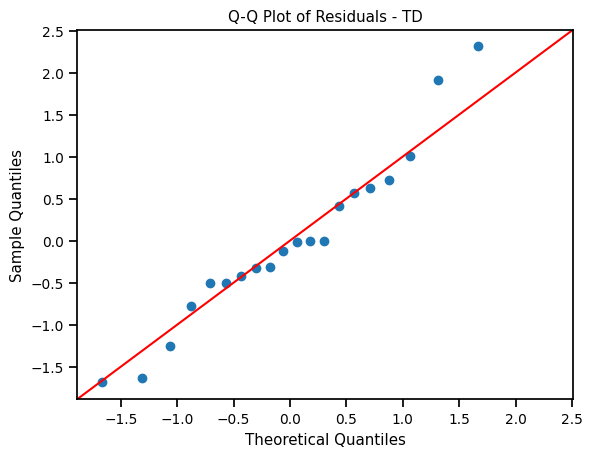

In [141]:
residuals = glm_mri_results.resid_response

# Q-Q plot 
sm.qqplot(residuals, line="45", fit=True)
plt.title("Q-Q Plot of Residuals - TD")
plt.show()

Figure 4.9 - Barplot of significant clinical features (R2*, all LC hemispheres)

In [142]:
# Clinical features that were highly significant and corresponding coefficients and p-values
data = {
    "Clinical feature": [
        "MDS-UPDRS IV (LC Left)", "MDS-NMS NMF (LC Left)", 
        "MDS-UPDRS I (LC Right)", "MDS-UPDRS II (LC Right)", "MDS-UPDRS III (LC Right)", 
        "MDS-UPDRS IV (LC Right)", "MDS-UPDRS total (LC Right)", "MDS-NMS NMF (LC Right)", 
        "MDS-UPDRS IV (LC)", "MDS-NMS NMF (LC)"
    ],
    "Coefficient": [
        -0.9988, 0.8059, 
        -2.5030, -2.7677, -5.3196, -0.9322, 7.5069, 0.8323, 
        -1.0184, 0.7736
    ],
    "p-value": [
        0.00010, 0.00012, 
        0.00041, 0.00074, 0.00017, 0.00000, 0.00034, 0.00000, 
        0.00024, 0.00068
    ],
    "Region": [
        "LC Left", "LC Left", 
        "LC Right", "LC Right", "LC Right", "LC Right", "LC Right", "LC Right", 
        "LC", "LC"
    ]
}

df = pd.DataFrame(data)
df = df.sort_values(by="Coefficient", key=abs, ascending=False)

# plotting horizontal bar plot
fig_bar = px.bar(
    df,
    x="Coefficient",
    y="Clinical feature",
    color="Coefficient",
    color_continuous_scale=px.colors.diverging.RdYlGn,
    orientation="h",
    title="TD Group: R2* and Significant Clinical Features (LC: Combined, Left and Right)",
    labels={"Coefficient": "Coefficient Value", "Clinical feature": "Clinical feature"},
    category_orders={"Clinical feature": df["Clinical feature"].tolist()}  # maintain sorted order
)

for i, row in df.iterrows():
    fig_bar.add_annotation(
        x=row["Coefficient"],
        y=row["Clinical feature"],
        text=f"p={row['p-value']:.5f}", # annotations of p-value
        showarrow=False,
        font=dict(size=16, color="black"),
        align="center",
        xanchor="right" if row["Coefficient"] < 0 else "left", # left if negative and right if positive coefficients
        xshift=-5 if row["Coefficient"] < 0 else 5
    )

fig_bar.update_layout(
    coloraxis_colorbar=dict(title="Coefficient (\u03B2<sub>k</sub>)"), # color bar for coefficients values, right side
    yaxis=dict(
        title="Clinical Feature", # title clinical features on y-axis
        title_font=dict(size=22), 
        tickfont=dict(size=16),    
        categoryorder="total ascending"
    ),
    xaxis=dict(
        title="Coefficient (\u03B2<sub>k</sub>)", # title coefficients of x-axis
        title_font=dict(size=22), 
        tickfont=dict(size=16)
    ),
    showlegend=False,
    title=dict(font=dict(size=26), x=0.5),
    margin=dict(l=150, r=20, t=50, b=20)  
)

fig_bar.update_traces(marker_line_width=0.5)
fig_bar.show()

In [143]:
fig_bar.write_html("GLM_TD_R2S_LC.html")


Figure 4.8 - barplot of significant clinical features (pSWIM, all SNpc hemispheres)

In [144]:
# Clinical features that were highly significant and corresponding coefficients and p-values
data = {
    "Clinical feature": [
        "Gender (SNpc Left)", "Age at Diagnosis (SNpc Left)", "MDS-UPDRS I (SNpc Left)", 
        "MDS-UPDRS II (SNpc Left)", "MDS-UPDRS III (SNpc Left)", "MDS-UPDRS Total (SNpc Left)", 
        "MoCA (SNpc Left)", "BSIT (SNpc Left)", "MoCA (SNpc Right)", "MoCA (SNpc)", 
        "BSIT (SNpc)"
    ],
    "Coefficient": [
        1.4040, -3.8791, -3.8726, -6.1027, -9.4145, 14.9341, -1.7264, 1.2014, 
        -1.2075, -1.2623, 1.1199 
    ],
    "p-value": [
        0.00001, 0.00022, 0.00087, 0.00001, 0.00005, 0.00001, 0.00000, 0.00000, 
        0.00043, 0.00080, 0.00030
    ],
    "Region": [
        "SNpc Left", "SNpc Left", "SNpc Left", "SNpc Left", "SNpc Left", "SNpc Left", "SNpc Left", "SNpc Left", 
        "SNpc Right", "SNpc", "SNpc"
    ]
}


df = pd.DataFrame(data)

if df["Coefficient"].notna().all():
    df = df.sort_values(by="Coefficient", key=abs, ascending=False)

# plotting horizontal bar plot
fig_bar = px.bar(
    df,
    x="Coefficient",
    y="Clinical feature",
    color="Coefficient",
    color_continuous_scale=px.colors.diverging.RdYlGn,
    orientation="h",
    title="TD Group: pSWIM and Significant Clinical Features (SNpc: Combined, Left and Right)",
    labels={"Coefficient": "Coefficient Value", "Clinical feature": "Clinical Feature"},
    category_orders={"Clinical feature": df["Clinical feature"].tolist()}  # maintain sorted order
)

for i, row in df.iterrows():
    fig_bar.add_annotation(
        x=row["Coefficient"],
        y=row["Clinical feature"],
        text=f"p={row['p-value']:.5f}", # annotations of p-value
        showarrow=False,
        font=dict(size=16, color="black"),
        align="center",
        xanchor="right" if row["Coefficient"] < 0 else "left", # left if negative and right if positive coefficients
        xshift=-5 if row["Coefficient"] < 0 else 5
    )

fig_bar.update_layout(
    coloraxis_colorbar=dict(title="Coefficient (\u03B2<sub>k</sub>)"), # color bar for coefficient values, right side
    yaxis=dict(
        title="Clinical Feature", # title clinical features on y-axis
        title_font=dict(size=22), 
        tickfont=dict(size=16),    
        categoryorder="total ascending"
    ),
    xaxis=dict(
        title="Coefficient (\u03B2<sub>k</sub>)", # title coefficients on x-axis
        title_font=dict(size=22), 
        tickfont=dict(size=16)
    ),
    showlegend=False,
    title=dict(font=dict(size=26), x=0.5),
    margin=dict(l=150, r=20, t=50, b=20)  
)

fig_bar.update_traces(marker_line_width=0.5)
fig_bar.show()

In [145]:
fig_bar.write_html("GLM_TD_pSWIM_SNpc.html")

Figure 4.10 - barplot of significant clinical features (T2* MIP, combined putamen)

In [146]:
# Clinical features that were highly significant and corresponding coefficients and p-values
data = {
    'Clinical feature': ['Gender', 'Age', 'Age at Diagnosis', 'Age at Symptoms', 
                  'Disease Duration', 'MDS-UPDRS I', 'MDS-UPDRS II', 'MDS-UPDRS III', 
                  'MDS-UPDRS IV', 'MDS-UPDRS Total', 'MDS-NMS NMF', 'MoCA', 'BSIT'],
    'Coefficient': [1.6620, -40.4678, -5.2999, 45.1302, 13.7701, -5.7663, -8.3768, -12.8780, 
                    -0.8883, 19.7377, -0.8911, -1.0894, 1.2377],
    'p-value': [0.00000, 0.00000, 0.00000, 0.00000, 0.00000, 0.00000, 0.00000, 0.00000, 0.00000, 
                0.00000, 0.00002, 0.00000, 0.00000]
}


df = pd.DataFrame(data)
if df["Coefficient"].notna().all():
    df = df.sort_values(by="Coefficient", key=abs, ascending=False)

# plotting horizontal bar plot
fig_bar = px.bar(
    df,
    x="Coefficient",
    y="Clinical feature",
    color="Coefficient",
    color_continuous_scale=px.colors.diverging.RdYlGn,
    orientation="h",
    title="TD Group: T2* MIP and Significant Clinical Features (Putamen)",
    labels={"Coefficient": "Coefficient Value", "Clinical feature": "Clinical Feature"},
    category_orders={"Clinical feature": df["Clinical feature"].tolist()}  # maintain sorted order
)

for i, row in df.iterrows():
    fig_bar.add_annotation(
        x=row["Coefficient"],
        y=row["Clinical feature"],
        text=f"p={row['p-value']:.5f}", # annotations of p-value
        showarrow=False,
        font=dict(size=16, color="black"),
        align="center",
        xanchor="right" if row["Coefficient"] < 0 else "left", # left if negative and right if positive coefficient
        xshift=-5 if row["Coefficient"] < 0 else 5
    )

fig_bar.update_layout(
    coloraxis_colorbar=dict(title="Coefficient (\u03B2<sub>k</sub>)"), # color bar for coefficient values, right side
    yaxis=dict(
        title="Clinical Feature", # title clinical features on y-axis
        title_font=dict(size=22), 
        tickfont=dict(size=16),    
        categoryorder="total ascending"
    ),
    xaxis=dict(
        title="Coefficient (\u03B2<sub>k</sub>)", # title coefficients on x-axis
        title_font=dict(size=22), 
        tickfont=dict(size=16)
    ),
    showlegend=False,
    title=dict(font=dict(size=26), x=0.5),
    margin=dict(l=150, r=20, t=50, b=20)  
)

fig_bar.update_traces(marker_line_width=0.5)
fig_bar.show()

In [147]:
fig_bar.write_html("GLM_TD_T2S_P.html")